# Spring 2020 - MFE 230E - PS7
Note: Please email mfe230e@gmail.com if there are any corrections you would like to make to these solutions.

**Notes:** <br>
- This notebook only presents the code. Cf. the pdf for explanations, derivations, and answers.
- The following builds a lot on the code developed in the Python Labs, and uses the lib files from the Python Labs. <br>
- If running the cell block right below gives the following warning: ``FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated...``, then this is an issue with the ``scipy`` library. Please update this library by running the following code in your Jupyter notebook:
``!pip install --upgrade scipy``

In [1]:
from lib import *

set_stuff()

WARNING (theano.configdefaults): install mkl with `conda install mkl-service`: No module named 'mkl'


In [2]:
import pyflux as pf
from pykalman import KalmanFilter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from statsmodels.regression.rolling import RollingOLS

In [3]:
import matplotlib.style
#import matplotlib as mpl
plt.style.use('default')

## Problem 1

#### Load data and clean column names

In [4]:
# Note: I reformatted the date to have 4 digits for the year in order to avoid issues when converting to datetime
# If not: by default, any year below 69 is understood as 20XX (e.g. 63 -> 2063)
df = pd.read_csv('PS7_LP_Portfolios.csv',header=[0,1],index_col=0)
df.index = pd.PeriodIndex(df.index,freq='M') # To match the format from the FF dataset below

In [5]:
df.head()

,accruals,Unnamed: 2_level_0,Unnamed: 3_level_0,Unnamed: 4_level_0,Unnamed: 5_level_0,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,Unnamed: 9_level_0,Unnamed: 10_level_0,...,valueem,Unnamed: 362_level_0,Unnamed: 363_level_0,Unnamed: 364_level_0,Unnamed: 365_level_0,Unnamed: 366_level_0,Unnamed: 367_level_0,Unnamed: 368_level_0,Unnamed: 369_level_0,Unnamed: 370_level_0
date,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10
1963-11,-0.007,0.007,-0.007,-0.013,0.001,-0.013,0.020,-0.003,-0.009,-0.065,...,-0.016,-0.006,-0.006,0.017,-0.013,-0.019,-0.009,-0.000,-0.020,0.010
1963-12,0.007,-0.009,-0.003,0.041,0.057,0.034,0.013,0.012,0.032,-0.002,...,0.021,0.034,0.030,0.025,0.016,0.015,0.016,0.026,0.024,0.002
1964-01,0.048,-0.017,0.032,0.019,0.041,0.031,0.036,0.024,0.049,0.015,...,0.031,0.022,0.016,0.036,0.024,0.029,0.001,0.024,0.041,0.017
1964-02,0.021,0.042,0.020,0.004,0.018,0.014,0.004,0.042,0.038,0.013,...,0.021,0.014,0.022,0.004,0.020,0.021,0.039,0.025,0.042,0.044
1964-03,0.012,0.034,0.008,0.027,0.013,0.015,0.012,0.035,0.047,0.011,...,0.008,0.015,0.035,0.003,0.022,0.054,0.031,0.036,0.036,0.036


In [6]:
# Rename columns
factors = ['accruals','aturnover','cfp','ciss','divp','ep','gmargins','growth','igrowth','indmom','indmomrev','indrrev',
        'indrrevlv','inv','invcap','ivol','lev','lrrev','mom','mom12','momrev','noa','price','prof','roaa','roea',
        'season','sgrowth','shvol','size','sp','strev','valmom','valmomprof','valprof','value','valueem']

In [7]:
for i in range(1,371):
    col_old = 'Unnamed: '+str(i)+'_level_0'
    col_new = factors[(i-1)//10]
    df.rename(columns={col_old:col_new},inplace=True)

In [8]:
df.columns = df.columns.map('_'.join)

In [9]:
# Convert to percentage points
df = df*100

In [10]:
df.head()

,accruals_p1,accruals_p2,accruals_p3,accruals_p4,accruals_p5,accruals_p6,accruals_p7,accruals_p8,accruals_p9,accruals_p10,...,valueem_p1,valueem_p2,valueem_p3,valueem_p4,valueem_p5,valueem_p6,valueem_p7,valueem_p8,valueem_p9,valueem_p10
1963-11,-0.742,0.743,-0.664,-1.316,0.054,-1.278,2.004,-0.297,-0.886,-6.516,...,-1.618,-0.627,-0.614,1.740,-1.271,-1.902,-0.918,-0.029,-2.013,0.955
1963-12,0.732,-0.892,-0.344,4.063,5.676,3.423,1.323,1.209,3.172,-0.215,...,2.084,3.360,3.006,2.505,1.607,1.457,1.593,2.626,2.442,0.191
1964-01,4.790,-1.656,3.184,1.935,4.105,3.113,3.582,2.368,4.858,1.539,...,3.069,2.227,1.570,3.569,2.385,2.851,0.098,2.363,4.051,1.749
1964-02,2.082,4.185,2.025,0.378,1.796,1.405,0.356,4.170,3.771,1.262,...,2.147,1.378,2.238,0.402,1.984,2.076,3.889,2.498,4.210,4.400
1964-03,1.237,3.446,0.758,2.695,1.312,1.538,1.203,3.481,4.736,1.069,...,0.829,1.514,3.516,0.337,2.181,5.408,3.090,3.561,3.647,3.592


#### (a) Summarize the most important aspects of the data.

Construct long-short portfolios

In [11]:
for factor in factors:
    df[factor+'_p10mp1'] = df[factor+'_p10'] - df[factor+'_p1']

Summarize

In [12]:
df.filter(regex='p10mp1').describe()
#df.filter(regex='p10mp1').describe().to_csv('output/tables/Q1a.csv')

,accruals_p10mp1,aturnover_p10mp1,cfp_p10mp1,ciss_p10mp1,divp_p10mp1,ep_p10mp1,gmargins_p10mp1,growth_p10mp1,igrowth_p10mp1,indmom_p10mp1,...,sgrowth_p10mp1,shvol_p10mp1,size_p10mp1,sp_p10mp1,strev_p10mp1,valmom_p10mp1,valmomprof_p10mp1,valprof_p10mp1,value_p10mp1,valueem_p10mp1
count,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,...,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000
mean,0.350,0.409,0.427,0.478,0.180,0.574,0.011,0.292,0.376,0.473,...,-0.048,-0.018,0.289,0.520,0.360,0.511,0.830,0.746,0.480,0.403
std,3.144,3.825,4.375,3.301,5.079,4.689,3.372,3.460,2.712,6.213,...,3.644,5.962,4.800,4.277,5.270,5.049,4.833,3.811,4.562,5.857
min,-12.568,-16.735,-18.174,-14.783,-23.602,-28.903,-11.388,-12.279,-10.271,-24.483,...,-16.220,-29.990,-20.706,-16.243,-24.603,-23.610,-21.653,-16.212,-17.338,-16.994
25%,-1.535,-1.794,-2.208,-1.493,-2.504,-1.828,-2.029,-1.839,-1.410,-2.856,...,-2.132,-3.218,-2.657,-2.179,-2.414,-2.048,-1.670,-1.622,-2.178,-2.553
50%,0.315,0.462,0.348,0.455,0.078,0.456,-0.048,0.228,0.388,0.919,...,0.101,0.098,0.066,0.469,0.292,0.733,0.835,0.769,0.240,0.106
75%,2.043,2.330,2.849,2.382,2.942,2.994,2.078,2.245,1.977,3.903,...,2.238,3.477,2.716,2.782,2.703,3.329,3.247,2.788,2.988,2.850
max,12.672,14.121,16.024,13.862,20.027,20.946,13.172,13.492,12.865,31.056,...,11.901,26.425,32.342,22.445,26.327,25.064,35.793,21.235,20.502,54.694


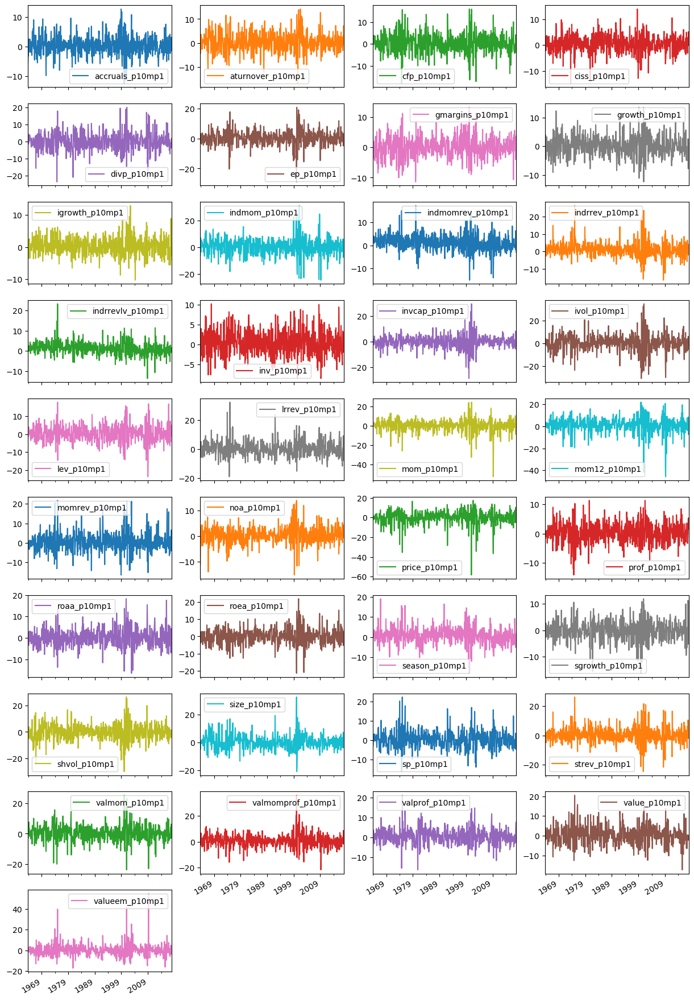

In [225]:
df.filter(regex='p10mp1').plot(figsize=(15,25),subplots=True,layout=(10,4))
plt.show()

#### (b) Compute the pricing errors from the 3- and 5-factor Fama-French models. Summarize the results.

In [12]:
# Load Fama-French factors
dt_start  = dt.datetime(1927, 1, 31)
ff5       = web.DataReader('F-F_Research_Data_5_Factors_2x3','famafrench', start=dt_start)
ff5       = ff5[0]

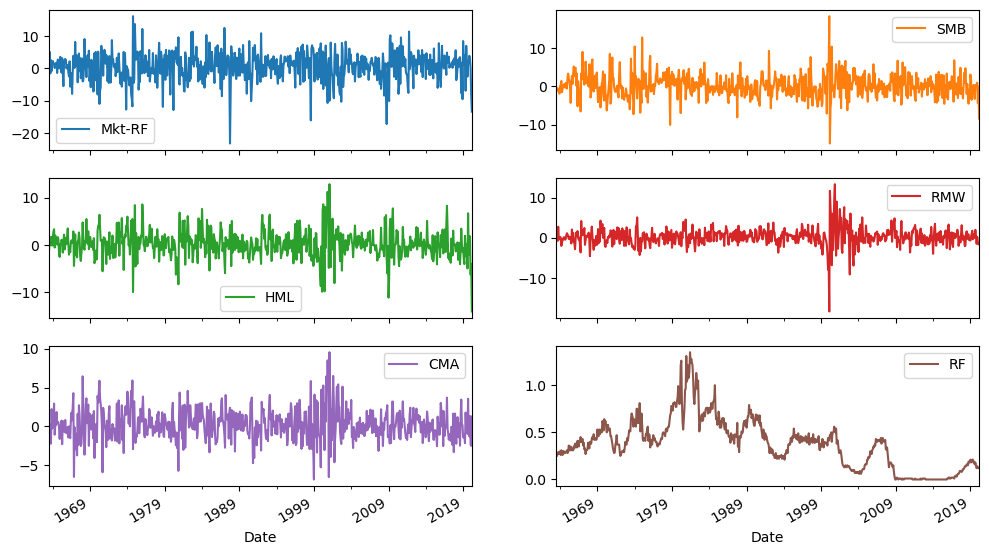

In [13]:
ff5.plot(figsize=(12,7),subplots=True,layout=(3,2))
plt.show()

In [14]:
# Merge dataframes
df_ff = df.merge(ff5, left_index=True, right_index=True, how='inner')

In [14]:
df_ff

,accruals_p1,accruals_p2,accruals_p3,accruals_p4,accruals_p5,accruals_p6,accruals_p7,accruals_p8,accruals_p9,accruals_p10,...,valmomprof_p10mp1,valprof_p10mp1,value_p10mp1,valueem_p10mp1,Mkt-RF,SMB,HML,RMW,CMA,RF
1963-11,-0.742,0.743,-0.664,-1.316,0.054,-1.278,2.004,-0.297,-0.886,-6.516,...,-1.083,0.772,-0.189,2.573,-0.850,-0.840,1.710,-0.450,2.220,0.270
1963-12,0.732,-0.892,-0.344,4.063,5.676,3.423,1.323,1.209,3.172,-0.215,...,-2.631,-4.196,-2.425,-1.893,1.830,-1.890,-0.120,0.080,-0.300,0.290
1964-01,4.790,-1.656,3.184,1.935,4.105,3.113,3.582,2.368,4.858,1.539,...,-0.660,0.721,-1.565,-1.319,2.240,0.080,1.590,0.220,1.500,0.300
1964-02,2.082,4.185,2.025,0.378,1.796,1.405,0.356,4.170,3.771,1.262,...,4.408,3.771,4.049,2.253,1.540,0.320,2.830,0.060,0.850,0.260
1964-03,1.237,3.446,0.758,2.695,1.312,1.538,1.203,3.481,4.736,1.069,...,6.590,3.800,0.626,2.763,1.410,1.410,3.320,-2.010,2.930,0.310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08,-0.020,-0.561,0.391,0.858,0.408,-0.058,2.151,-0.563,1.841,0.206,...,3.841,-2.291,-1.921,-3.825,0.160,-1.850,-2.240,0.280,-2.420,0.090
2017-09,2.729,3.275,4.414,1.791,1.458,1.923,0.670,2.224,2.423,1.248,...,-1.699,0.624,-0.272,5.010,2.510,4.840,3.030,-1.180,1.630,0.090
2017-10,1.986,0.967,1.455,1.429,2.679,-0.212,5.317,-0.942,3.255,5.089,...,8.645,5.192,0.096,-3.200,2.250,-1.970,-0.050,1.040,-3.330,0.090
2017-11,3.171,2.986,3.521,2.530,2.412,3.833,3.132,5.732,3.467,2.040,...,1.566,7.753,-2.238,-3.058,3.120,-0.430,-0.040,3.120,0.000,0.080


In [15]:
# Compute excess returns
ex_rets = [] # List of all portfolios
for factor in factors:
    for i in range(1,11):
        portfolio = factor + '_p' + str(i)
        df_ff['ex_' + portfolio] = df_ff[portfolio] - df_ff['RF']
        ex_rets.append('ex_' + portfolio)

In [81]:
# FF3
nlags             = 12 # For Newey-West
FF3               = ['Mkt-RF','SMB','HML']
sm_models_FF3     = []
sm_results_FF3    = []
sm_results_NW_FF3 = []
results_FF3       = []
for ex_ret in ex_rets:
    model = sm.OLS(df_ff[ex_ret], sm.add_constant(df_ff[FF3]), missing='drop')
    results = model.fit()
    results_NW = results.get_robustcov_results(cov_type='HAC', maxlags=nlags)
    sm_models_FF3.append(model)
    sm_results_FF3.append(results)
    sm_results_NW_FF3.append(results_NW)
    row = []
    row.append(ex_ret)
    row.append(results.params['const'])
    row.append(results_NW.bse[0])
    row.append(results.params['Mkt-RF'])
    row.append(results_NW.bse[1])
    row.append(results.params['SMB'])
    row.append(results_NW.bse[2])
    row.append(results.params['HML'])
    row.append(results_NW.bse[3])
    row.append(results_NW.rsquared_adj)
    row.append(results_NW.predict(sm.add_constant(df_ff[FF3])-results_NW.params[0]).mean())
    results_FF3.append(row)
results_FF3 = pd.DataFrame(results_FF3)
results_FF3.rename(columns={0:'portfolio',1:'alpha',2:'std_alpha',
                            3:'beta_MKT',4:'std_beta_MKT',
                            5:'beta_SMB',6:'std_beta_SMB',
                            7:'beta_HML',8:'std_beta_HML',
                            9:'adj_R2',10:'mean_predict'},inplace=True)
results_FF3 = results_FF3.set_index('portfolio')

In [79]:
# FF5
nlags             = 12 # For Newey-West
FF5               = ['Mkt-RF','SMB','HML','RMW','CMA']
sm_models_FF5     = []
sm_results_FF5    = []
sm_results_NW_FF5 = []
results_FF5       = []
for ex_ret in ex_rets:
    model = sm.OLS(df_ff[ex_ret], sm.add_constant(df_ff[FF5]), missing='drop')
    results = model.fit()
    results_NW = results.get_robustcov_results(cov_type='HAC', maxlags=nlags)
    sm_models_FF5.append(model)
    sm_results_FF5.append(results)
    sm_results_NW_FF5.append(results_NW)
    row = []
    row.append(ex_ret)
    row.append(results.params['const'])
    row.append(results_NW.bse[0])
    row.append(results.params['Mkt-RF'])
    row.append(results_NW.bse[1])
    row.append(results.params['SMB'])
    row.append(results_NW.bse[2])
    row.append(results.params['HML'])
    row.append(results_NW.bse[3])
    row.append(results.params['RMW'])
    row.append(results_NW.bse[4])
    row.append(results.params['CMA'])
    row.append(results_NW.bse[5])
    row.append(results_NW.rsquared_adj)
    row.append(results_NW.predict(sm.add_constant(df_ff[FF5])-results_NW.params[0]).mean())
    results_FF5.append(row)
results_FF5 = pd.DataFrame(results_FF5)
results_FF5.rename(columns={0:'portfolio',1:'alpha',2:'std_alpha',
                            3:'beta_MKT',4:'std_beta_MKT',
                            5:'beta_SMB',6:'std_beta_SMB',
                            7:'beta_HML',8:'std_beta_HML',
                            9:'beta_RMW',10:'std_beta_RMW',
                            11:'beta_CMA',12:'std_beta_CMA',
                            13:'adj_R2',14:'mean_predict'},inplace=True)
results_FF5 = results_FF5.set_index('portfolio')

In [76]:
results_FF3.describe()
#results_FF3.describe().to_csv('output/tables/Q1b_FF3.csv')

,alpha,std_alpha,beta_MKT,std_beta_MKT,beta_SMB,std_beta_SMB,beta_HML,std_beta_HML,adj_R2
count,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000
mean,0.017,0.076,1.006,0.027,0.059,0.044,0.081,0.057,0.857
std,0.178,0.022,0.095,0.011,0.233,0.018,0.230,0.021,0.050
min,-1.082,0.016,0.743,0.005,-0.276,0.009,-0.657,0.009,0.627
25%,-0.057,0.062,0.948,0.021,-0.082,0.032,-0.040,0.043,0.833
50%,0.026,0.071,0.984,0.024,-0.017,0.040,0.089,0.054,0.862
75%,0.111,0.085,1.039,0.029,0.115,0.051,0.204,0.070,0.889
max,0.684,0.166,1.394,0.101,1.258,0.123,0.926,0.180,0.988


In [21]:
# RMSE
np.sqrt(np.sum(results_FF3['alpha']**2,axis=0)/len(ex_rets))

0.1783790395885648

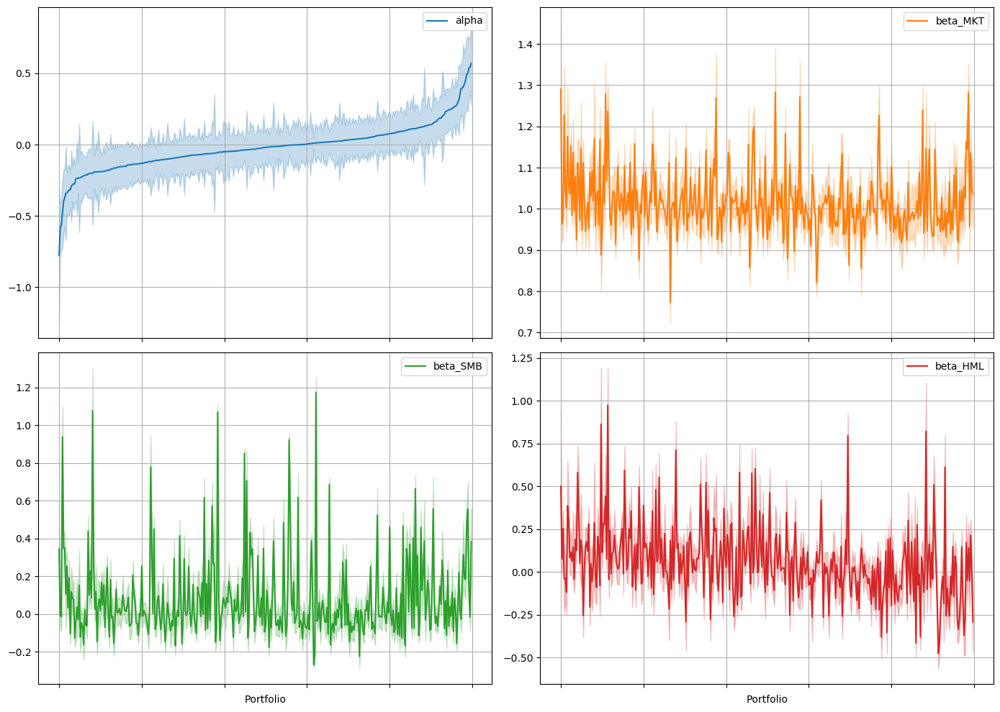

In [45]:
to_plot = results_FF5.sort_values('alpha')
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
var = ['alpha','beta_MKT','beta_SMB','beta_HML']

f,a = plt.subplots(nrows=2,ncols=2,figsize=(14,10))
for i in range(0,4):
    a = plt.subplot(2,2,i+1)
    a.plot(to_plot.index,to_plot[var[i]],color=colors[i])
    a.fill_between(to_plot.index,to_plot[var[i]]-1.96*to_plot['std_'+var[i]],
                          to_plot[var[i]]+1.96*to_plot['std_'+var[i]],
                          color=colors[i],alpha=0.25)
    a.set_xticks([i*37*2 for i in range(0,6)])
    a.set_xticklabels([])
    a.grid(True)
    a.legend([var[i]])
    if i//2 == 1:
        a.set_xlabel('Portfolio')
plt.tight_layout()
#plt.savefig('output/figures/Q1b_FF3.pdf')
plt.show()

In [80]:
results_FF5.describe()
#results_FF5.describe().to_csv('output/tables/Q1b_FF5.csv')

,alpha,std_alpha,beta_MKT,std_beta_MKT,beta_SMB,std_beta_SMB,beta_HML,std_beta_HML,beta_RMW,std_beta_RMW,beta_CMA,std_beta_CMA,adj_R2,mean_predict
count,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000,370.000
mean,-0.020,0.079,1.016,0.024,0.075,0.039,0.058,0.057,0.076,0.065,0.052,0.081,0.866,0.604
std,0.159,0.027,0.076,0.009,0.209,0.017,0.208,0.025,0.199,0.031,0.210,0.036,0.049,0.157
min,-0.777,0.018,0.773,0.006,-0.268,0.009,-0.474,0.012,-0.885,0.014,-0.653,0.021,0.632,-0.008
25%,-0.106,0.062,0.971,0.019,-0.053,0.028,-0.070,0.041,-0.015,0.046,-0.057,0.060,0.844,0.514
50%,-0.019,0.073,1.003,0.023,0.015,0.035,0.041,0.051,0.115,0.058,0.075,0.073,0.874,0.596
75%,0.048,0.088,1.046,0.028,0.129,0.044,0.154,0.066,0.215,0.075,0.180,0.092,0.897,0.687
max,0.569,0.243,1.290,0.083,1.174,0.124,0.973,0.228,0.441,0.238,0.699,0.300,0.989,1.106


In [58]:
# RMSE
np.sqrt(np.sum(results_FF5['alpha']**2,axis=0)/len(ex_rets))

0.15986530038079044

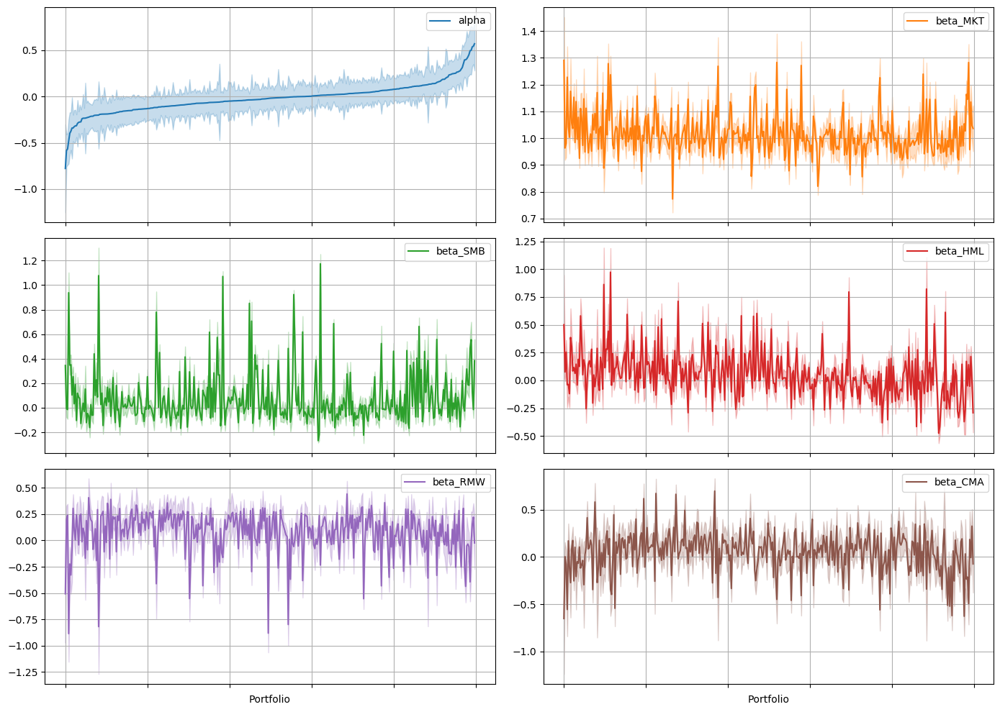

In [48]:
to_plot = results_FF5.sort_values('alpha')
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
var = ['alpha','beta_MKT','beta_SMB','beta_HML','beta_RMW','beta_CMA']

f,a = plt.subplots(nrows=3,ncols=2,figsize=(14,10))
#a = to_plot[var].plot(figsize=(10,20),subplots=True)
for i in range(0,6):
    a = plt.subplot(3,2,i+1)
    a.plot(to_plot.index,to_plot[var[i]],color=colors[i])
    a.fill_between(to_plot.index,to_plot[var[i]]-1.96*to_plot['std_'+var[i]],
                          to_plot[var[i]]+1.96*to_plot['std_'+var[i]],
                          color=colors[i],alpha=0.25)
    a.set_xticks([i*37*2 for i in range(0,6)])
    a.set_xticklabels([])
    a.grid(True)
    a.legend([var[i]])
    if i//2 == 2:
        a.set_xlabel('Portfolio')
plt.tight_layout()
#plt.savefig('output/figures/Q1b_FF5.pdf')
plt.show()

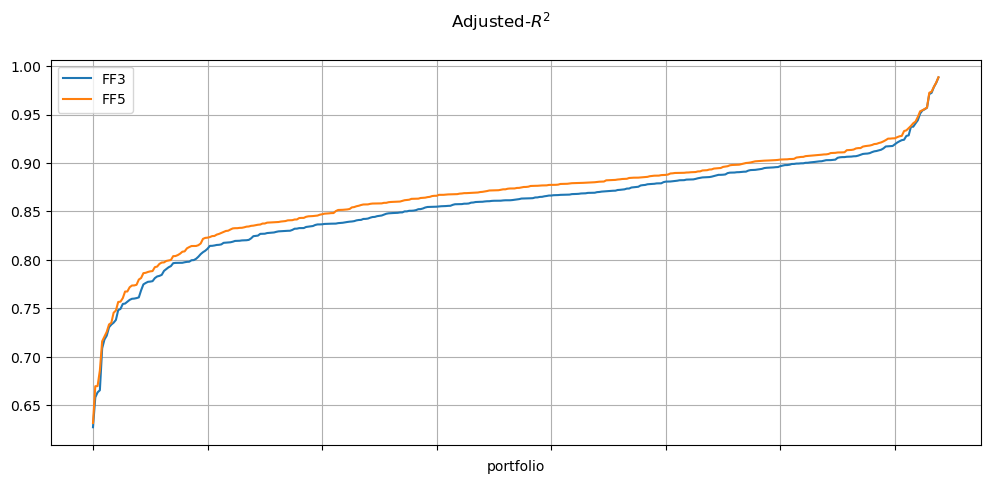

In [100]:
# Adjusted-R2
f,a = plt.subplots(figsize=(12,5))
results_FF3['adj_R2'].copy().sort_values().plot()
results_FF5['adj_R2'].copy().sort_values().plot()
a.set_xticklabels([])
a.grid(True)
a.legend(['FF3','FF5'])
f.suptitle('Adjusted-$R^2$')
#plt.savefig('output/figures/Q1b_adjR2')
plt.show()

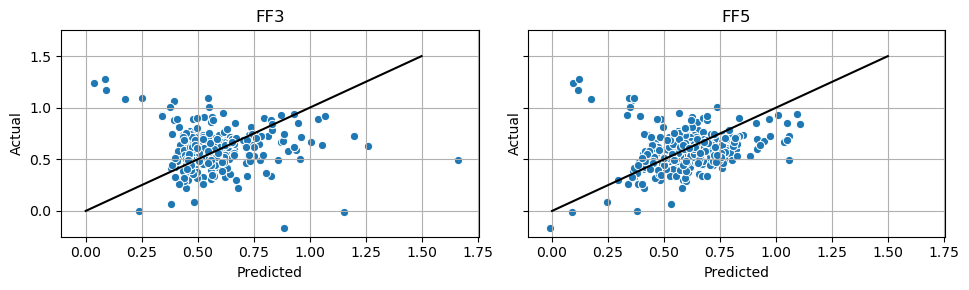

In [98]:
# Predicted vs. actual excess returns (% per month)
f,a = plt.subplots(nrows=1,ncols=2,figsize=(10,3),sharex=True,sharey=True)

sns.scatterplot(results_FF3['mean_predict'],df_ff[ex_rets].mean(),ax=a[0])
a[0].plot([0,1.5],[0,1.5],color='k') # 45-degree line
a[0].grid(True)
a[0].set_title('FF3')
a[0].set_xlabel('Predicted')
a[0].set_ylabel('Actual')
a[0].set_ylim([-0.25,1.75])

sns.scatterplot(results_FF5['mean_predict'],df_ff[ex_rets].mean(),ax=a[1])
a[1].plot([0,1.5],[0,1.5],color='k') # 45-degree line
a[1].grid(True)
a[1].set_title('FF5')
a[1].set_xlabel('Predicted')
a[1].set_ylabel('Actual')

plt.tight_layout()
#plt.savefig('output/figures/Q1b_actual_vs_pred_pppermonth.pdf')
plt.show()

#### (c) PCA, manually.

In [69]:
# Compute covariance and correlation matrix
# The correlation matrix is equivalent to standardizing the data
X = df_ff[ex_rets]
X_tilde = df_ff[ex_rets]/df_ff[ex_rets].std()
cov_X = X.cov()
corr_X = X.corr()

In [70]:
# Eigen-value decomposition
lambdas_cov, vs_cov = np.linalg.eig(cov_X)
lambdas_corr, vs_corr = np.linalg.eig(corr_X)

In [71]:
# Sort
idx_cov = lambdas_cov.argsort()[::-1]  
lambdas_cov = lambdas_cov[idx_cov]
vs_cov = vs_cov[:,idx_cov]
#vs = vs[idx,:]

idx_corr = lambdas_corr.argsort()[::-1]  
lambdas_corr = lambdas_corr[idx_corr]
vs_corr = vs_corr[:,idx_corr]

In [72]:
# Project on data
PCA_cov = np.dot(X, vs_cov)
PCA_cov = pd.DataFrame(PCA_cov,index=df.index.copy())
PCA_corr = np.dot(X_tilde, vs_corr)
PCA_corr = pd.DataFrame(PCA_corr,index=df.index.copy())

In [73]:
# Cosmetics
for i in range(0,370):
    PCA_cov.rename(columns={i:'PC'+str(i+1)},inplace=True)
for i in range(0,370):
    PCA_corr.rename(columns={i:'PC'+str(i+1)},inplace=True)

In [55]:
PCA_cov.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC361,PC362,PC363,PC364,PC365,PC366,PC367,PC368,PC369,PC370
count,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,...,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000
mean,11.213,1.531,-0.618,1.664,0.736,-0.471,-0.859,1.130,0.188,0.232,...,0.035,-0.007,0.019,0.041,-0.010,0.027,-0.017,-0.010,-0.024,-0.018
std,86.108,15.668,13.834,11.406,6.996,6.090,5.822,5.487,5.032,4.837,...,0.193,0.190,0.177,0.171,0.156,0.151,0.149,0.128,0.108,0.094
min,-453.150,-116.468,-83.548,-58.888,-23.448,-28.246,-26.193,-44.810,-26.250,-39.725,...,-0.524,-0.669,-0.509,-0.635,-0.430,-0.433,-0.474,-0.425,-0.306,-0.319
25%,-36.881,-6.196,-7.107,-3.683,-3.027,-3.488,-3.815,-1.492,-2.509,-2.409,...,-0.089,-0.134,-0.101,-0.067,-0.123,-0.078,-0.108,-0.088,-0.098,-0.078
50%,17.750,1.532,-0.236,2.015,0.756,-0.315,-0.701,1.276,0.043,0.313,...,0.038,-0.014,0.016,0.037,-0.010,0.038,-0.023,-0.016,-0.026,-0.015
75%,66.392,9.527,6.543,7.104,4.911,2.715,2.230,3.792,2.977,2.867,...,0.169,0.122,0.138,0.163,0.089,0.129,0.076,0.075,0.044,0.046
max,311.664,71.487,52.411,63.911,30.958,33.680,25.924,28.787,19.810,22.668,...,0.675,0.614,0.607,0.608,0.568,0.484,0.489,0.413,0.358,0.292


In [56]:
PCA_corr.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC361,PC362,PC363,PC364,PC365,PC366,PC367,PC368,PC369,PC370
count,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,...,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000
mean,2.366,0.273,0.054,-0.279,-0.143,-0.084,-0.168,-0.219,-0.080,-0.053,...,0.007,0.003,0.003,-0.010,0.002,0.003,-0.006,-0.002,0.003,0.006
std,17.569,2.846,2.593,2.121,1.427,1.231,1.146,1.041,0.993,0.941,...,0.041,0.040,0.038,0.036,0.034,0.033,0.031,0.027,0.023,0.021
min,-93.292,-23.388,-11.443,-12.242,-6.453,-5.854,-4.786,-4.053,-5.963,-5.169,...,-0.116,-0.128,-0.112,-0.133,-0.112,-0.085,-0.090,-0.090,-0.085,-0.066
25%,-7.471,-1.110,-1.440,-1.333,-0.968,-0.730,-0.748,-0.749,-0.650,-0.509,...,-0.021,-0.022,-0.022,-0.035,-0.022,-0.019,-0.027,-0.018,-0.011,-0.009
50%,3.610,0.186,-0.006,-0.335,-0.103,-0.055,-0.121,-0.225,-0.087,-0.091,...,0.007,0.001,0.003,-0.009,0.002,0.004,-0.007,-0.003,0.002,0.006
75%,13.688,1.538,1.302,0.603,0.605,0.573,0.485,0.353,0.487,0.390,...,0.036,0.029,0.027,0.015,0.026,0.024,0.014,0.015,0.018,0.021
max,62.313,14.313,15.016,11.970,5.110,8.677,5.068,9.350,4.408,9.198,...,0.154,0.158,0.136,0.133,0.097,0.106,0.100,0.089,0.062,0.076


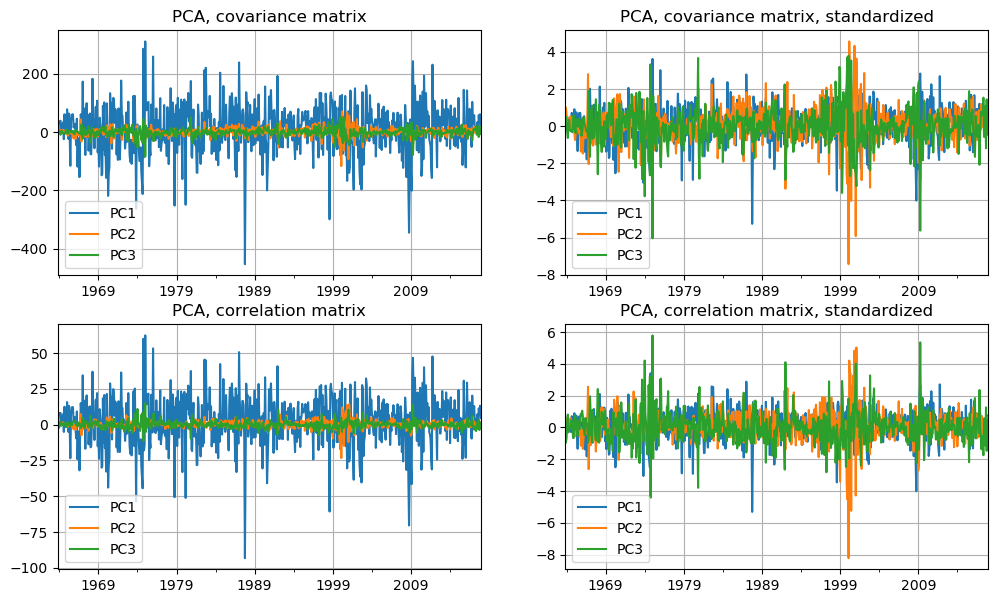

In [57]:
# PC1, PC2, PC3: plot manual results
f,a = plt.subplots(figsize=(12,7),nrows=2,ncols=2)

for i in range(0,3):
    #plt.plot(PCA.index,PCA['PC'+str(i+1)],label='PC'+str(i+1))
    PCA_cov['PC'+str(i+1)].plot(ax=a[0,0])
a[0,0].legend(['PC1','PC2','PC3'])
a[0,0].grid(True)
a[0,0].set_title('PCA, covariance matrix')

for i in range(0,3):
    #plt.plot(PCA.index,PCA['PC'+str(i+1)],label='PC'+str(i+1))
    (PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std()).plot(ax=a[0,1])
a[0,1].legend(['PC1','PC2','PC3'])
a[0,1].grid(True)
a[0,1].set_title('PCA, covariance matrix, standardized')

for i in range(0,3):
    PCA_corr['PC'+str(i+1)].plot(ax=a[1,0])
a[1,0].legend(['PC1','PC2','PC3'])
a[1,0].grid(True)
a[1,0].set_title('PCA, correlation matrix')

for i in range(0,3):
    #plt.plot(PCA.index,PCA['PC'+str(i+1)],label='PC'+str(i+1))
    (PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std()).plot(ax=a[1,1])
a[1,1].legend(['PC1','PC2','PC3'])
a[1,1].grid(True)
a[1,1].set_title('PCA, correlation matrix, standardized')

#plt.savefig('output/figures/Q1c_PCA_manual.pdf')
plt.show()

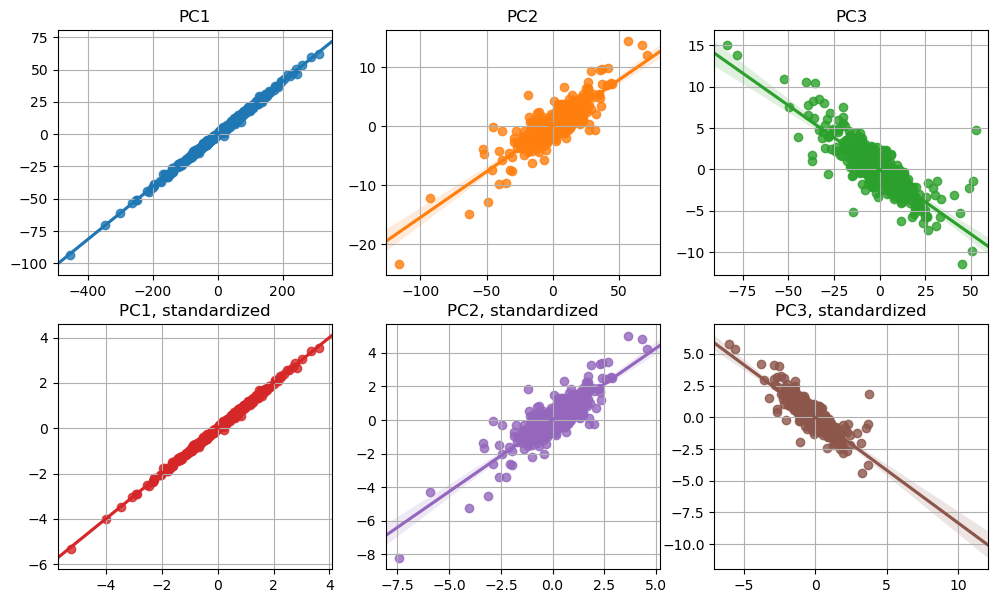

In [61]:
# PC1, PC2, PC3: compare manual PCA_cov and PCA_corr
f,a = plt.subplots(figsize=(12,7),nrows=2,ncols=3)

for i in range(0,3):
    sns.regplot(PCA_cov['PC'+str(i+1)],PCA_corr['PC'+str(i+1)],ax=a[0,i])
    a[0,i].set_title('PC'+str(i+1))

for i in range(0,3):
    sns.regplot(PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std(),
        PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std(),ax=a[1,i])
    a[1,i].set_title('PC'+str(i+1)+', standardized')

[a[i,j].grid(True) for i in range(0,2) for j in range(0,3)]
[a[i,j].set_xlabel('') for i in range(0,2) for j in range(0,3)]
[a[i,j].set_ylabel('') for i in range(0,2) for j in range(0,3)]

#plt.savefig('output/figures/Q1c_PCA_cov_vs_PCA_corr.pdf')
plt.show()

In [64]:
PCA_cov[['PC1','PC2','PC3']].describe()
#PCA_cov[['PC1','PC2','PC3']].describe().to_csv('output/tables/Q1c_PCA_cov_stats.csv')

In [66]:
PCA_corr[['PC1','PC2','PC3']].describe()
#PCA_corr[['PC1','PC2','PC3']].describe().to_csv('output/tables/Q1c_PCA_corr_stats.csv')

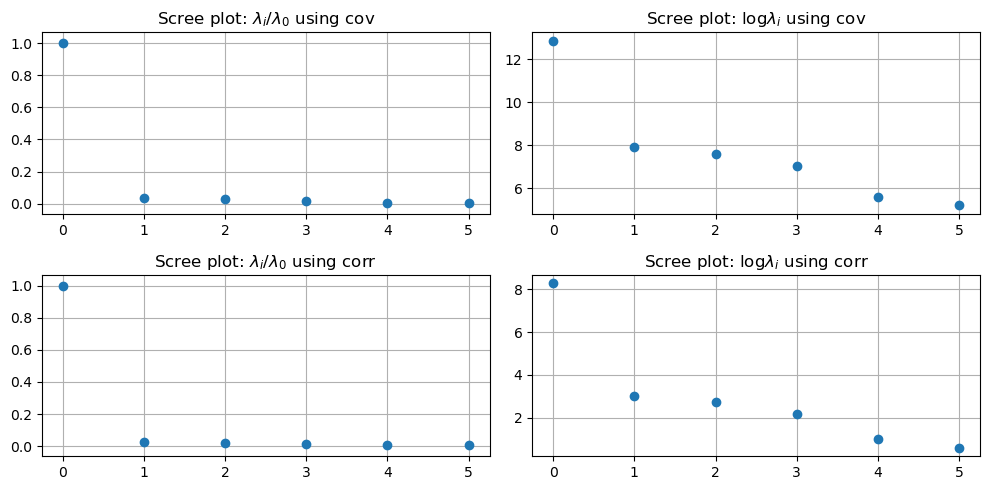

In [74]:
# Scree plots
f,a = plt.subplots(figsize=(10, 5),nrows=2,ncols=2)

a[0,0].scatter(range(6),lambdas_cov[:6]/lambdas_cov[0])
a[0,0].set_xticks(range(6))
a[0,0].set_title('Scree plot: $\lambda_i/\lambda_0$ using cov')

a[0,1].scatter(range(6),np.log2(lambdas_cov[:6]))
a[0,1].set_xticks(range(6))
a[0,1].set_title('Scree plot: $\log \lambda_i$ using cov')

a[1,0].scatter(range(6),lambdas_corr[:6]/lambdas_corr[0])
a[1,0].set_xticks(range(6))
a[1,0].set_title('Scree plot: $\lambda_i/\lambda_0$ using corr')

a[1,1].scatter(range(6),np.log2(lambdas_corr[:6]))
a[1,1].set_xticks(range(6))
a[1,1].set_title('Scree plot: $\log \lambda_i$ using corr')

[a[i,j].grid(True) for i in range(0,2) for j in range(0,2)]
[a[i,j].set_axisbelow(True) for i in range(0,2) for j in range(0,2)]

plt.tight_layout()
#plt.savefig('output/figures/Q1c_screeplots.pdf')
plt.show()

#### (d) Compare your results with those obtained by the statsmodels PCA package.

In [29]:
res_PCA_sm_cov = sm.multivariate.PCA(df_ff[ex_rets],standardize=False,demean=False,normalize=False)
res_PCA_sm_cov_norm = sm.multivariate.PCA(df_ff[ex_rets],standardize=False,demean=False,normalize=True) # Default
res_PCA_sm_corr = sm.multivariate.PCA(df_ff[ex_rets]/df_ff[ex_rets].std(),standardize=False,demean=False,normalize=False)
res_PCA_sm_corr_norm = sm.multivariate.PCA(df_ff[ex_rets]/df_ff[ex_rets].std(),standardize=False,demean=False,normalize=True) # Default

In [30]:
PCA_sm_cov = res_PCA_sm_cov.factors
PCA_sm_cov_norm = res_PCA_sm_cov_norm.factors
PCA_sm_corr = res_PCA_sm_corr.factors
PCA_sm_corr_norm = res_PCA_sm_corr_norm.factors

PCA_sm_cov.columns=['PC'+str(i+1) for i in range(0,370)]
PCA_sm_cov_norm.columns=['PC'+str(i+1) for i in range(0,370)]
PCA_sm_corr.columns=['PC'+str(i+1) for i in range(0,370)]
PCA_sm_corr_norm.columns=['PC'+str(i+1) for i in range(0,370)]

In [31]:
PCA_sm_cov_bis = pd.DataFrame(np.dot(X, res_PCA_sm_cov.eigenvecs))
PCA_sm_cov_norm_bis = pd.DataFrame(np.dot(X, res_PCA_sm_cov_norm.eigenvecs))
PCA_sm_corr_bis = pd.DataFrame(np.dot(X_tilde, res_PCA_sm_corr.eigenvecs))
PCA_sm_corr_norm_bis = pd.DataFrame(np.dot(X_tilde, res_PCA_sm_corr_norm.eigenvecs))

PCA_sm_cov_bis.columns=['PC'+str(i+1) for i in range(0,370)]
PCA_sm_cov_norm_bis.columns=['PC'+str(i+1) for i in range(0,370)]
PCA_sm_corr_bis.columns=['PC'+str(i+1) for i in range(0,370)]
PCA_sm_corr_norm_bis.columns=['PC'+str(i+1) for i in range(0,370)]

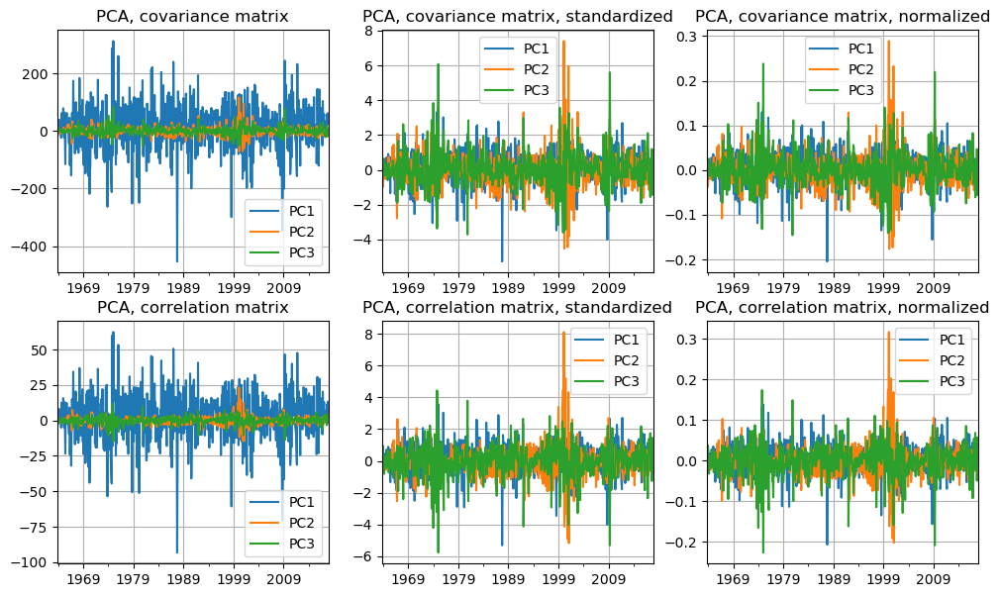

In [33]:
# PC1, PC2, PC3: plot statsmodel results
f,a = plt.subplots(figsize=(12,7),nrows=2,ncols=3)

for i in range(0,3):
    PCA_sm_cov['PC'+str(i+1)].plot(ax=a[0,0])
a[0,0].legend(['PC1','PC2','PC3'])
a[0,0].grid(True)
a[0,0].set_title('PCA, covariance matrix')

for i in range(0,3):
    #plt.plot(PCA.index,PCA['PC'+str(i+1)],label='PC'+str(i+1))
    (PCA_sm_cov['PC'+str(i+1)]/PCA_sm_cov['PC'+str(i+1)].std()).plot(ax=a[0,1])
a[0,1].legend(['PC1','PC2','PC3'])
a[0,1].grid(True)
a[0,1].set_title('PCA, covariance matrix, standardized')

for i in range(0,3):
    PCA_sm_cov_norm['PC'+str(i+1)].plot(ax=a[0,2])
a[0,2].legend(['PC1','PC2','PC3'])
a[0,2].grid(True)
a[0,2].set_title('PCA, covariance matrix, normalized')

for i in range(0,3):
    PCA_sm_corr['PC'+str(i+1)].plot(ax=a[1,0])
a[1,0].legend(['PC1','PC2','PC3'])
a[1,0].grid(True)
a[1,0].set_title('PCA, correlation matrix')

for i in range(0,3):
    #plt.plot(PCA.index,PCA['PC'+str(i+1)],label='PC'+str(i+1))
    (PCA_sm_corr['PC'+str(i+1)]/PCA_sm_corr['PC'+str(i+1)].std()).plot(ax=a[1,1])
a[1,1].legend(['PC1','PC2','PC3'])
a[1,1].grid(True)
a[1,1].set_title('PCA, correlation matrix, standardized')

for i in range(0,3):
    PCA_sm_corr_norm['PC'+str(i+1)].plot(ax=a[1,2])
a[1,2].legend(['PC1','PC2','PC3'])
a[1,2].grid(True)
a[1,2].set_title('PCA, correlation matrix, normalized')

plt.show()

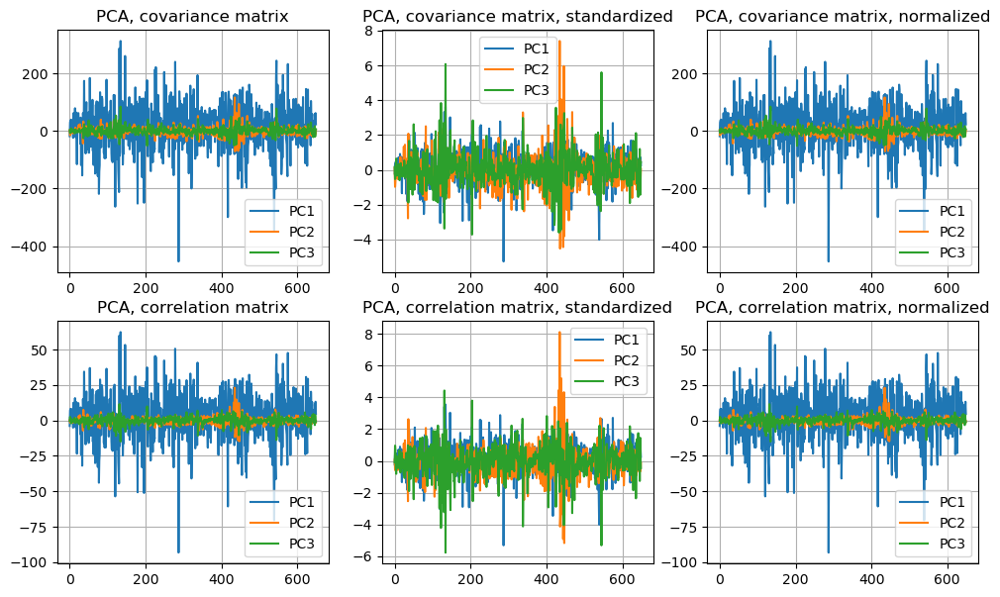

In [34]:
# PC1, PC2, PC3: plot statsmodel results (computing factors manually: same)
f,a = plt.subplots(figsize=(12,7),nrows=2,ncols=3)

for i in range(0,3):
    PCA_sm_cov_bis['PC'+str(i+1)].plot(ax=a[0,0])
a[0,0].legend(['PC1','PC2','PC3'])
a[0,0].grid(True)
a[0,0].set_title('PCA, covariance matrix')

for i in range(0,3):
    #plt.plot(PCA.index,PCA['PC'+str(i+1)],label='PC'+str(i+1))
    (PCA_sm_cov_bis['PC'+str(i+1)]/PCA_sm_cov_bis['PC'+str(i+1)].std()).plot(ax=a[0,1])
a[0,1].legend(['PC1','PC2','PC3'])
a[0,1].grid(True)
a[0,1].set_title('PCA, covariance matrix, standardized')

for i in range(0,3):
    PCA_sm_cov_norm_bis['PC'+str(i+1)].plot(ax=a[0,2])
a[0,2].legend(['PC1','PC2','PC3'])
a[0,2].grid(True)
a[0,2].set_title('PCA, covariance matrix, normalized')

for i in range(0,3):
    PCA_sm_corr_bis['PC'+str(i+1)].plot(ax=a[1,0])
a[1,0].legend(['PC1','PC2','PC3'])
a[1,0].grid(True)
a[1,0].set_title('PCA, correlation matrix')

for i in range(0,3):
    #plt.plot(PCA.index,PCA['PC'+str(i+1)],label='PC'+str(i+1))
    (PCA_sm_corr_bis['PC'+str(i+1)]/PCA_sm_corr_bis['PC'+str(i+1)].std()).plot(ax=a[1,1])
a[1,1].legend(['PC1','PC2','PC3'])
a[1,1].grid(True)
a[1,1].set_title('PCA, correlation matrix, standardized')

for i in range(0,3):
    PCA_sm_corr_norm_bis['PC'+str(i+1)].plot(ax=a[1,2])
a[1,2].legend(['PC1','PC2','PC3'])
a[1,2].grid(True)
a[1,2].set_title('PCA, correlation matrix, normalized')

plt.show()

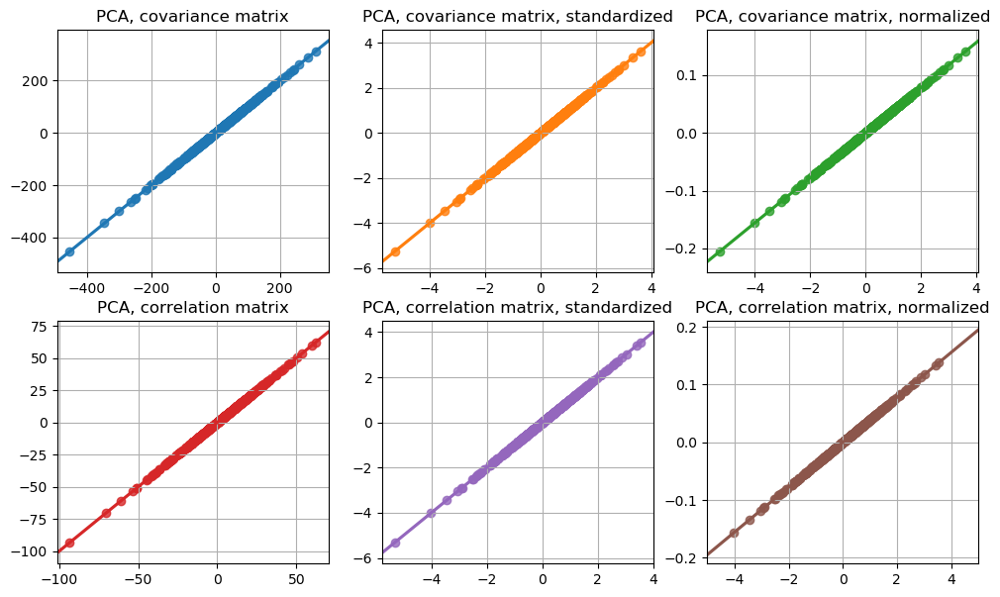

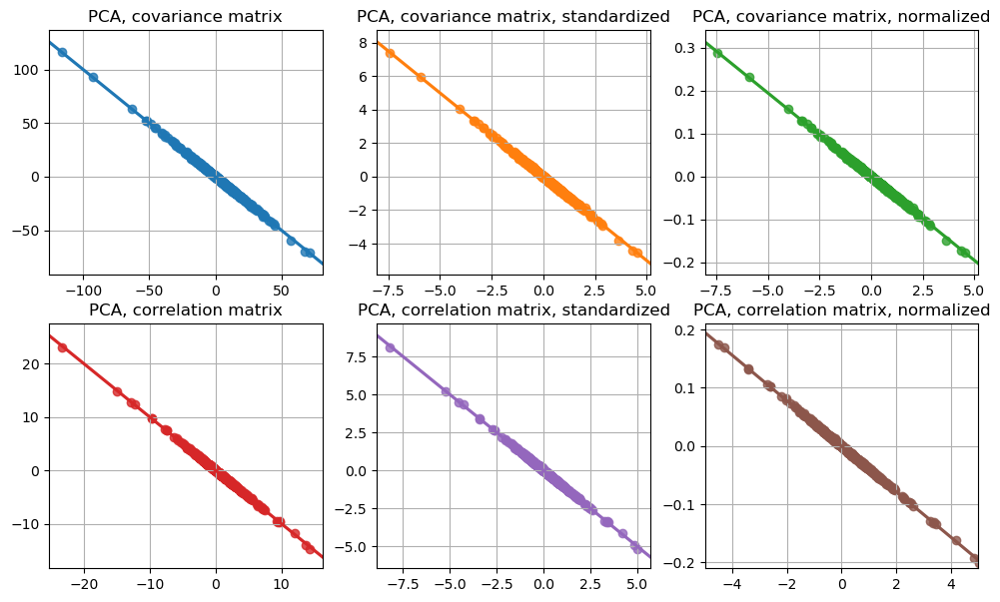

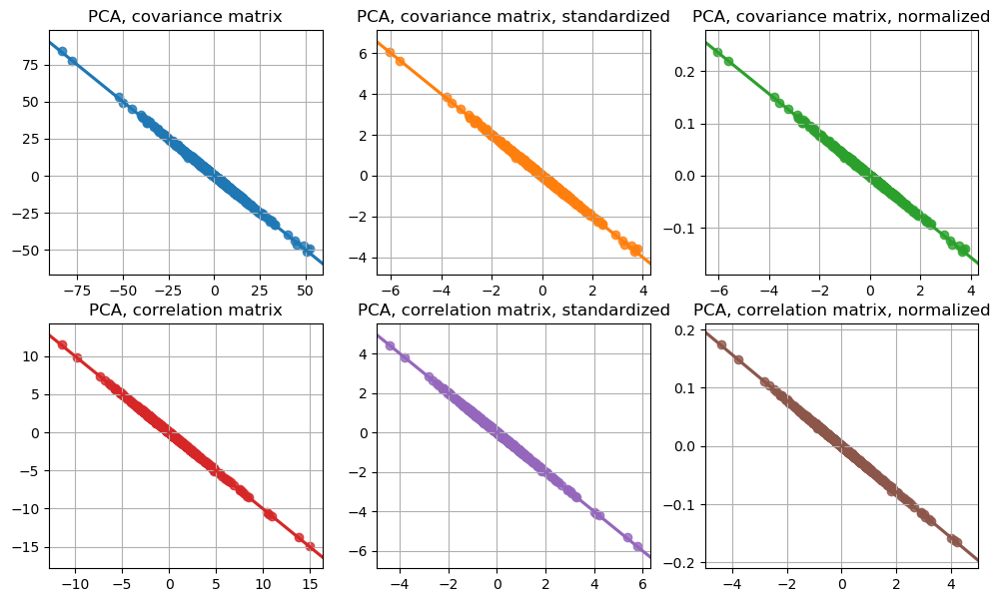

In [54]:
# PC1, PC2, PC3: compare manual and statsmodel
for i in range(0,3):

    f,a = plt.subplots(figsize=(12,7),nrows=2,ncols=3)

    sns.regplot(PCA_cov['PC'+str(i+1)],PCA_sm_cov['PC'+str(i+1)],ax=a[0,0])
    a[0,0].set_title('PCA, covariance matrix')

    sns.regplot((PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std()),
                (PCA_sm_cov['PC'+str(i+1)]/PCA_sm_cov['PC'+str(i+1)].std()),ax=a[0,1])
    a[0,1].set_title('PCA, covariance matrix, standardized')

    sns.regplot((PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std()),
                PCA_sm_cov_norm['PC'+str(i+1)],ax=a[0,2])
    a[0,2].set_title('PCA, covariance matrix, normalized')

    sns.regplot(PCA_corr['PC'+str(i+1)],PCA_sm_corr['PC'+str(i+1)],ax=a[1,0])
    a[1,0].set_title('PCA, correlation matrix')

    sns.regplot(PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std(),
                PCA_sm_corr['PC'+str(i+1)]/PCA_sm_corr['PC'+str(i+1)].std(),ax=a[1,1])
    a[1,1].set_title('PCA, correlation matrix, standardized')

    sns.regplot(PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std(),
                PCA_sm_corr_norm['PC'+str(i+1)],ax=a[1,2])
    a[1,2].set_xlim([-5,5])
    a[1,2].set_ylim([-0.21,0.21])
    a[1,2].set_title('PCA, correlation matrix, normalized')

    [a[i,j].grid(True) for i in range(0,2) for j in range(0,3)]
    [a[i,j].set_xlabel('') for i in range(0,2) for j in range(0,3)]
    [a[i,j].set_ylabel('') for i in range(0,2) for j in range(0,3)]

    plt.show()

In [205]:
PCA_sm_corr.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC361,PC362,PC363,PC364,PC365,PC366,PC367,PC368,PC369,PC370
count,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,...,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000
mean,2.369,-0.286,-0.054,-0.290,-0.168,-0.122,-0.219,-0.219,-0.058,-0.048,...,-0.001,0.000,-0.001,-0.002,0.000,-0.001,0.001,-0.000,-0.001,-0.001
std,17.569,2.845,2.593,2.120,1.426,1.229,1.141,1.042,0.994,0.942,...,0.041,0.040,0.038,0.036,0.034,0.033,0.031,0.027,0.023,0.021
min,-93.293,-14.699,-14.953,-12.719,-6.233,-5.705,-5.458,-3.873,-5.259,-5.102,...,-0.148,-0.129,-0.134,-0.120,-0.113,-0.104,-0.107,-0.088,-0.061,-0.068
25%,-7.463,-1.572,-1.315,-1.332,-0.984,-0.755,-0.794,-0.767,-0.617,-0.502,...,-0.031,-0.025,-0.025,-0.027,-0.023,-0.023,-0.019,-0.017,-0.016,-0.015
50%,3.611,-0.188,0.010,-0.385,-0.142,-0.099,-0.181,-0.221,-0.063,-0.063,...,0.001,0.000,0.000,-0.001,0.000,-0.001,0.002,-0.001,-0.000,-0.001
75%,13.689,1.098,1.419,0.640,0.574,0.535,0.394,0.310,0.507,0.385,...,0.028,0.027,0.025,0.021,0.025,0.020,0.020,0.017,0.013,0.014
max,62.352,23.059,11.487,11.707,4.576,8.803,5.649,8.441,4.727,8.875,...,0.132,0.146,0.116,0.139,0.094,0.090,0.090,0.090,0.088,0.076


In [81]:
# Correlations
print('PCA cov manual with PCA cov from statsmodel:')
print(PCA_cov[['PC1','PC2','PC3']].corrwith(PCA_sm_cov[['PC1','PC2','PC3']]))
print('PCA cov manual standardized with PCA cov from statsmodel standardized:')
print((PCA_cov[['PC1','PC2','PC3']]/PCA_cov[['PC1','PC2','PC3']].std())\
      .corrwith(PCA_sm_cov[['PC1','PC2','PC3']]/PCA_sm_cov[['PC1','PC2','PC3']].std()))
print('PCA cov manual standardized with PCA cov normalized from statsmodel standardized:')
print((PCA_cov[['PC1','PC2','PC3']]/PCA_cov[['PC1','PC2','PC3']].std())\
      .corrwith(PCA_sm_cov_norm[['PC1','PC2','PC3']]/PCA_sm_cov_norm[['PC1','PC2','PC3']].std()))
print('PCA cov manual standardized with PCA cov normalized from statsmodel non-standardized:')
print((PCA_cov[['PC1','PC2','PC3']]/PCA_cov[['PC1','PC2','PC3']].std())\
      .corrwith(PCA_sm_cov_norm[['PC1','PC2','PC3']]))

print('PCA corr manual with PCA corr from statsmodel:')
print(PCA_corr[['PC1','PC2','PC3']].corrwith(PCA_sm_corr[['PC1','PC2','PC3']]))
print('PCA corr manual standardized with PCA corr from statsmodel standardized:')
print((PCA_corr[['PC1','PC2','PC3']]/PCA_corr[['PC1','PC2','PC3']].std())\
      .corrwith(PCA_sm_corr[['PC1','PC2','PC3']]/PCA_sm_corr[['PC1','PC2','PC3']].std()))
print('PCA corr manual standardized with PCA corr normalized from statsmodel standardized:')
print((PCA_corr[['PC1','PC2','PC3']]/PCA_corr[['PC1','PC2','PC3']].std())\
      .corrwith(PCA_sm_corr_norm[['PC1','PC2','PC3']]/PCA_sm_corr_norm[['PC1','PC2','PC3']].std()))
print('PCA corr manual standardized with PCA corr normalized from statsmodel non-standardized:')
print((PCA_corr[['PC1','PC2','PC3']]/PCA_corr[['PC1','PC2','PC3']].std())\
      .corrwith(PCA_sm_corr_norm[['PC1','PC2','PC3']]))

PCA cov manual with PCA cov from statsmodel:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: float64
PCA cov manual standardized with PCA cov from statsmodel standardized:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: float64
PCA cov manual standardized with PCA cov normalized from statsmodel standardized:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: float64
PCA cov manual standardized with PCA cov normalized from statsmodel non-standardized:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: float64
PCA corr manual with PCA corr from statsmodel:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: float64
PCA corr manual standardized with PCA corr from statsmodel standardized:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: float64
PCA corr manual standardized with PCA corr normalized from statsmodel standardized:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: float64
PCA corr manual standardized with PCA corr normalized from statsmodel non-standardized:
PC1    1.000
PC2   -1.000
PC3   -1.000
dtype: 

In [40]:
# Switch sign
#for version in [PCA_sm_cov,PCA_sm_corr,PCA_sm_norm]:
PCA_sm_cov2 = PCA_sm_cov*np.sign(PCA_sm_cov.mean())
PCA_sm_corr2 = PCA_sm_corr*np.sign(PCA_sm_corr.mean())
PCA_sm_cov_norm2 = PCA_sm_cov_norm*np.sign(PCA_sm_cov_norm.mean())
PCA_sm_corr_norm2 = PCA_sm_corr_norm*np.sign(PCA_sm_corr_norm.mean())

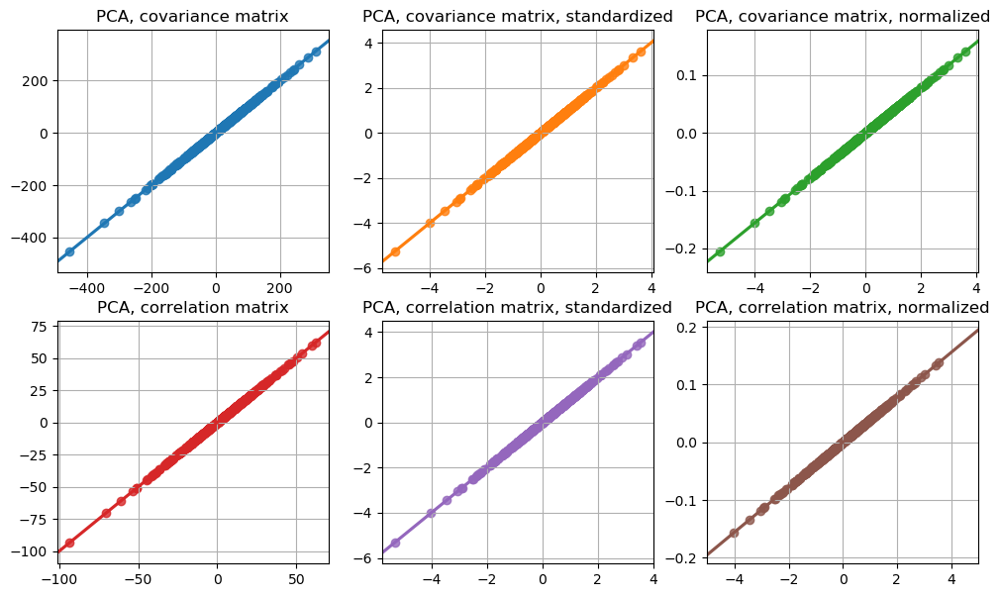

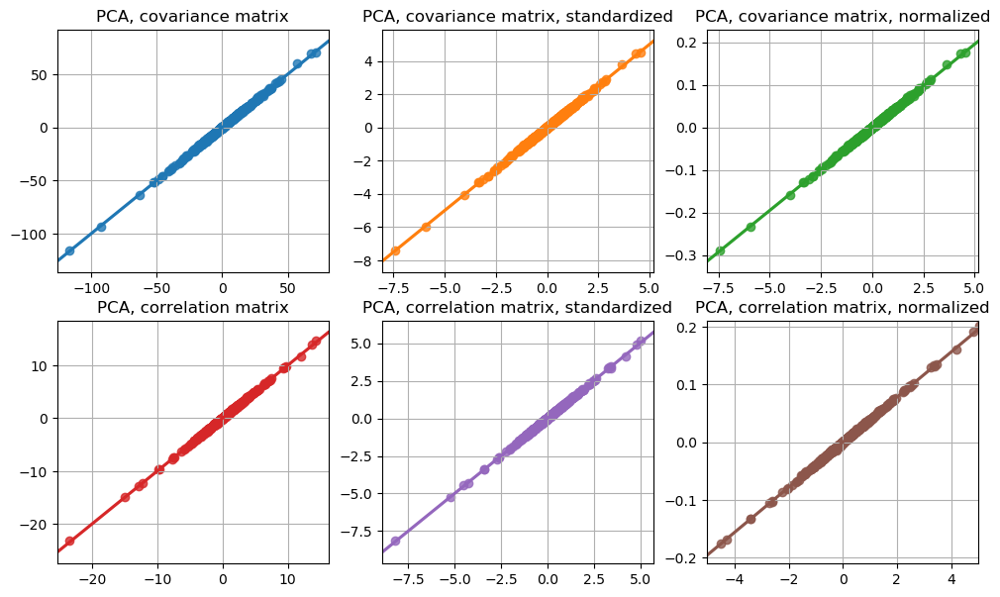

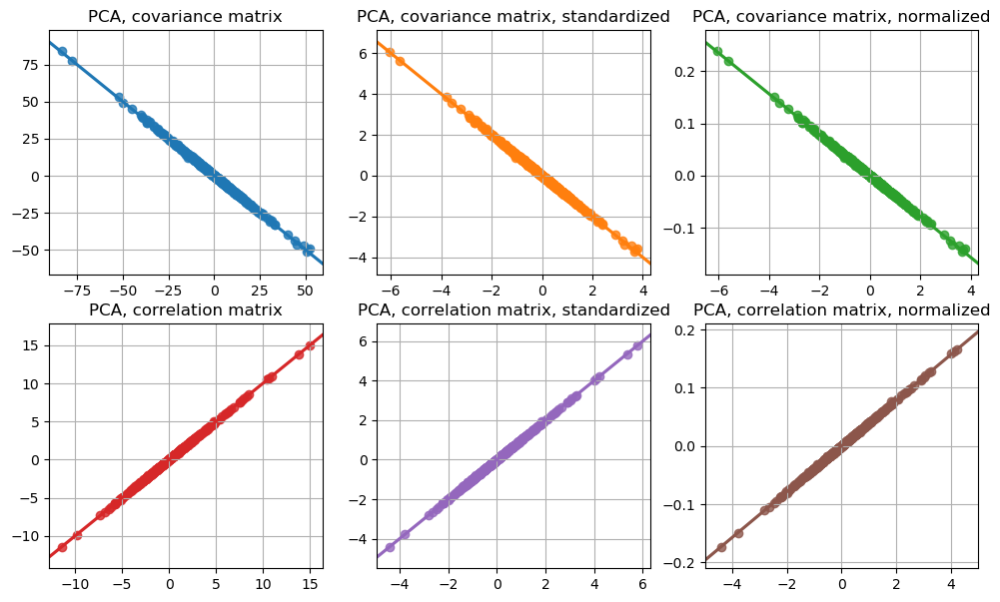

In [67]:
# PC1, PC2, PC3: compare manual vs. statsmodel (sign flipped)
for i in range(0,3):

    f,a = plt.subplots(figsize=(12,7),nrows=2,ncols=3)

    sns.regplot(PCA_cov['PC'+str(i+1)],PCA_sm_cov2['PC'+str(i+1)],ax=a[0,0])
    a[0,0].set_title('PCA, covariance matrix')

    sns.regplot((PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std()),
                (PCA_sm_cov2['PC'+str(i+1)]/PCA_sm_cov2['PC'+str(i+1)].std()),ax=a[0,1])
    a[0,1].set_title('PCA, covariance matrix, standardized')

    sns.regplot((PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std()),
                PCA_sm_cov_norm2['PC'+str(i+1)],ax=a[0,2])
    a[0,2].set_title('PCA, covariance matrix, normalized')

    sns.regplot(PCA_corr['PC'+str(i+1)],PCA_sm_corr2['PC'+str(i+1)],ax=a[1,0])
    a[1,0].set_title('PCA, correlation matrix')

    sns.regplot(PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std(),
                PCA_sm_corr2['PC'+str(i+1)]/PCA_sm_corr2['PC'+str(i+1)].std(),ax=a[1,1])
    a[1,1].set_title('PCA, correlation matrix, standardized')

    sns.regplot(PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std(),
                PCA_sm_corr_norm2['PC'+str(i+1)],ax=a[1,2])
    a[1,2].set_xlim([-5,5])
    a[1,2].set_ylim([-0.21,0.21])
    a[1,2].set_title('PCA, correlation matrix, normalized')

    [a[i,j].grid(True) for i in range(0,2) for j in range(0,3)]
    [a[i,j].set_xlabel('') for i in range(0,2) for j in range(0,3)]
    [a[i,j].set_ylabel('') for i in range(0,2) for j in range(0,3)]

    plt.show()

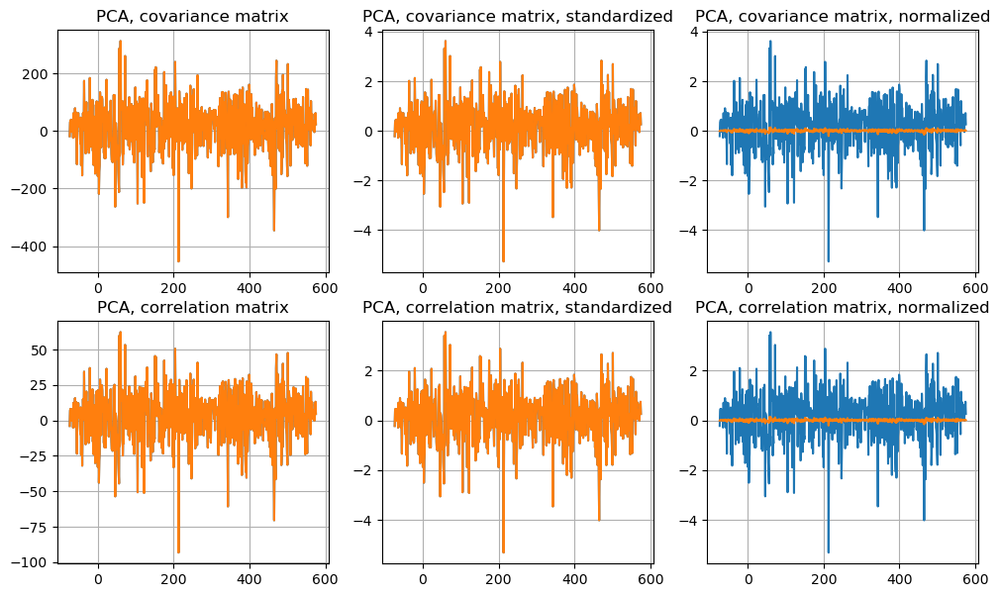

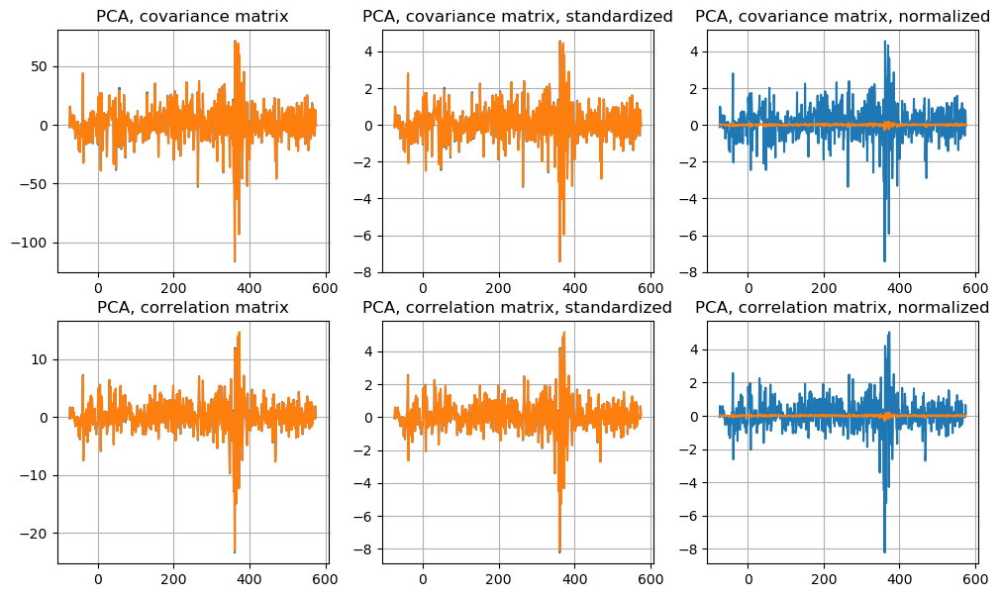

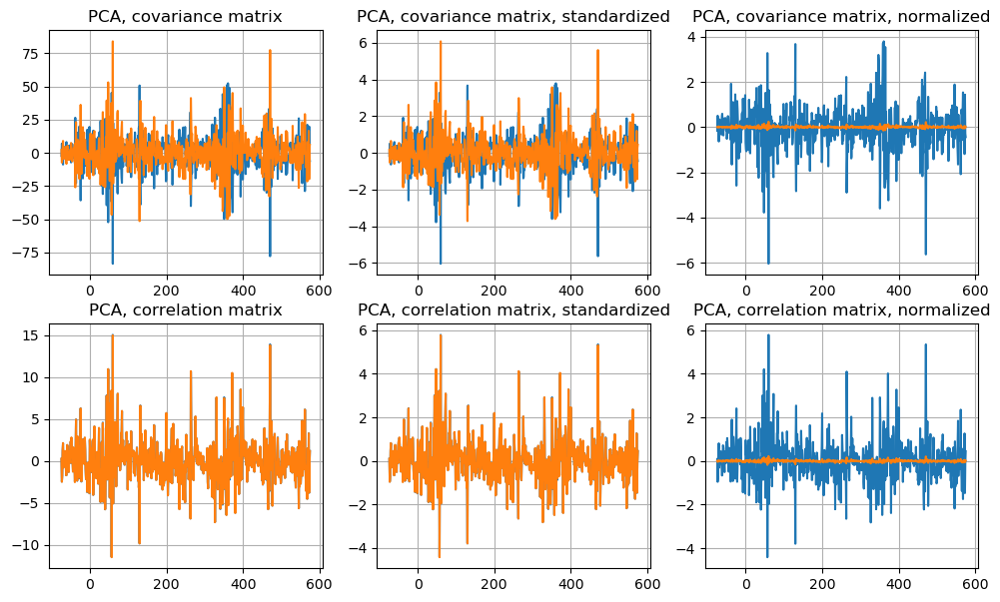

In [53]:
# PC1, PC2, PC3: time-series for manual vs. statsmodel, once sign flipped
for i in range(0,3):
    f,a = plt.subplots(figsize=(12,7),nrows=2,ncols=3)

    a[0,0].plot(PCA_cov.index,PCA_cov['PC'+str(i+1)])
    a[0,0].plot(PCA_cov.index,PCA_sm_cov2['PC'+str(i+1)])
    a[0,0].set_title('PCA, covariance matrix')

    a[0,1].plot(PCA_cov.index,(PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std()))
    a[0,1].plot(PCA_cov.index,(PCA_sm_cov2['PC'+str(i+1)]/PCA_sm_cov2['PC'+str(i+1)].std()))
    a[0,1].set_title('PCA, covariance matrix, standardized')

    a[0,2].plot(PCA_cov.index,(PCA_cov['PC'+str(i+1)]/PCA_cov['PC'+str(i+1)].std()))
    a[0,2].plot(PCA_cov.index,PCA_sm_cov_norm2['PC'+str(i+1)])
    a[0,2].set_title('PCA, covariance matrix, normalized')

    a[1,0].plot(PCA_cov.index,PCA_corr['PC'+str(i+1)])
    a[1,0].plot(PCA_cov.index,PCA_sm_corr2['PC'+str(i+1)])
    a[1,0].set_title('PCA, correlation matrix')

    a[1,1].plot(PCA_cov.index,PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std())
    a[1,1].plot(PCA_cov.index,PCA_sm_corr2['PC'+str(i+1)]/PCA_sm_corr2['PC'+str(i+1)].std())
    a[1,1].set_title('PCA, correlation matrix, standardized')

    a[1,2].plot(PCA_cov.index,PCA_corr['PC'+str(i+1)]/PCA_corr['PC'+str(i+1)].std())
    a[1,2].plot(PCA_cov.index,PCA_sm_corr_norm2['PC'+str(i+1)])
    #a[1,2].set_xlim([-5,5])
    #a[1,2].set_ylim([-0.21,0.21])
    a[1,2].set_title('PCA, correlation matrix, normalized')

    [a[i,j].grid(True) for i in range(0,2) for j in range(0,3)]
    [a[i,j].set_xlabel('') for i in range(0,2) for j in range(0,3)]
    [a[i,j].set_ylabel('') for i in range(0,2) for j in range(0,3)]

    plt.show()

In [ ]:
# The sign of PC3 obtained from the covariance matrix could be made consistent between the manual and statsmodel estimation above.

In what follows, we focus on the principal components obtained from the standardized excess returns using *statsmodels* with *standardize* $=$ **False**, *demean* $=$ **False**, and *normalize* $=$ **False** (default). We standardize them by their standard deviations, and set the sign of each so that its mean is positive.

In [18]:
# normalize = True is the default
res_PCA_sm_corr_norm = sm.multivariate.PCA(df_ff[ex_rets]/df_ff[ex_rets].std(),
                                           standardize=False,demean=False,normalize=True)
res_PCA_sm = res_PCA_sm_corr_norm
PCA_sm_corr_norm = res_PCA_sm_corr_norm.factors
PCA_sm = res_PCA_sm.factors
PCA_sm.columns=['PC'+str(i+1) for i in range(0,370)]
sign = np.sign(PCA_sm.mean())
PCA_sm = PCA_sm/PCA_sm.std() * sign

In [19]:
# Loadings
PCA_sm_load = res_PCA_sm.loadings
PCA_sm_load.columns=['PC'+str(i+1) for i in range(0,370)]
PCA_sm_load = PCA_sm_load * sign

In [20]:
PCA_sm.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC361,PC362,PC363,PC364,PC365,PC366,PC367,PC368,PC369,PC370
count,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,...,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000,650.000
mean,0.135,0.101,0.021,0.137,0.118,0.099,0.192,0.210,0.058,0.051,...,0.032,0.011,0.018,0.050,0.009,0.019,0.037,0.014,0.026,0.053
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
min,-5.310,-8.105,-4.429,-5.523,-3.209,-7.164,-4.951,-8.098,-4.758,-9.426,...,-3.215,-3.195,-3.085,-3.809,-3.293,-2.760,-3.448,-3.301,-3.877,-3.577
25%,-0.425,-0.386,-0.547,-0.302,-0.403,-0.435,-0.346,-0.298,-0.510,-0.409,...,-0.683,-0.629,-0.653,-0.573,-0.660,-0.616,-0.613,-0.629,-0.567,-0.644
50%,0.206,0.066,-0.004,0.181,0.100,0.080,0.159,0.212,0.063,0.067,...,-0.031,0.001,-0.002,0.029,0.001,0.040,0.070,0.043,0.011,0.044
75%,0.779,0.552,0.507,0.628,0.690,0.615,0.696,0.736,0.621,0.534,...,0.751,0.662,0.654,0.750,0.722,0.705,0.651,0.618,0.687,0.705
max,3.549,5.167,5.766,6.000,4.372,4.642,4.784,3.716,5.293,5.419,...,3.610,3.608,3.575,3.295,2.738,3.185,2.874,3.228,2.665,3.190


#### (e) How many PCs are “significant”? Describe the PCs. Do they have any interesting economic interpretation?

In [191]:
# Share of variance explained by the factors
print('PC1    PC2    PC3    PC4    PC5    PC6    PC7    PC8    PC9    PC10')
share = 100*res_PCA_sm.eigenvals/res_PCA_sm.eigenvals.sum()
print('{:.1f}%  {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%'\
      .format(*share[0:10]))
print('{:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%'\
      .format(*np.cumsum(share[0:10])))
print()
print('PC11   PC12   PC13   PC14   PC15   PC16   PC17   PC18   PC19   PC20')
share = 100*res_PCA_sm.eigenvals/res_PCA_sm.eigenvals.sum()
print('{:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%   {:.1f}%'\
      .format(*share[10:]))
print('{:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%  {:.1f}%'\
      .format(*np.cumsum(share)[10:]))

PC1    PC2    PC3    PC4    PC5    PC6    PC7    PC8    PC9    PC10
83.6%  2.2%   1.8%   1.2%   0.5%   0.4%   0.4%   0.3%   0.3%   0.2%
83.6%  85.7%  87.5%  88.8%  89.3%  89.7%  90.1%  90.4%  90.6%  90.9%

PC11   PC12   PC13   PC14   PC15   PC16   PC17   PC18   PC19   PC20
0.2%   0.2%   0.2%   0.2%   0.2%   0.1%   0.1%   0.1%   0.1%   0.1%
91.1%  91.3%  91.5%  91.6%  91.8%  91.9%  92.1%  92.2%  92.4%  92.5%


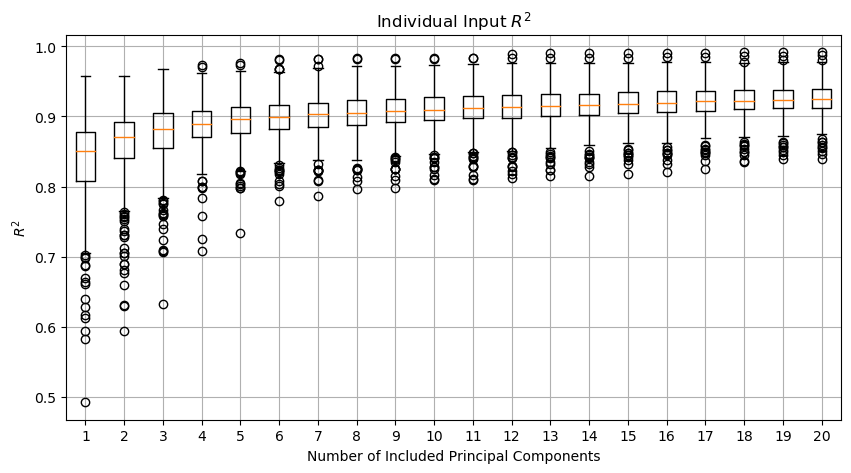

In [193]:
f,a = plt.subplots(figsize=(10,5))
plot_R2 = res_PCA_sm.plot_rsquare(20,ax=a)
plt.grid(True)
#plt.savefig('output/figures/Q1e_indR2.pdf')
plt.show()

In [33]:
# Regression of each portfolios on PC1 to PCX
nmax   = 20  # Max number of PCs
nlags  = 12 # For NW
# Adjusted-R2s
R2s    = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
alphas = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
std_alphas = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
t_alphas = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
p_alphas = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
mean_predicts = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
# beta, std_beta, t-stat and p-value for the coefficient of the last PC included
betas     = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
std_betas = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
t_betas     = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])
p_betas     = pd.DataFrame(np.empty((len(ex_rets),nmax))*np.NaN,index=results_FF5.index.copy(),
                     columns=['PC'+str(i) for i in range(1,nmax+1)])

X = [] # List of regressors
for n in range(1,nmax+1):
    X.append('PC'+str(n))
    for ex_ret in ex_rets:
        model = sm.OLS(df_ff[ex_ret], sm.add_constant(PCA_sm[X]), missing='drop')
        results = model.fit()
        results_NW = results.get_robustcov_results(cov_type='HAC', maxlags=nlags)
        R2s.loc[R2s.index==ex_ret,'PC'+str(n)] = results.rsquared_adj
        alphas.loc[alphas.index==ex_ret,'PC'+str(n)] = results.params['const']
        std_alphas.loc[std_alphas.index==ex_ret,'PC'+str(n)] = results_NW.bse[0]
        t_alphas.loc[t_alphas.index==ex_ret,'PC'+str(n)] = results_NW.tvalues[0]
        p_alphas.loc[p_alphas.index==ex_ret,'PC'+str(n)] = results_NW.pvalues[0]
        betas.loc[betas.index==ex_ret,'PC'+str(n)] = results_NW.params[-1]
        std_betas.loc[std_betas.index==ex_ret,'PC'+str(n)] = results_NW.bse[-1]
        t_betas.loc[t_betas.index==ex_ret,'PC'+str(n)] = results_NW.tvalues[-1]
        p_betas.loc[p_betas.index==ex_ret,'PC'+str(n)] = results_NW.pvalues[-1]
        mean_predicts.loc[mean_predicts.index==ex_ret,'PC'+str(n)] = \
            (results_NW.predict(sm.add_constant(PCA_sm[X]))-results_NW.params[0]).mean()
        # Those loc operations seem quite slow, could first append to a dict/array and then
        # create the DataFrame to increase speed
    print(n,' done')

1  done
2  done
3  done
4  done
5  done
6  done
7  done
8  done
9  done
10  done
11  done
12  done
13  done
14  done
15  done
16  done
17  done
18  done
19  done
20  done


In [34]:
# RMSE
((alphas**2).mean())**.5

PC1    0.190
PC2    0.169
PC3    0.169
PC4    0.149
PC5    0.142
PC6    0.139
PC7    0.128
PC8    0.117
PC9    0.116
PC10   0.116
PC11   0.116
PC12   0.114
PC13   0.114
PC14   0.111
PC15   0.111
PC16   0.105
PC17   0.105
PC18   0.105
PC19   0.099
PC20   0.097
dtype: float64

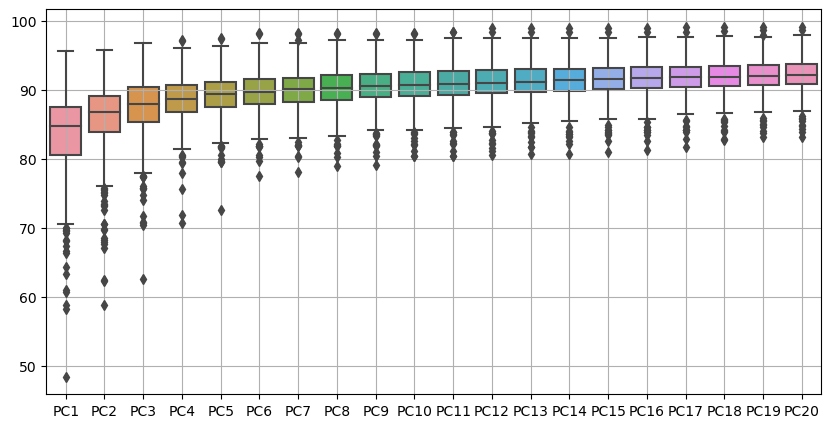

In [39]:
# Box plot for (cumulative) adj-R2
f = plt.figure(figsize=(10,5))
#a = sns.boxplot(data=R2s*100,palette=sns.color_palette("Blues_d"))
a = sns.boxplot(data=R2s*100)
a.grid(True)
plt.show()

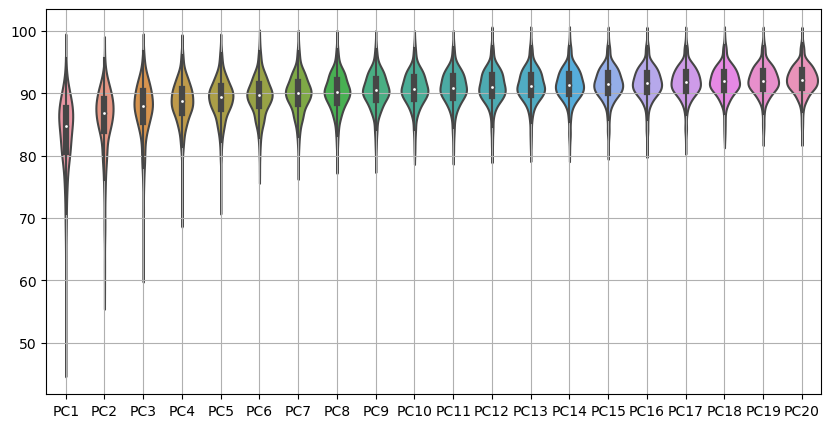

In [40]:
# Violin plot for (cumulative) adj-R2
f = plt.figure(figsize=(10,5))
a = sns.violinplot(data=R2s*100)
#a = sns.violinplot(data=R2s*100,palette=sns.color_palette("Blues_d"))
a.grid(True)
plt.show()

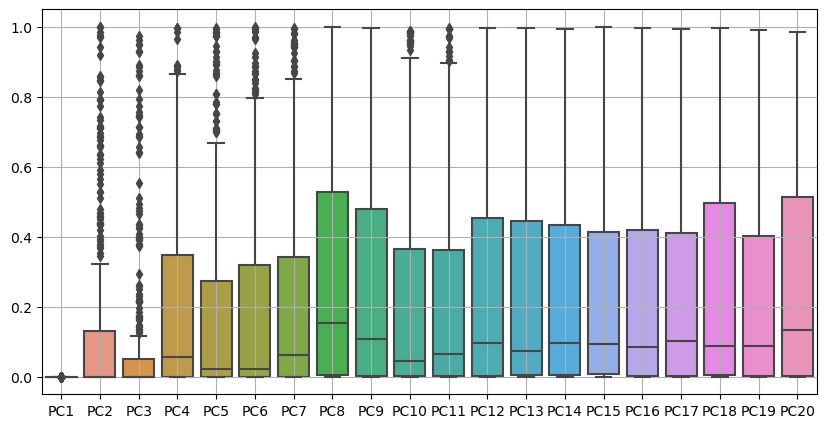

In [41]:
# Box plot for pvalues of the coefficient on the last included coefficient
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=p_betas)
a.grid(True)
plt.show()

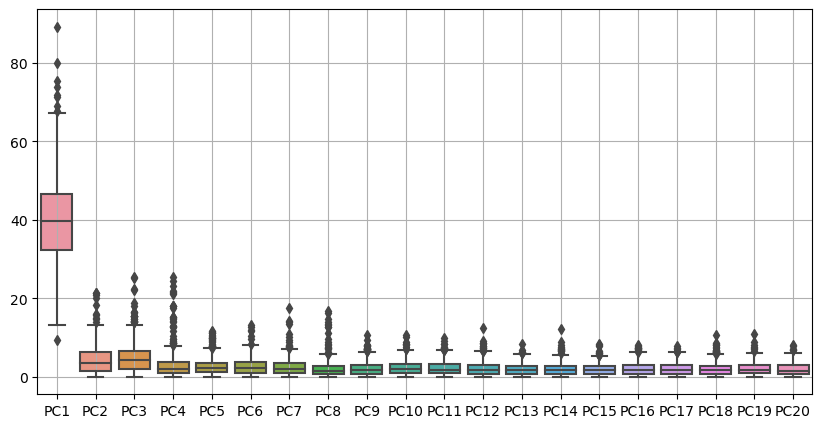

In [194]:
# Box plot for (abs) t-statistics of the coefficient on the last included coefficient
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=np.abs(t_betas))
a.grid(True)
#plt.savefig('output/figures/Q1e_t_betas.pdf')
plt.show()

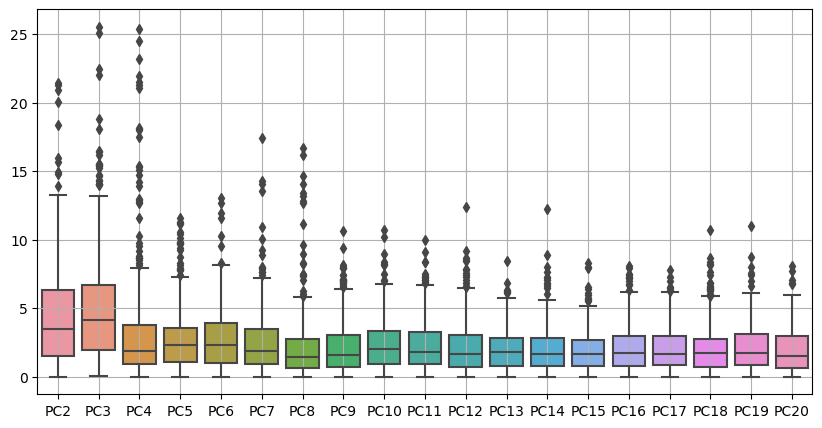

In [195]:
# Box plot for (abs) t-statistics of the coefficient on the last included coefficient
# excluding the one with only PC1
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=np.abs(t_betas.drop('PC1',axis=1)))
#plt.savefig('output/figures/Q1e_t_betas_noPC1.pdf')
a.grid(True)
plt.show()

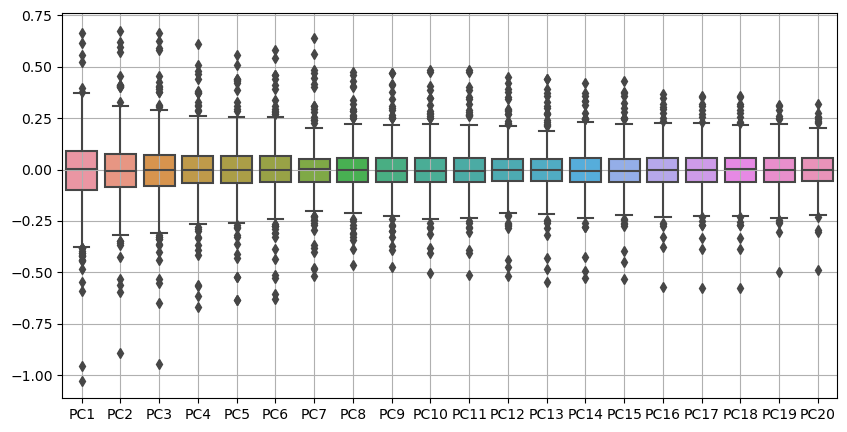

In [49]:
# Box plot for alpha
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=alphas)
a.grid(True)
plt.show()

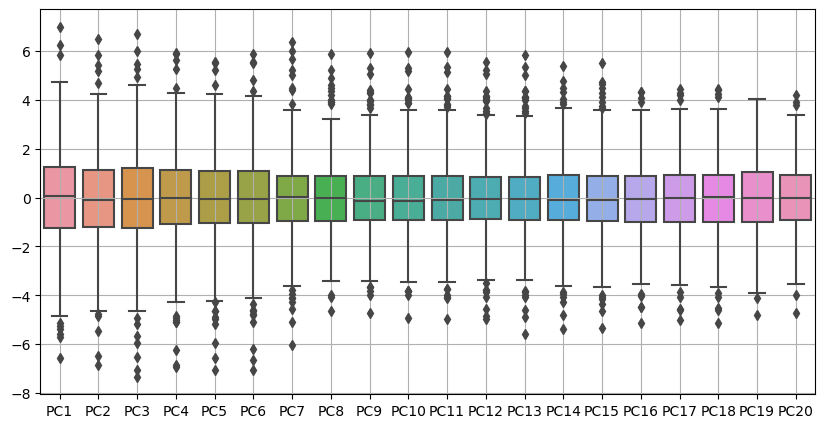

In [48]:
# Box plot for p-values of alpha
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=t_alphas)
a.grid(True)
plt.show()

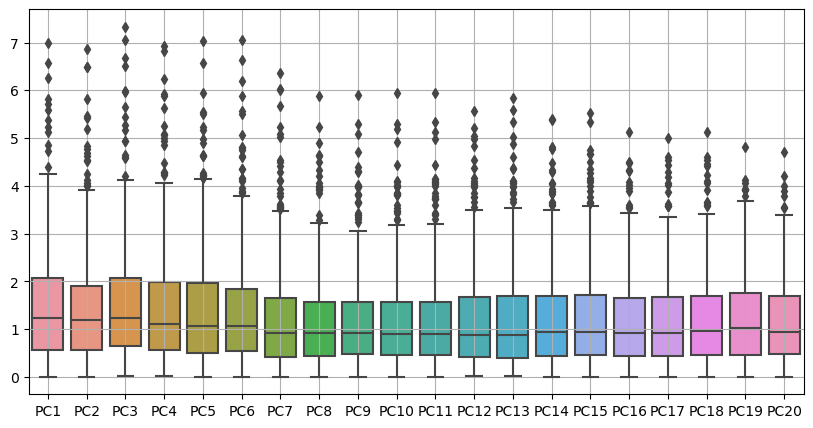

In [47]:
# Box plot for (abs) t-statistics of alpha
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=np.abs(t_alphas))
a.grid(True)
plt.show()

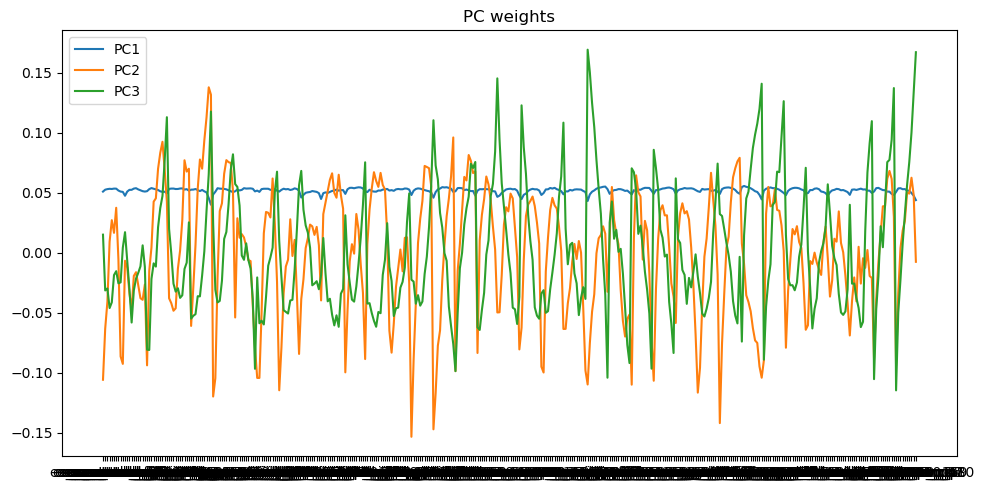

In [87]:
# Loadings
f = plt.figure(figsize=(10,5))
for i in range(0,3):
    plt.plot(PCA_sm_load['PC'+str(i+1)],label='PC'+str(i+1))
plt.title('PC weights')
plt.legend()

#plt.grid(True)
plt.tight_layout()
plt.show()

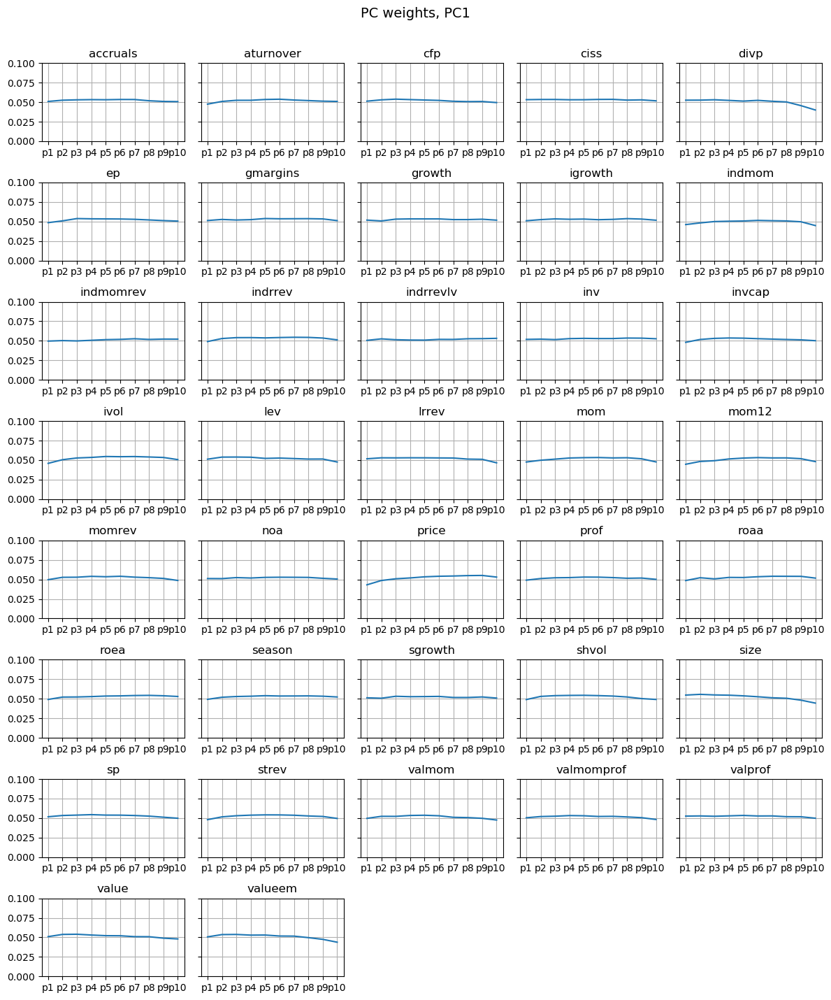

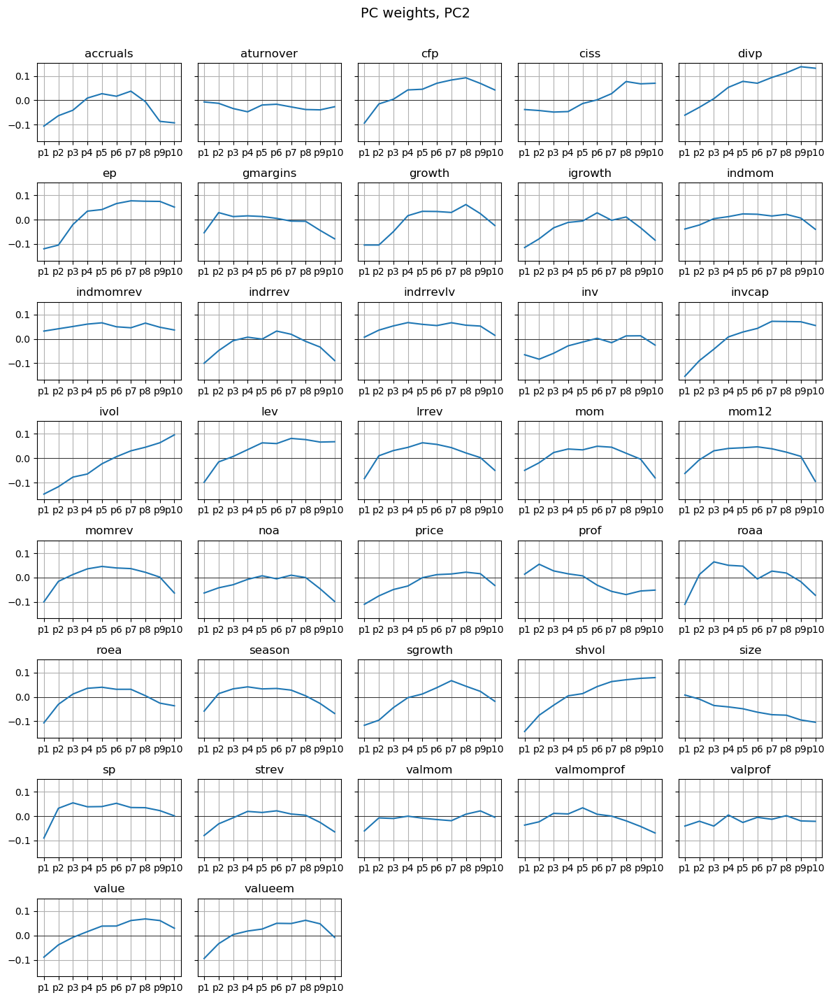

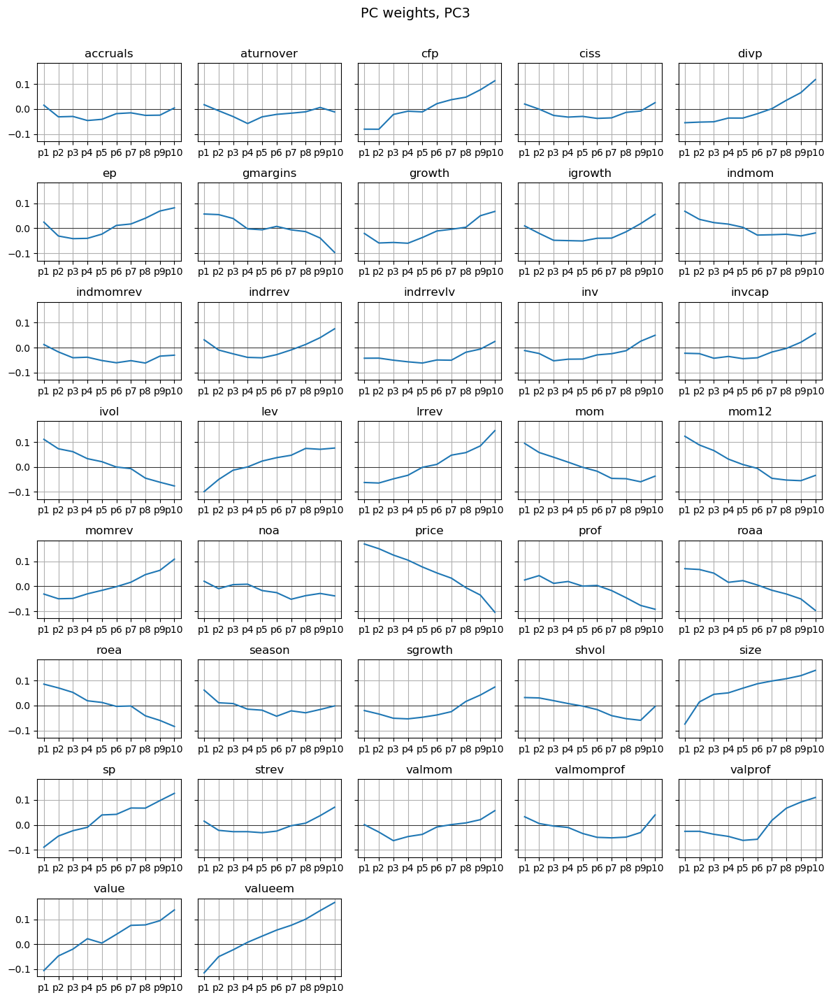

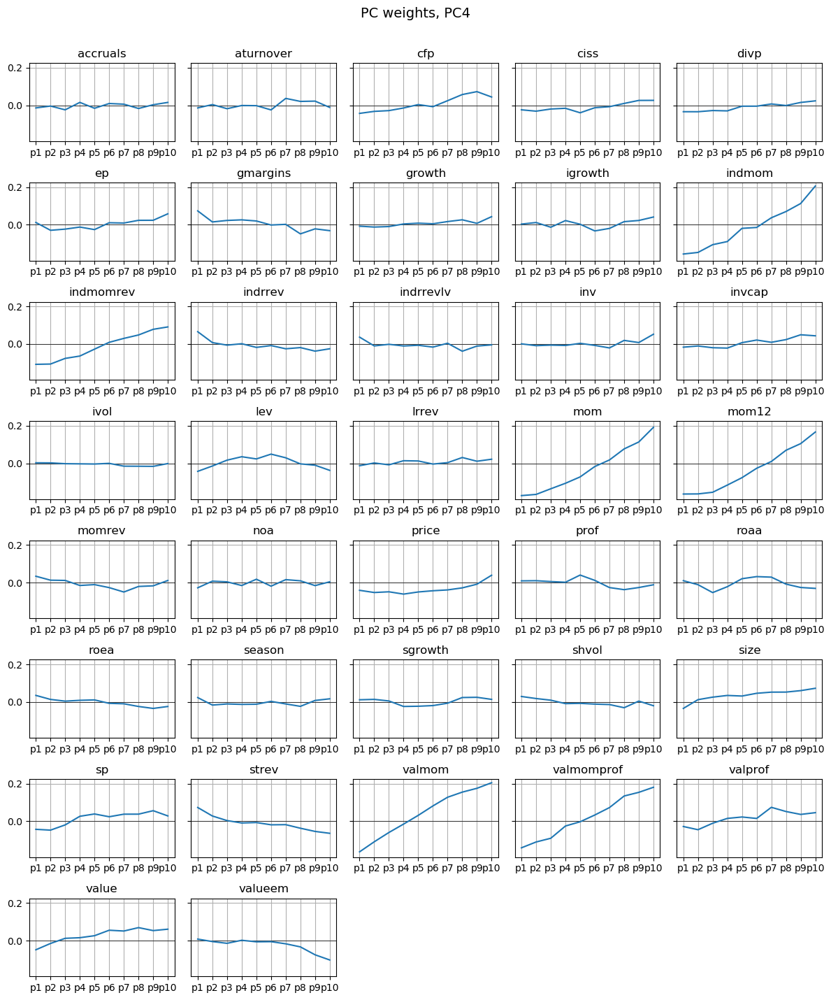

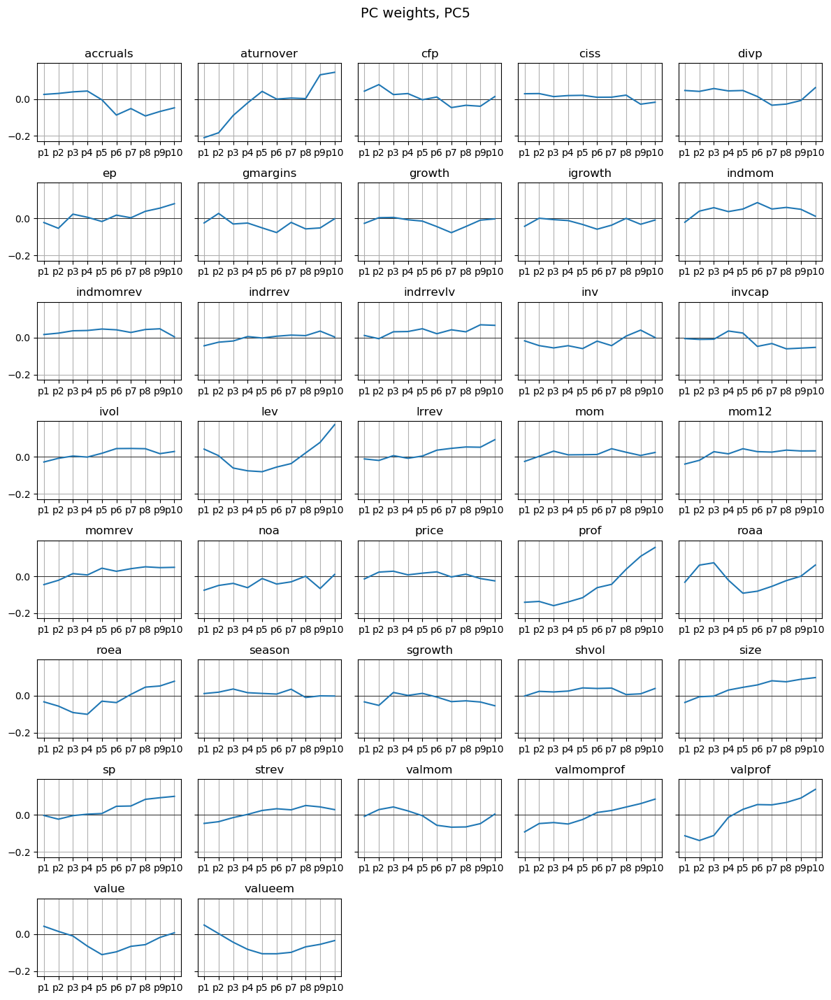

In [201]:
# Loadings by factor for PC1,PC2,PC3,PC4,PC5
nrows = 8
ncols = 5

for i in range(0,5):
    f,ax = plt.subplots(nrows=nrows,ncols=ncols,figsize=(12,15),sharey=True)
    #i = 0 # PC1
    k = 0
    for factor in factors:
        a = ax[k//ncols,k%ncols]
        a.axhline(color='k',linewidth=0.5)
        cols = ['ex_'+factor+'_p'+str(l+1) for l in range(0,10)]
        #PCA_sm_load['PC'+str(i+1)].T.filter(like=factor+'_').plot(ax=a)
        PCA_sm_load['PC'+str(i+1)].T[cols].plot(ax=a)
        a.grid(True)
        a.set_title(factor)
        a.set_xticks([l for l in range(0,10)])
        a.set_xticklabels(['p'+str(l+1) for l in range(0,10)])
        k += 1
        if i == 0:
            a.set_ylim([0,0.1])

    [ax.flatten()[-3:][l].axis('off') for l in range(0,3)]

    plt.tight_layout()
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle('PC weights, PC'+str(i+1),fontsize=14)
    plt.savefig('output/figures/Q1e_PC'+str(i+1)+'_weights.pdf')
    plt.show()

In [205]:
#from pandas_datareader.famafrench import get_available_datasets
#get_available_datasets()

In [206]:
# Obtain data for momentum factor
dt_start  = dt.datetime(1927, 1, 31)
mom       = web.DataReader('F-F_Momentum_Factor','famafrench', start=dt_start)
mom       = mom[0]
mom.columns = ['MOM']

In [222]:
# Merge with FF5 & mom
PCA_ff = PCA_sm.merge(ff5, left_index=True, right_index=True, how='inner')
PCA_ff = PCA_ff.merge(mom, left_index=True, right_index=True, how='inner')

In [232]:
# Correlations between PCs and known factors
#PCA_ff[['PC1','PC2','PC3','PC4','PC5','Mkt-RF','SMB','HML','RMW','CMA','MOM']]\
#    .corr().iloc[:5,5:].to_csv('output/tables/Q1e_corr_PCs_FF5_MOM.csv')
PCA_ff[['PC1','PC2','PC3','PC4','PC5','Mkt-RF','SMB','HML','RMW','CMA','MOM']].corr().iloc[:5,5:]

,Mkt-RF,SMB,HML,RMW,CMA,MOM
PC1,0.995,0.294,-0.205,-0.202,-0.340,-0.156
PC2,-0.067,-0.436,0.669,0.398,0.557,-0.095
PC3,-0.050,0.615,0.519,-0.416,0.367,-0.452
PC4,-0.028,0.253,0.116,-0.094,0.200,0.744
PC5,-0.024,0.266,0.096,0.346,-0.065,0.080


#### (f) Consider linear factor models with PCs as factors and evaluate the pricing errors. You may want to consider models with different sets of PCs.

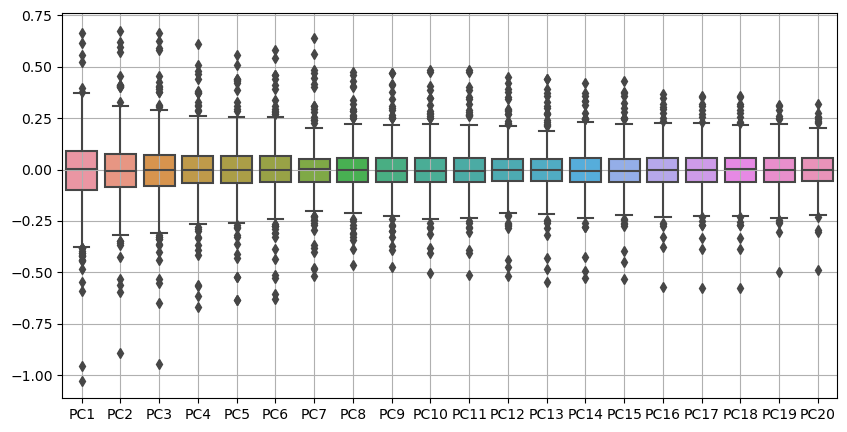

In [333]:
# Regressions were already run, here we just plot the resulting alpha
# Box plot
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=alphas)
a.grid(True)
plt.show()

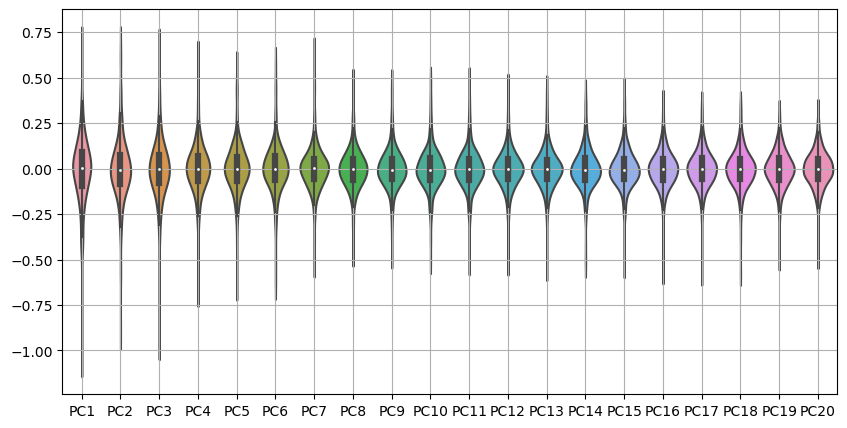

In [334]:
# Regressions where already run, here we just plot the resulting alpha
# Violin plot
f = plt.figure(figsize=(10,5))
a = sns.violinplot(data=alphas)
a.grid(True)
plt.show()

In [687]:
std_alphas.reindex(to_plot.index)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
portfolio,,,,,,,,,,,,,,,,,,,,
ex_mom12_p1,0.184,0.187,0.159,0.115,0.112,0.111,0.127,0.135,0.136,0.134,0.134,0.123,0.123,0.122,0.108,0.103,0.106,0.107,0.102,0.103
ex_ivol_p1,0.225,0.145,0.092,0.098,0.097,0.095,0.095,0.100,0.101,0.103,0.103,0.104,0.097,0.098,0.100,0.111,0.115,0.113,0.103,0.104
ex_indrrev_p1,0.115,0.094,0.094,0.090,0.088,0.085,0.089,0.058,0.061,0.057,0.056,0.054,0.051,0.051,0.052,0.053,0.054,0.053,0.054,0.054
ex_indrrevlv_p1,0.083,0.082,0.076,0.089,0.090,0.086,0.086,0.086,0.087,0.090,0.081,0.081,0.085,0.086,0.083,0.081,0.075,0.074,0.066,0.075
ex_indmomrev_p1,0.085,0.082,0.082,0.077,0.083,0.081,0.088,0.090,0.092,0.090,0.090,0.090,0.084,0.084,0.083,0.086,0.085,0.086,0.085,0.076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ex_mom12_p10,0.134,0.110,0.111,0.074,0.074,0.074,0.071,0.069,0.070,0.071,0.071,0.073,0.071,0.073,0.070,0.069,0.069,0.067,0.063,0.064
ex_indrrevlv_p9,0.083,0.084,0.084,0.082,0.077,0.079,0.080,0.068,0.070,0.071,0.072,0.072,0.073,0.079,0.077,0.081,0.083,0.083,0.083,0.090
ex_valmomprof_p10,0.127,0.144,0.134,0.083,0.079,0.077,0.073,0.087,0.087,0.082,0.082,0.083,0.081,0.083,0.084,0.084,0.080,0.080,0.077,0.083


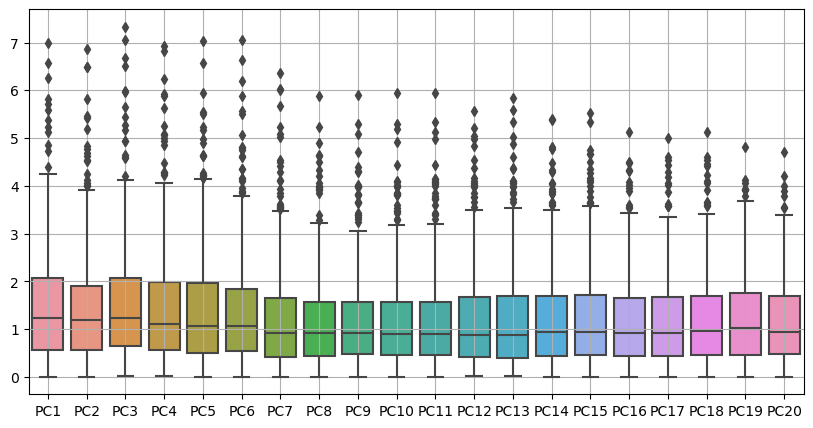

In [336]:
# Regressions were already run, here we just plot the resulting alpha (absolute value of t-stat)
# Box plot
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=np.abs(t_alphas))
a.grid(True)
plt.show()

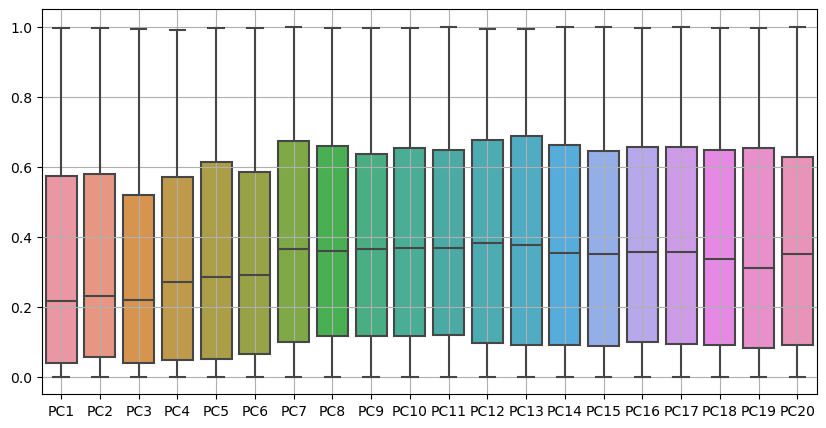

In [66]:
# Regressions were already run, here we just plot the resulting alpha (absolute value of t-stat)
# Box plot
f = plt.figure(figsize=(10,5))
a = sns.boxplot(data=p_alphas)
a.grid(True)
plt.show()

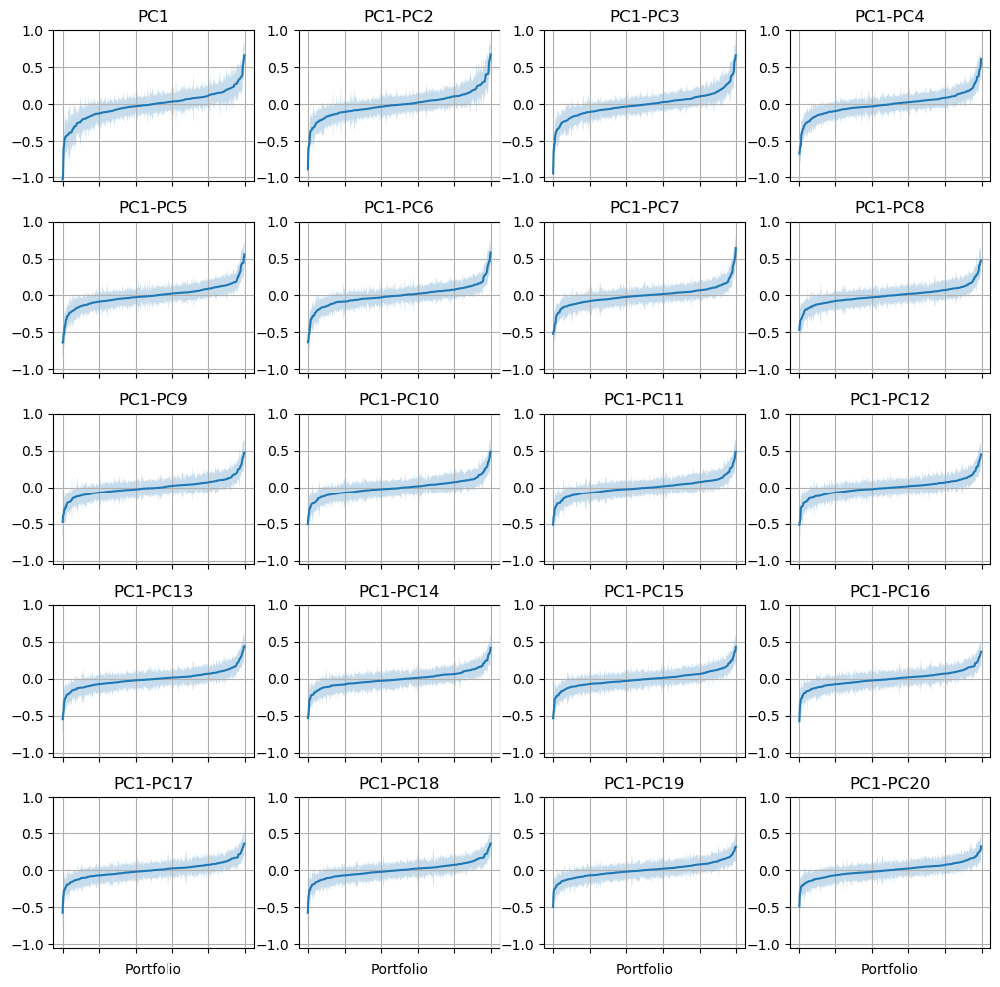

In [63]:
# Pricing errors for PC1 to PC1-PC20
f,ax = plt.subplots(nrows=5,ncols=4,figsize=(10,10),sharey=True)
for i in range(0,20):
    #a = plt.subplot(5,4,i+1) # Not working well with sharey for some reason
    a = ax[i//4,i%4]
    to_plot = alphas['PC'+str(i+1)].sort_values()
    a.plot(to_plot.index,to_plot) #,color=colors[i])
    a.fill_between(to_plot.index,to_plot-1.96*std_alphas['PC'+str(i+1)].reindex(to_plot.index),
                          to_plot+1.96*std_alphas['PC'+str(i+1)].reindex(to_plot.index),
                          alpha=0.25)
                            #color=colors[i],alpha=0.25)
    a.set_xticks([i*37*2 for i in range(0,6)])
    a.set_xticklabels([])
    a.grid(True)
    if i == 0:
        a.set_title('PC1')
    else:
        a.set_title('PC1-PC'+str(i+1))
    #a.legend(['PC'+str(i+1)])
    a.yaxis.set_tick_params(labelbottom=True)
    if i//4 == 4:
        a.set_xlabel('Portfolio')
a.set_xticklabels([])
a.set_ylim([-1.05,1.0])
plt.tight_layout()
#plt.savefig('output/figures/Q1f_alphas.pdf')
plt.show()

In [59]:
# RMSE (% per month)
np.sqrt(np.sum(alphas**2,axis=0)/len(ex_rets))

PC1    0.190
PC2    0.169
PC3    0.169
PC4    0.149
PC5    0.142
PC6    0.139
PC7    0.128
PC8    0.117
PC9    0.116
PC10   0.116
PC11   0.116
PC12   0.114
PC13   0.114
PC14   0.111
PC15   0.111
PC16   0.105
PC17   0.105
PC18   0.105
PC19   0.099
PC20   0.097
dtype: float64

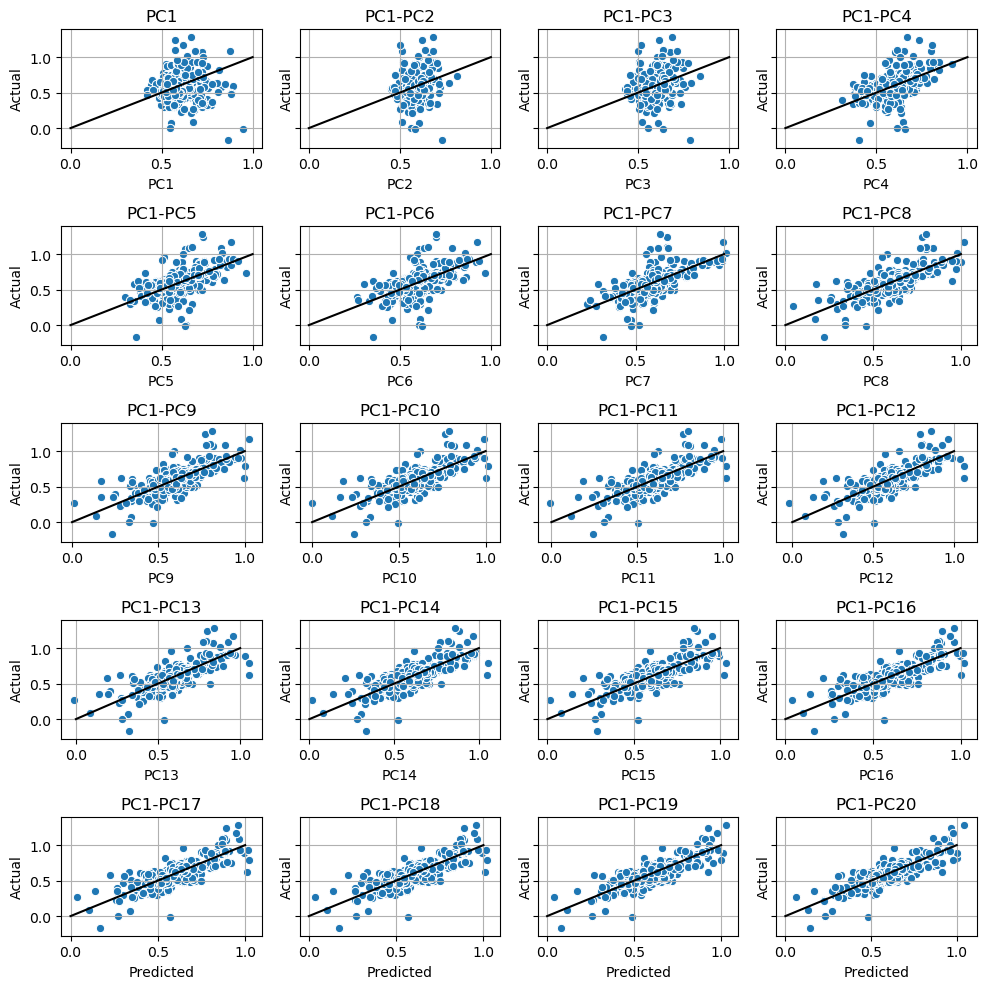

In [84]:
# Predicted vs. actual excess returns (% per month)
f,ax = plt.subplots(nrows=5,ncols=4,figsize=(10,10),sharey=True)
for i in range(0,20):
    #a = plt.subplot(5,4,i+1) # Not working well with sharey for some reason
    a = ax[i//4,i%4]
    sns.scatterplot(mean_predicts['PC'+str(i+1)],df_ff[ex_rets].mean(),ax=a)
    a.plot([0,1],[0,1],color='k') # 45-degree line
    a.grid(True)
    if i == 0:
        a.set_title('PC1')
    else:
        a.set_title('PC1-PC'+str(i+1))
    if i//4 == 4:
        a.set_xlabel('Predicted')
    a.set_ylabel('Actual')
plt.tight_layout()
#plt.savefig('output/figures/Q1f_actual_vs_pred_pppermonth.pdf')
plt.show()

## Problem 2

#### Load data

In [234]:
# Portfolios
dt_start    = dt.datetime(1920, 1, 1)
port_FF25   = web.DataReader('25_Portfolios_5x5','famafrench', start=dt_start)
port_FF25   = port_FF25[0]
ex_rets = port_FF25.columns

In [235]:
# Factors
dt_start    = dt.datetime(1920, 1, 1)
factors_FF5 = web.DataReader('F-F_Research_Data_5_Factors_2x3','famafrench', start=dt_start)
factors_FF5 = factors_FF5[0]
#ff5.index = ff5.index.strftime('%b-%y').astype(str) # To match format of index in df

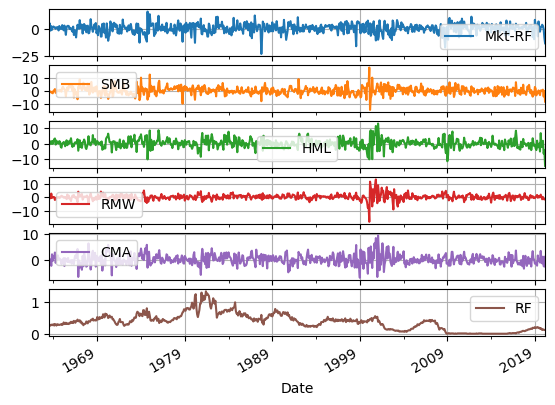

In [236]:
a = factors_FF5.plot(subplots=True)
[a[i].grid(True) for i in range(0,len(a))]
plt.show()

In [237]:
df_pb2 = port_FF25.merge(factors_FF5,left_index=True,right_index=True,how='inner')

In [134]:
#df_pb2.index = df_pb2.index.to_timestamp().to_pydatetime()

In [238]:
df_pb2

,SMALL LoBM,ME1 BM2,ME1 BM3,ME1 BM4,SMALL HiBM,ME2 BM1,ME2 BM2,ME2 BM3,ME2 BM4,ME2 BM5,...,ME5 BM2,ME5 BM3,ME5 BM4,BIG HiBM,Mkt-RF,SMB,HML,RMW,CMA,RF
Date,,,,,,,,,,,,,,,,,,,,,
1963-07,1.123,-0.148,0.556,0.110,-1.321,-1.872,0.294,-0.845,-1.964,-1.189,...,0.452,1.256,-0.429,-1.103,-0.390,-0.470,-0.830,0.660,-1.150,0.270
1963-08,4.243,1.483,1.321,2.370,4.675,5.398,4.646,4.364,4.419,8.233,...,4.223,4.749,8.142,6.382,5.070,-0.790,1.670,0.390,-0.400,0.250
1963-09,-2.892,0.703,-1.087,-1.581,-0.358,-3.916,-1.571,-0.642,-1.181,-2.915,...,-0.772,-0.985,-0.191,-3.496,-1.570,-0.480,0.180,-0.760,0.240,0.270
1963-10,1.286,-0.649,1.244,0.100,2.372,1.188,4.301,2.344,2.201,3.933,...,1.738,-0.283,2.415,0.486,2.530,-1.290,-0.100,2.750,-2.240,0.290
1963-11,-3.379,-4.035,-1.597,-1.055,-1.045,-4.182,-1.764,-0.706,-0.100,-0.113,...,0.985,-1.554,-2.132,1.345,-0.850,-0.840,1.710,-0.450,2.220,0.270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11,7.253,5.814,3.790,4.279,2.566,8.567,3.421,3.524,3.685,1.805,...,4.231,2.397,3.203,4.121,3.870,0.500,-1.860,-1.500,-1.290,0.120
2019-12,3.844,13.383,2.425,5.396,6.941,3.951,1.769,6.285,2.498,7.389,...,1.575,2.146,3.345,2.979,2.770,0.960,1.830,0.210,1.310,0.140
2020-01,-1.205,-3.342,-4.856,-6.203,-9.253,-2.487,-2.133,-5.753,-6.304,-9.763,...,0.298,-0.565,-5.615,-3.018,-0.110,-4.400,-6.270,-1.230,-2.340,0.130


In [239]:
# Constant alpha & beta
# CAPM
nlags                  = 12 # For NW
CAPM                   = ['Mkt-RF']
FF5                    = ['Mkt-RF','SMB','HML','RMW','CMA']
factors                = CAPM
pb2_sm_models_CAPM     = []
pb2_sm_results_CAPM    = []
pb2_sm_results_NW_CAPM = []
pb2_results_CAPM       = []
for ex_ret in ex_rets:
    model = sm.OLS(df_pb2[ex_ret], sm.add_constant(df_pb2[CAPM]), missing='drop')
    results = model.fit()
    results_NW = results.get_robustcov_results(cov_type='HAC', maxlags=nlags)
    pb2_sm_models_CAPM.append(model)
    pb2_sm_results_CAPM.append(results)
    pb2_sm_results_NW_CAPM.append(results_NW)
    row = []
    row.append(ex_ret)
    row.append(results.params['const'])
    row.append(results_NW.bse[0])
    row.append(results.params['Mkt-RF'])
    row.append(results_NW.bse[1])
    pb2_results_CAPM.append(row)
pb2_results_CAPM = pd.DataFrame(pb2_results_CAPM)
pb2_results_CAPM.rename(columns={0:'portfolio',1:'alpha',2:'std_alpha',
                            3:'beta_MKT',4:'std_beta_MKT'},inplace=True)
pb2_results_CAPM = pb2_results_CAPM.set_index('portfolio')

In [240]:
# Constant alpha & beta
# FF5
nlags                  = 12 # For NW
CAPM                   = ['Mkt-RF']
FF5                    = ['Mkt-RF','SMB','HML','RMW','CMA']
factors                = FF5
pb2_sm_models_FF5     = []
pb2_sm_results_FF5    = []
pb2_sm_results_NW_FF5 = []
pb2_results_FF5       = []
for ex_ret in ex_rets:
    model = sm.OLS(df_pb2[ex_ret], sm.add_constant(df_pb2[FF5]), missing='drop')
    results = model.fit()
    results_NW = results.get_robustcov_results(cov_type='HAC', maxlags=nlags)
    pb2_sm_models_FF5.append(model)
    pb2_sm_results_FF5.append(results)
    pb2_sm_results_NW_FF5.append(results_NW)
    row = []
    row.append(ex_ret)
    row.append(results.params['const'])
    row.append(results_NW.bse[0])
    row.append(results.params['Mkt-RF'])
    row.append(results_NW.bse[1])
    row.append(results.params['SMB'])
    row.append(results_NW.bse[2])
    row.append(results.params['HML'])
    row.append(results_NW.bse[3])
    row.append(results.params['RMW'])
    row.append(results_NW.bse[4])
    row.append(results.params['CMA'])
    row.append(results_NW.bse[5])
    pb2_results_FF5.append(row)
pb2_results_FF5 = pd.DataFrame(pb2_results_FF5)
pb2_results_FF5.rename(columns={0:'portfolio',1:'alpha',2:'std_alpha',
                            3:'beta_MKT',4:'std_beta_MKT',
                            5:'beta_SMB',6:'std_beta_SMB',
                            7:'beta_HML',8:'std_beta_HML',
                            9:'beta_RMW',10:'std_beta_RMW',
                            11:'beta_CMA',12:'std_beta_CMA'},inplace=True)
pb2_results_FF5 = pb2_results_FF5.set_index('portfolio')

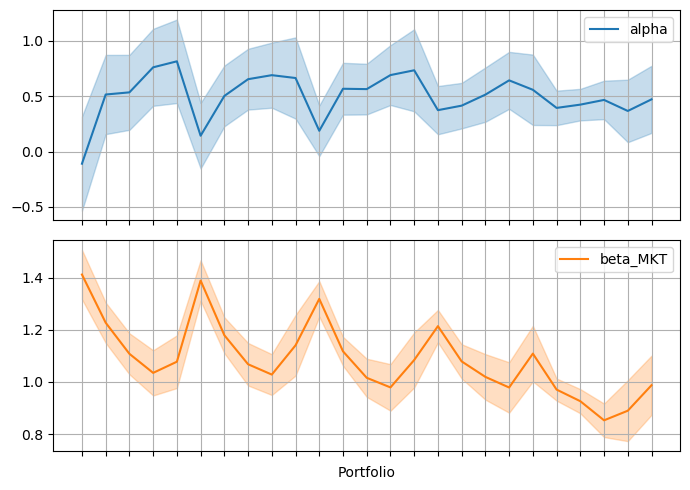

In [241]:
# Plot results from the CAPM
to_plot = pb2_results_CAPM
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
var = ['alpha','beta_MKT']

f,a = plt.subplots(nrows=2,ncols=1,figsize=(7,5))
#a = to_plot[var].plot(figsize=(10,20),subplots=True)
for i in range(0,2):
    a[i].plot(to_plot.index,to_plot[var[i]],color=colors[i])
    a[i].fill_between(to_plot.index,to_plot[var[i]]-1.96*to_plot['std_'+var[i]],
                          to_plot[var[i]]+1.96*to_plot['std_'+var[i]],
                          color=colors[i],alpha=0.25)
    #a[i].set_xticks([i*37*2 for i in range(0,6)])
    a[i].set_xticklabels([])
    a[i].grid(True)
    a[i].legend([var[i]])
a[i].set_xticklabels([])
a[i].set_xlabel('Portfolio')
plt.tight_layout()
plt.show()

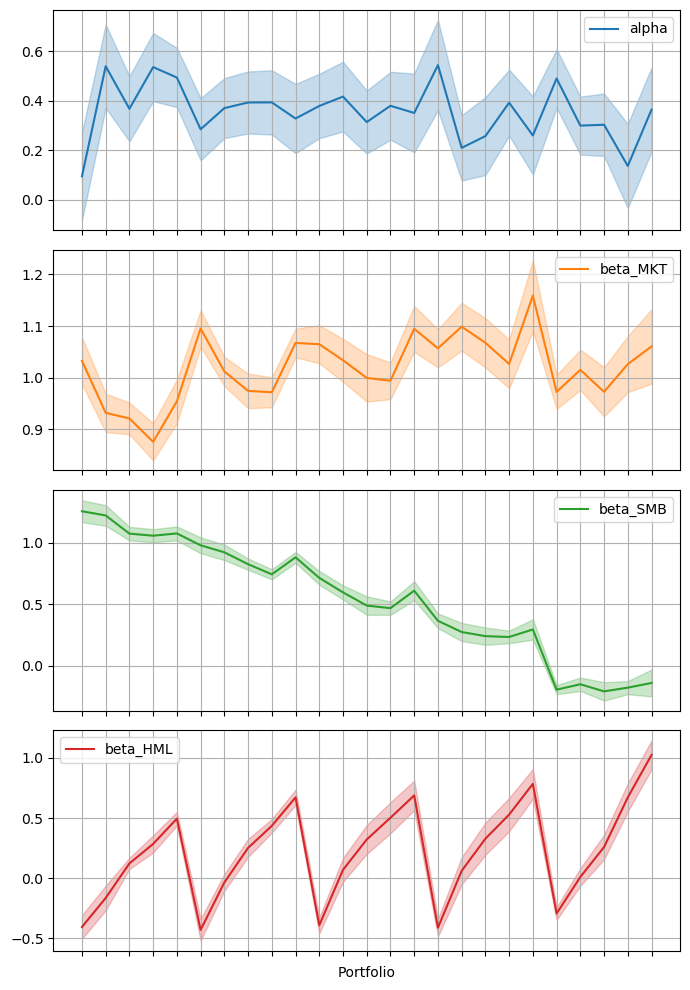

In [242]:
# Plot the results for FF5
to_plot = pb2_results_FF5
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
var = ['alpha','beta_MKT','beta_SMB','beta_HML']

f,a = plt.subplots(nrows=4,ncols=1,figsize=(7,10))
#a = to_plot[var].plot(figsize=(10,20),subplots=True)
for i in range(0,4):
    a[i].plot(to_plot.index,to_plot[var[i]],color=colors[i])
    a[i].fill_between(to_plot.index,to_plot[var[i]]-1.96*to_plot['std_'+var[i]],
                          to_plot[var[i]]+1.96*to_plot['std_'+var[i]],
                          color=colors[i],alpha=0.25)
    #a[i].set_xticks([i*37*2 for i in range(0,6)])
    a[i].set_xticklabels([])
    a[i].grid(True)
    a[i].legend([var[i]])
a[3].set_xticklabels([])
a[3].set_xlabel('Portfolio')
plt.tight_layout()
plt.show()

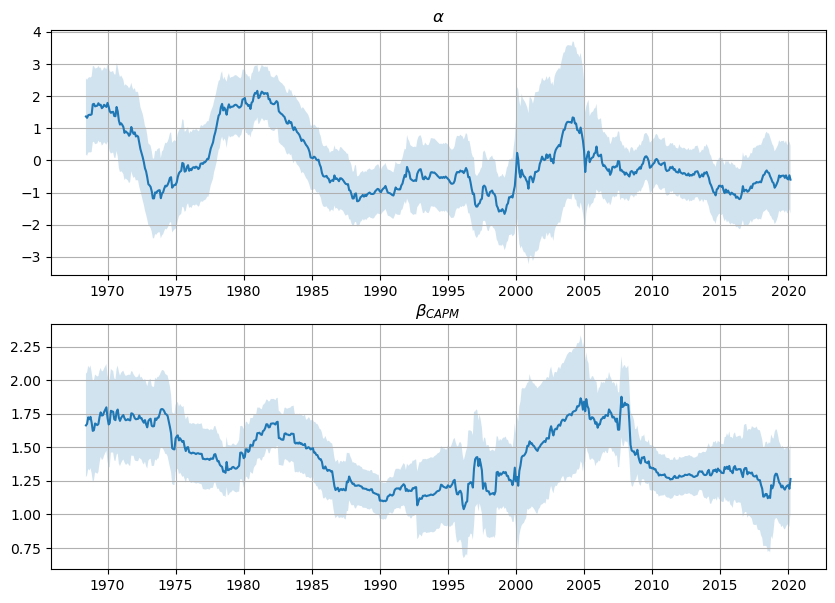

In [243]:
# Rolling alpha & beta
years     = mdates.YearLocator(5) 
months    = mdates.MonthLocator() 
years_fmt = mdates.DateFormatter('%Y')

y = df_pb2['SMALL LoBM']
X = df_pb2['Mkt-RF']

beta_roll_res = RollingOLS(y, sm.add_constant(X), window=60).fit()

est     = beta_roll_res.params
se      = beta_roll_res.bse

fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize=(10,7))
ax[0].plot(est.index.to_timestamp().to_pydatetime(),est['const'])
           #est['const'], c = 'black')
ax[0].fill_between(est.index.to_timestamp().to_pydatetime(),
            est['const']-2*se['const'], est['const']+2*se['const'], alpha=0.2) #, facecolor='b')
ax[0].set_title(r'$\alpha$')
ax[0].xaxis.set_major_locator(years)
ax[0].xaxis.set_major_formatter(years_fmt)
ax[0].grid(True)

ax[1].plot(est.index.to_timestamp().to_pydatetime(),est['Mkt-RF'])
            #est['Mkt-RF'], c = 'black')
ax[1].fill_between(est.index.to_timestamp().to_pydatetime(),
            est['Mkt-RF']-2*se['Mkt-RF'], est['Mkt-RF']+2*se['Mkt-RF'], alpha=0.2) #, facecolor='b')
ax[1].set_title(r'$\beta_{CAPM}$')
#ax[1].xaxis.set_major_locator(MultipleLocator(60))
ax[1].xaxis.set_major_locator(years)
ax[1].xaxis.set_major_formatter(years_fmt)
ax[1].grid(True)

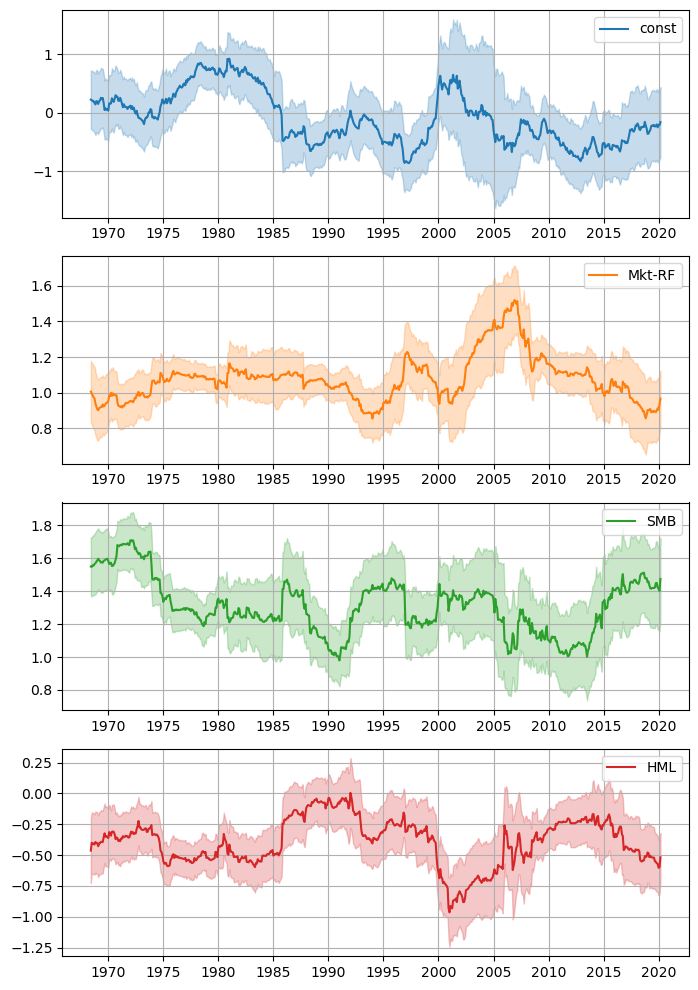

In [248]:
# Rolling regressions for FF
years     = mdates.YearLocator(5) 
months    = mdates.MonthLocator() 
years_fmt = mdates.DateFormatter('%Y')

y = df_pb2['SMALL LoBM']
X = df_pb2[['Mkt-RF','SMB','HML']]

beta_roll_res = RollingOLS(y, sm.add_constant(X), window=60).fit()

est     = beta_roll_res.params
se      = beta_roll_res.bse

# Plot the results
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
var = ['const','Mkt-RF','SMB','HML']

f,a = plt.subplots(nrows=4,ncols=1,figsize=(7,10))
for i in range(0,4):
    a[i].plot(est.index.to_timestamp().to_pydatetime(),
              est[var[i]],color=colors[i])
    a[i].fill_between(est.index.to_timestamp().to_pydatetime(),
                      est[var[i]]-1.96*se[var[i]],
                      est[var[i]]+1.96*se[var[i]],
                      color=colors[i],alpha=0.25)
    a[i].xaxis.set_major_locator(years)
    a[i].xaxis.set_major_formatter(years_fmt)
    a[i].grid(True)
    a[i].legend([var[i]])
plt.tight_layout()
plt.show()

In [249]:
# Time-varying coefficient with pykalman (assuming random-walk for alpha and beta)
def KF(y, x, state_mean0 = None, state_cov0 = None, delta = 1e-3, smooth = False):
    if state_cov0 is None:
        trans_cov  = delta / (1 - delta) * np.eye(2)
        state_cov0 = np.ones((2, 2))
    else:
        trans_cov  = delta / (1 - delta) * state_cov0
        
    if state_mean0 is None:
        state_mean0 = [0,0]
        
    kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, # y is 1-dimensional, (alpha, beta) is 2-dimensional
                      initial_state_mean=state_mean0,
                      initial_state_covariance= state_cov0,
                      transition_matrices=np.eye(2),
                      observation_matrices=x,
                      observation_covariance=2,
                      transition_covariance=trans_cov)
    if smooth:
        return kf.smooth(y)
    else:
        return kf.filter(y)

In [250]:
# All 25 FF portfolios
ex_rets   = df_pb2.drop(['Mkt-RF','SMB','HML','RMW','CMA','RF'],axis=1).columns
df_kf     = {}
slope_ave = {}

for ex_ret in ex_rets:
    y = df_pb2[ex_ret]
    x = df_pb2['Mkt-RF']
    X = np.expand_dims(np.vstack([[x], [np.ones(len(x))]]).T, axis=1)
    state_means, state_covs = KF(y, X, delta = 1e-4, smooth = True)
    df_kf[ex_ret] = pd.DataFrame(state_means, columns = ['slope', 'intercept'])
    df_kf[ex_ret]['SE slope'] = state_covs[:,0,0]**.5
    df_kf[ex_ret]['SE intercept'] = state_covs[:,1,1]**.5
    df_kf[ex_ret]['Ex Ret'] = y.values
    df_kf[ex_ret]['Mkt-RF'] = x.values
    df_kf[ex_ret].index = x.index
    slope_ave[ex_ret] = df_kf[ex_ret].describe()['slope']['mean']

# Constant beta
df_kf_cst_beta = {}

for ex_ret in ex_rets:
    y = df_pb2[ex_ret]
    x = df_pb2['Mkt-RF']
    X = np.expand_dims(np.vstack([[x], [np.ones(len(x))]]).T, axis=1)
    state_means, state_covs = KF(y, X, state_mean0 = [slope_ave[ex_ret], 0], state_cov0 = np.array([[0,0],[0,1]]))
    df_kf_cst_beta[ex_ret] = pd.DataFrame(state_means, columns = ['slope', 'intercept'])
    df_kf_cst_beta[ex_ret]['SE slope'] = state_covs[:,0,0]**.5
    df_kf_cst_beta[ex_ret]['SE intercept'] = state_covs[:,1,1]**.5
    df_kf_cst_beta[ex_ret]['Ex Ret'] = y.values
    df_kf_cst_beta[ex_ret]['Mkt-RF'] = x.values
    df_kf_cst_beta[ex_ret].index = x.index

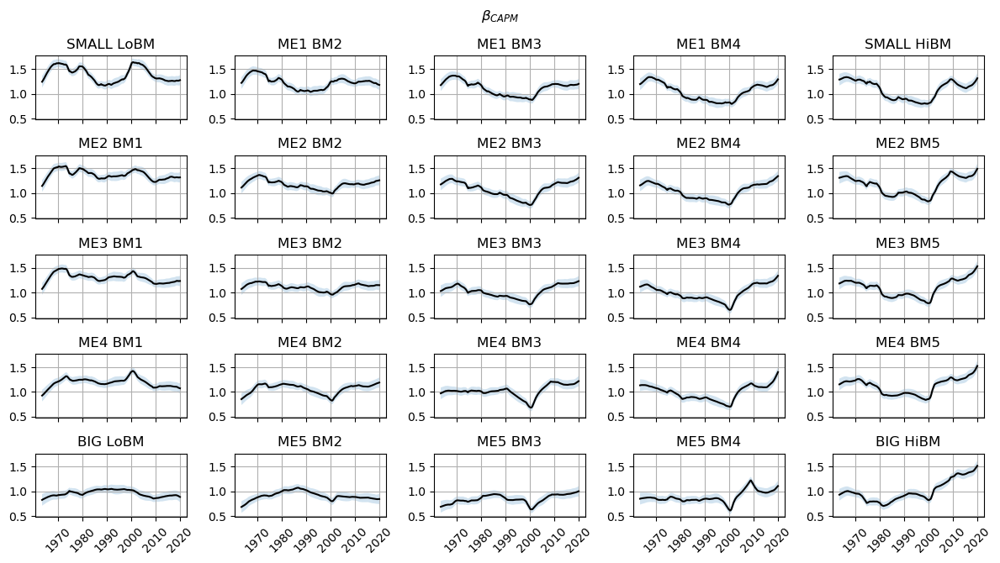

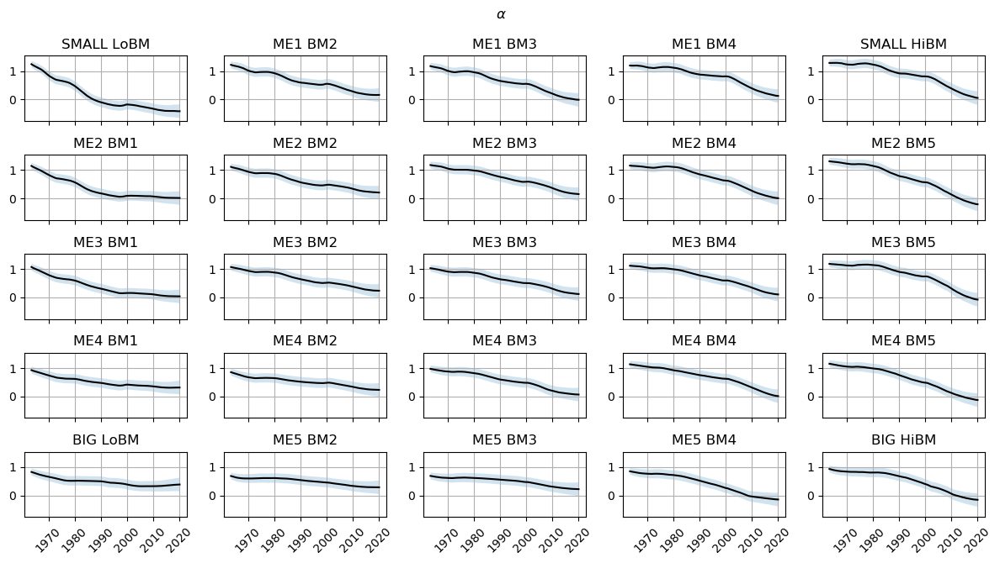

In [251]:
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf
f,ax = plt.subplots(nrows=5,ncols=5,figsize=(12,7),sharey=True)
i = 0

for ex_ret in ex_rets:
    a = ax[i//5,i%5]
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['slope'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['slope']-2*df_toplot[ex_ret]['SE slope'],
                   df_toplot[ex_ret]['slope']+2*df_toplot[ex_ret]['SE slope'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    a.xaxis.set_tick_params(rotation=45)
    if i//5 != 4:
        a.xaxis.set_tick_params(labelbottom=False)
    i+=1

#plt.tight_layout()
plt.suptitle(r'$\beta_{CAPM}$')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

f,ax = plt.subplots(nrows=5,ncols=5,figsize=(12,7),sharey=True)
i = 0

for ex_ret in ex_rets:
    a = ax[i//5,i%5]
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['intercept'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['intercept']-2*df_toplot[ex_ret]['SE intercept'],
                   df_toplot[ex_ret]['intercept']+2*df_toplot[ex_ret]['SE intercept'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    a.xaxis.set_tick_params(rotation=45)
    if i//5 != 4:
        a.xaxis.set_tick_params(labelbottom=False)
    i+=1

#plt.tight_layout()
plt.suptitle(r'$\alpha$')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

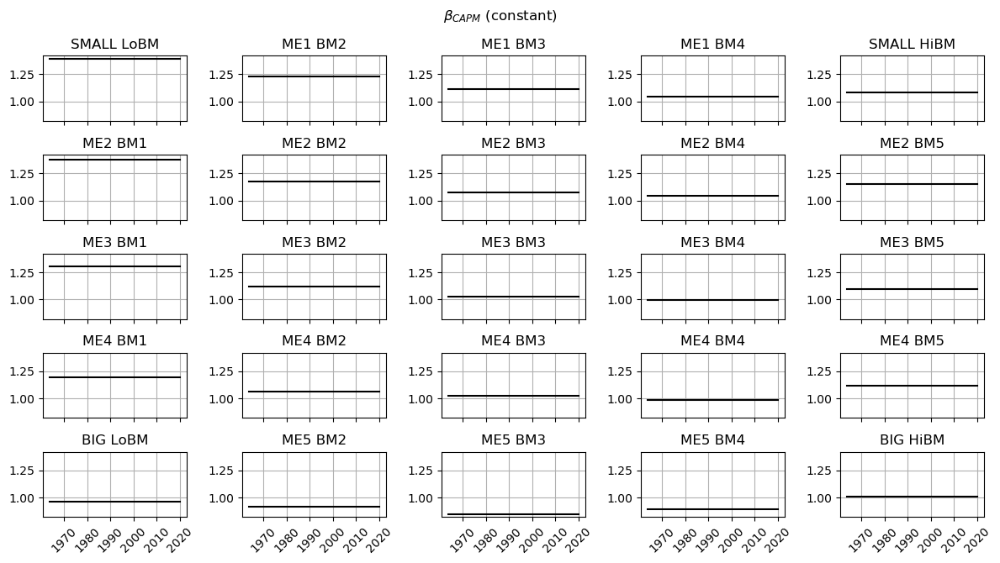

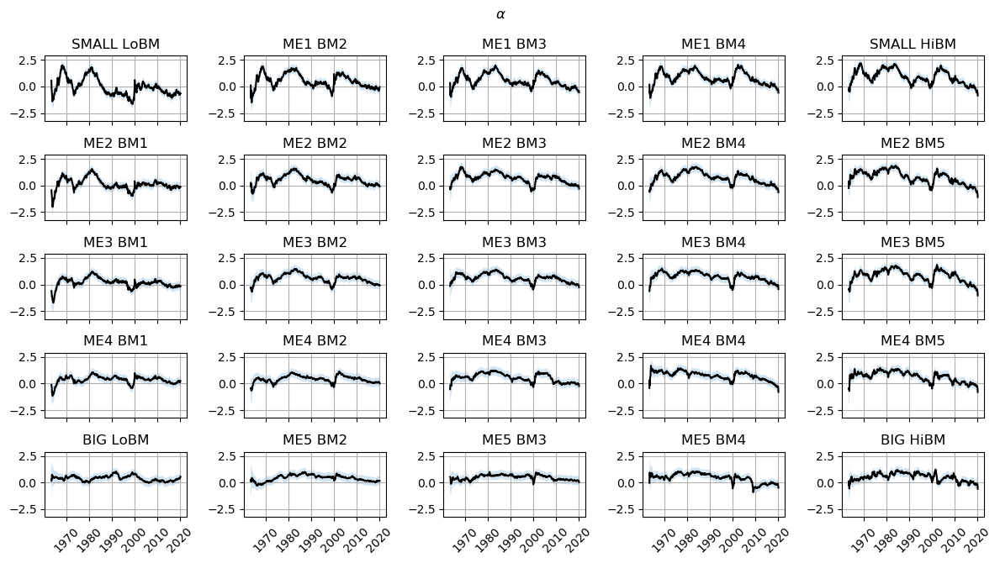

In [253]:
# Plot results for constant beta, but time-varying (random-walk) alpha
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_cst_beta
f,ax = plt.subplots(nrows=5,ncols=5,figsize=(12,7),sharey=True)
i = 0

for ex_ret in ex_rets:
    a = ax[i//5,i%5]
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['slope'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['slope']-2*df_toplot[ex_ret]['SE slope'],
                   df_toplot[ex_ret]['slope']+2*df_toplot[ex_ret]['SE slope'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    a.xaxis.set_tick_params(rotation=45)
    if i//5 != 4:
        a.xaxis.set_tick_params(labelbottom=False)
    i+=1

#plt.tight_layout()
plt.suptitle(r'$\beta_{CAPM}$ (constant)')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

f,ax = plt.subplots(nrows=5,ncols=5,figsize=(12,7),sharey=True)
i = 0

for ex_ret in ex_rets:
    a = ax[i//5,i%5]
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['intercept'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['intercept']-2*df_toplot[ex_ret]['SE intercept'],
                   df_toplot[ex_ret]['intercept']+2*df_toplot[ex_ret]['SE intercept'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    a.xaxis.set_tick_params(rotation=45)
    if i//5 != 4:
        a.xaxis.set_tick_params(labelbottom=False)
    i+=1

#plt.tight_layout()
plt.suptitle(r'$\alpha$')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

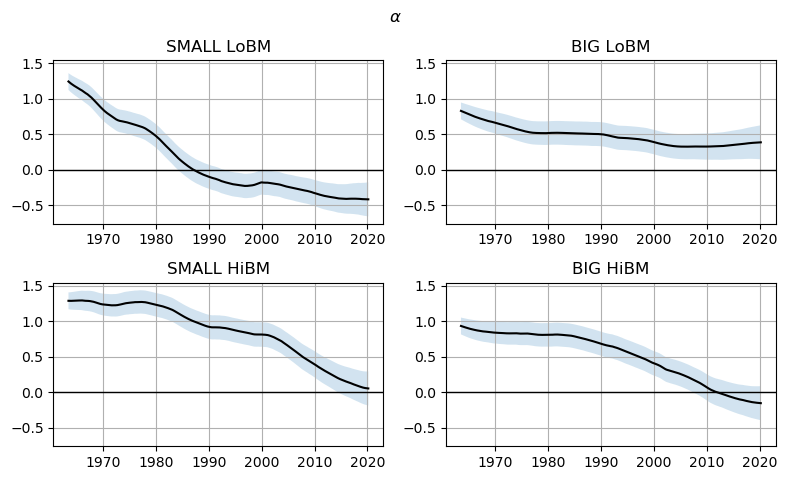

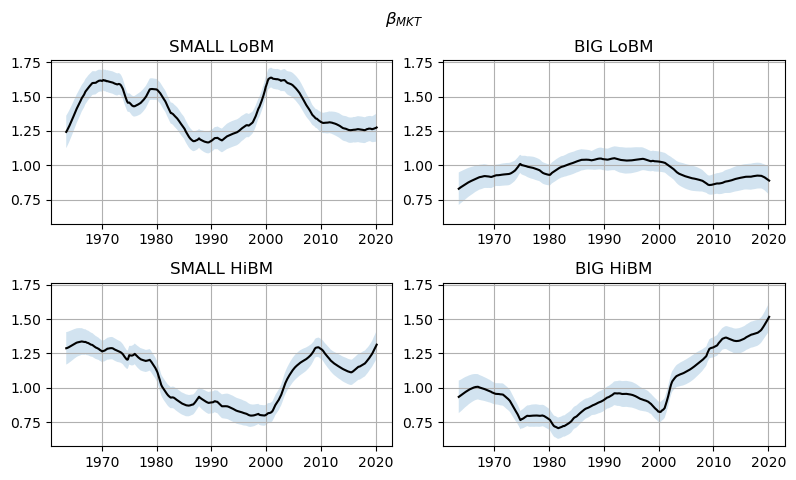

In [291]:
# Plot only the four corner portfolios
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf
f,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,5),sharey=True)
i = 0

corners = ['SMALL LoBM','BIG LoBM','SMALL HiBM','BIG HiBM']

for ex_ret in corners:
    a = ax[i//2,i%2]
    a.axhline(color='k',LineWidth=1)
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['intercept'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['intercept']-2*df_toplot[ex_ret]['SE intercept'],
                   df_toplot[ex_ret]['intercept']+2*df_toplot[ex_ret]['SE intercept'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    #a.xaxis.set_tick_params(rotation=45)
    a.xaxis.set_tick_params(labelbottom=True)
    i+=1
#plt.tight_layout()
plt.suptitle(r'$\alpha$')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.savefig('output/figures/Q2a_CAPM_alpha.pdf')
plt.show()

f,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,5),sharey=True)
i = 0

for ex_ret in corners:
    a = ax[i//2,i%2]
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['slope'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['slope']-2*df_toplot[ex_ret]['SE slope'],
                   df_toplot[ex_ret]['slope']+2*df_toplot[ex_ret]['SE slope'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    #a.xaxis.set_tick_params(rotation=45)
    a.xaxis.set_tick_params(labelbottom=True)
    i+=1

#plt.tight_layout()
plt.suptitle(r'$\beta_{MKT}$')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.savefig('output/figures/Q2a_CAPM_beta_MKT.pdf')
plt.show()

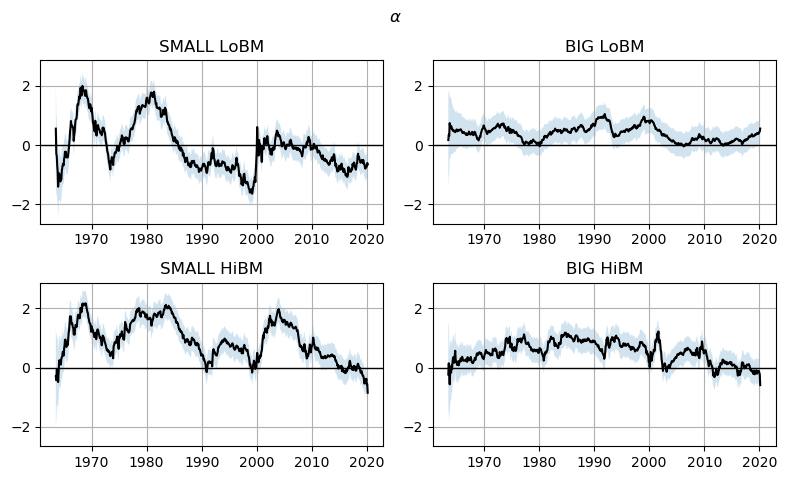

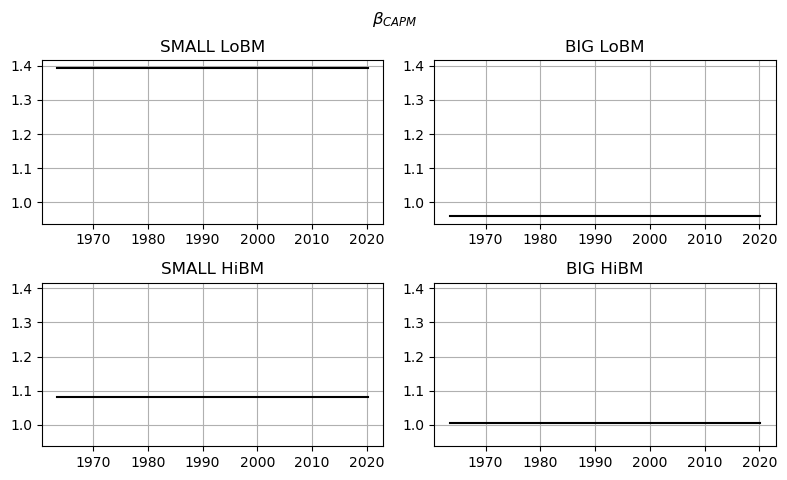

In [294]:
# Plot only the four corner portfolios, with constant beta
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_cst_beta
f,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,5),sharey=True)
i = 0

corners = ['SMALL LoBM','BIG LoBM','SMALL HiBM','BIG HiBM']

for ex_ret in corners:
    a = ax[i//2,i%2]
    a.axhline(color='k',LineWidth=1)
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['intercept'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['intercept']-2*df_toplot[ex_ret]['SE intercept'],
                   df_toplot[ex_ret]['intercept']+2*df_toplot[ex_ret]['SE intercept'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    #a.xaxis.set_tick_params(rotation=45)
    a.xaxis.set_tick_params(labelbottom=True)
    i+=1

#plt.tight_layout()
plt.suptitle(r'$\alpha$')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.savefig('output/figures/Q2a_CAPM_cst_beta_alpha.pdf')
plt.show()

f,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,5),sharey=True)
i = 0

for ex_ret in corners:
    a = ax[i//2,i%2]
    a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
           df_toplot[ex_ret]['slope'], c = 'black')
    a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                   df_toplot[ex_ret]['slope']-2*df_toplot[ex_ret]['SE slope'],
                   df_toplot[ex_ret]['slope']+2*df_toplot[ex_ret]['SE slope'], alpha=0.2)#, facecolor='b')
    a.set_title(ex_ret)
    a.grid(True)
    a.yaxis.set_tick_params(labelbottom=True)
    a.xaxis.set_major_locator(years)
    a.xaxis.set_major_formatter(years_fmt)
    #a.xaxis.set_tick_params(rotation=45)
    a.xaxis.set_tick_params(labelbottom=True)
    i+=1

#plt.tight_layout()
plt.suptitle(r'$\beta_{CAPM}$')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
#plt.savefig('output/figures/Q2a_CAPM_cst_beta_beta_MKT.pdf')
plt.show()

Another possibility would be to use MCMC. In this case, the model takes the form:
\begin{align*}
    r_{t} &= \alpha_{t} + \beta_{t}~r_{M,t} + e_{t} \\
    \alpha_{t+1} &\sim N(\alpha_{t-1}, \sigma^2_\alpha)\\
    \beta_{t+1}  &\sim N(\beta_{t-1}, \sigma^2_\beta)
\end{align*}

For this, we need to define hyper-priors for $\sigma^2_\alpha$ and $\sigma^2_\beta$. This parameter can be interpreted as the volatility in the regression coefficients.
\begin{align*}
    \sigma^2_\alpha &\sim Exp(\alpha_{0})\\
    \sigma^2_\beta  &\sim Exp(\beta_{0})
\end{align*}

All this is performed in lab 8, and is omitted here. The interested reader is referred there for details.

#### (b) Repeat (a) for the 3-factor FF model.

In [263]:
# pykalman
def KF(y, x, state_mean0 = None, state_cov0 = None, delta = 1e-3, smooth = False):
    n = x.shape[2]
    
    if state_cov0 is None:
        trans_cov  = delta / (1 - delta) * np.eye(n)
        state_cov0 = np.ones((n, n))
    else:
        trans_cov  = delta / (1 - delta) * state_cov0
        
    if state_mean0 is None:
        state_mean0 = [0 for i in range(0,n)]
        
    kf = KalmanFilter(n_dim_obs=1, n_dim_state=n, # y is 1-dimensional, (alpha, beta, ...) is n-dimensional
                      initial_state_mean=state_mean0,
                      initial_state_covariance= state_cov0,
                      transition_matrices=np.eye(n),
                      observation_matrices=x,
                      observation_covariance=n,
                      transition_covariance=trans_cov)
    if smooth:
        return kf.smooth(y)
    else:
        return kf.filter(y)

In [264]:
# All 25 FF portfolios
ex_rets   = df_pb2.drop(['Mkt-RF','SMB','HML','RMW','CMA','RF'],axis=1).columns
df_kf_FF3     = {}
slope_ave_FF3 = {}

for ex_ret in ex_rets:
    y = df_pb2[ex_ret]
    x = df_pb2[['Mkt-RF','SMB','HML']]
    X = np.expand_dims(sm.add_constant(x).values,axis=1)
    state_means, state_covs = KF(y, X, delta = 1e-4, smooth = True)
    df_kf_FF3[ex_ret] = pd.DataFrame(state_means, columns = ['alpha','beta_MKT','beta_SMB','beta_HML'])
    df_kf_FF3[ex_ret]['SE alpha'] = state_covs[:,0,0]**.5
    df_kf_FF3[ex_ret]['SE beta_MKT'] = state_covs[:,1,1]**.5
    df_kf_FF3[ex_ret]['SE beta_SMB'] = state_covs[:,2,2]**.5
    df_kf_FF3[ex_ret]['SE beta_HML'] = state_covs[:,3,3]**.5
    df_kf_FF3[ex_ret]['Ex Ret'] = y.values
    df_kf_FF3[ex_ret]['Mkt-RF'] = x.values[:,0]
    df_kf_FF3[ex_ret]['SMB'] = x.values[:,1]
    df_kf_FF3[ex_ret]['HML'] = x.values[:,2]
    df_kf_FF3[ex_ret].index = x.index
    slope_ave_FF3[ex_ret] = df_kf_FF3[ex_ret].describe()[['beta_MKT','beta_SMB','beta_HML']].loc['mean']

In [265]:
# Constant beta
df_kf_FF3_cst_beta = {}

for ex_ret in ex_rets:
    y = df_pb2[ex_ret]
    x = df_pb2[['Mkt-RF','SMB','HML']]
    X = np.expand_dims(sm.add_constant(x).values,axis=1)
    state_means, state_covs = KF(y, X, state_mean0 = np.append(0,slope_ave_FF3[ex_ret].values),
                                 state_cov0 = np.array([[1,0,0,0],[0,0,0,0],[0,0,0,0],[0,0,0,0]]))
    df_kf_FF3_cst_beta[ex_ret] = pd.DataFrame(state_means, columns = ['alpha','beta_MKT','beta_SMB','beta_HML'])
    df_kf_FF3_cst_beta[ex_ret]['SE alpha'] = state_covs[:,0,0]**.5
    df_kf_FF3_cst_beta[ex_ret]['SE beta_MKT'] = state_covs[:,1,1]**.5
    df_kf_FF3_cst_beta[ex_ret]['SE beta_SMB'] = state_covs[:,2,2]**.5
    df_kf_FF3_cst_beta[ex_ret]['SE beta_HML'] = state_covs[:,3,3]**.5
    df_kf_FF3_cst_beta[ex_ret]['Ex Ret'] = y.values
    df_kf_FF3_cst_beta[ex_ret]['Mkt-RF'] = x.values[:,0]
    df_kf_FF3_cst_beta[ex_ret]['SMB'] = x.values[:,1]
    df_kf_FF3_cst_beta[ex_ret]['HML'] = x.values[:,2]
    df_kf_FF3_cst_beta[ex_ret].index = x.index

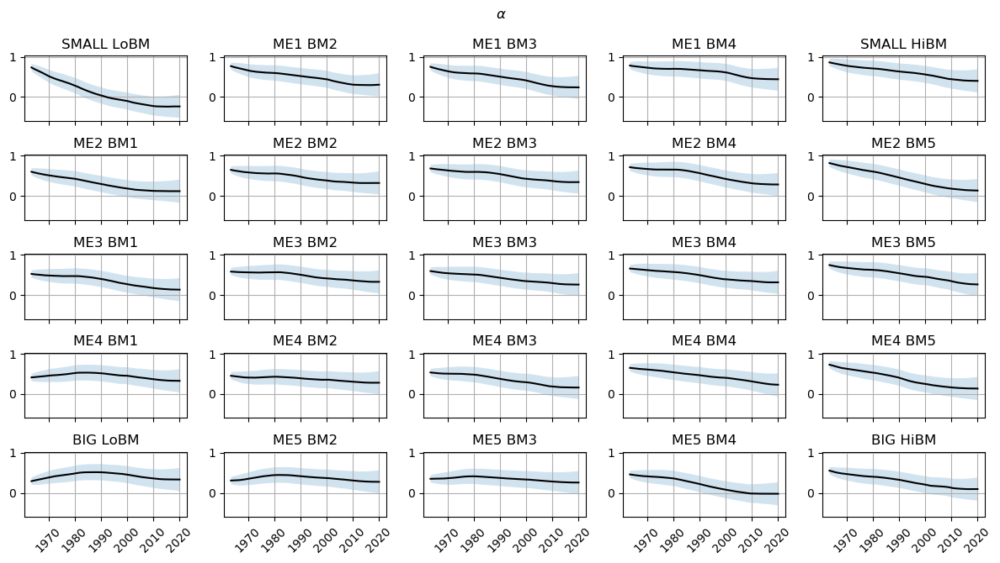

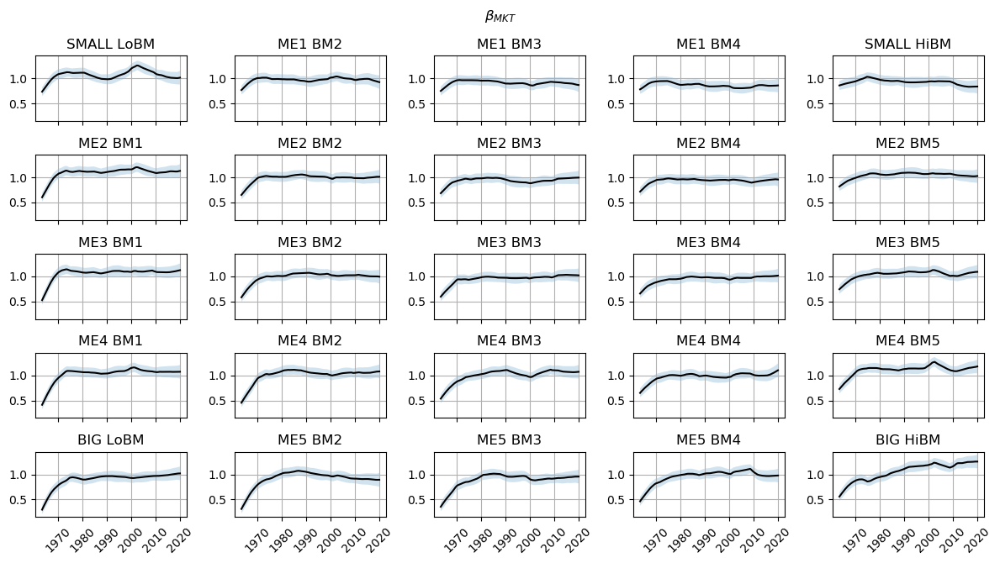

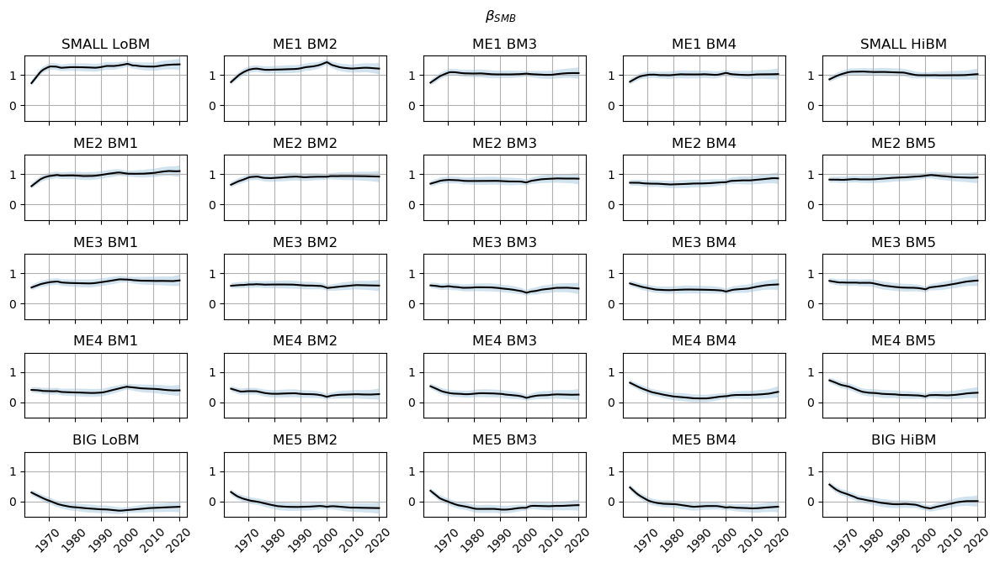

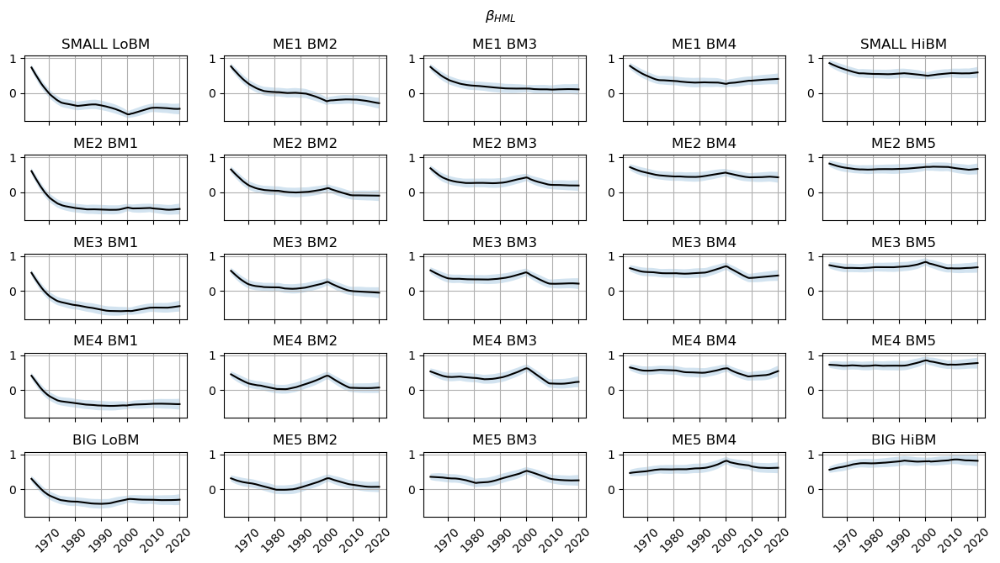

In [268]:
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_FF3
vars = ['alpha','beta_MKT','beta_SMB','beta_HML']
labels = [r'$\alpha$',r'$\beta_{MKT}$',r'$\beta_{SMB}$',r'$\beta_{HML}$']

for l in range(0,4):
    f,ax = plt.subplots(nrows=5,ncols=5,figsize=(12,7),sharey=True)
    i = 0
    
    var = vars[l]
    lab = labels[l]

    for ex_ret in ex_rets:
        a = ax[i//5,i%5]
        a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
               df_toplot[ex_ret][var], c = 'black')
        a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                       df_toplot[ex_ret][var]-2*df_toplot[ex_ret]['SE '+var],
                       df_toplot[ex_ret][var]+2*df_toplot[ex_ret]['SE '+var], alpha=0.2)#, facecolor='b')
        a.set_title(ex_ret)
        a.grid(True)
        a.yaxis.set_tick_params(labelbottom=True)
        a.xaxis.set_major_locator(years)
        a.xaxis.set_major_formatter(years_fmt)
        a.xaxis.set_tick_params(rotation=45)
        if i//5 != 4:
            a.xaxis.set_tick_params(labelbottom=False)
        i+=1

    #plt.tight_layout()
    plt.suptitle(lab)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

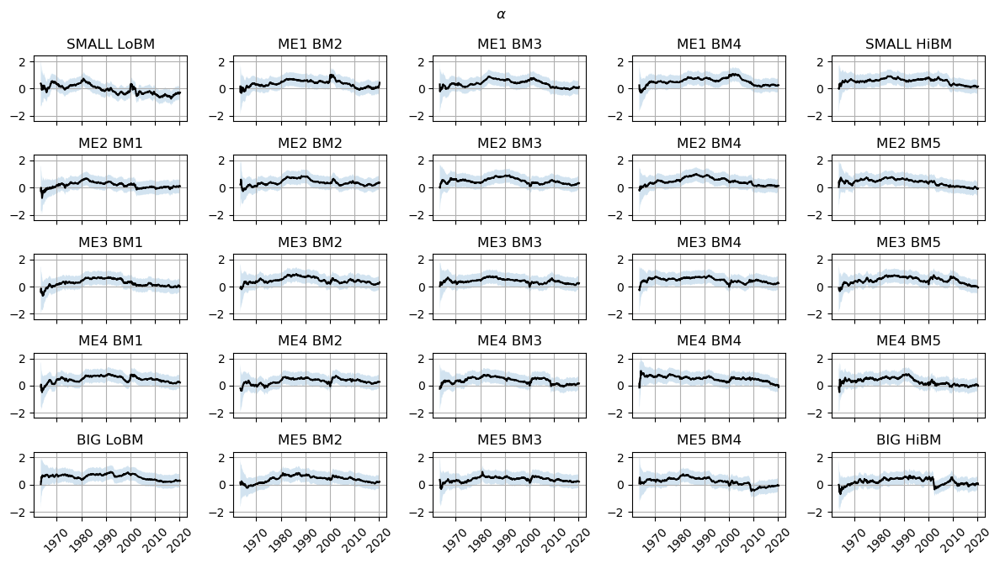

In [271]:
# Plot the constant beta case
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_FF3_cst_beta
vars = ['alpha','beta_MKT','beta_SMB','beta_HML']
labels = [r'$\alpha$',r'$\beta_{MKT}$',r'$\beta_{SMB}$',r'$\beta_{HML}$']

for l in range(0,1):
    f,ax = plt.subplots(nrows=5,ncols=5,figsize=(12,7),sharey=True)
    i = 0
    
    var = vars[l]
    lab = labels[l]

    for ex_ret in ex_rets:
        a = ax[i//5,i%5]
        a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
               df_toplot[ex_ret][var], c = 'black')
        a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                       df_toplot[ex_ret][var]-2*df_toplot[ex_ret]['SE '+var],
                       df_toplot[ex_ret][var]+2*df_toplot[ex_ret]['SE '+var], alpha=0.2)#, facecolor='b')
        a.set_title(ex_ret)
        a.grid(True)
        a.yaxis.set_tick_params(labelbottom=True)
        a.xaxis.set_major_locator(years)
        a.xaxis.set_major_formatter(years_fmt)
        a.xaxis.set_tick_params(rotation=45)
        if i//5 != 4:
            a.xaxis.set_tick_params(labelbottom=False)
        i+=1

    #plt.tight_layout()
    plt.suptitle(lab)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

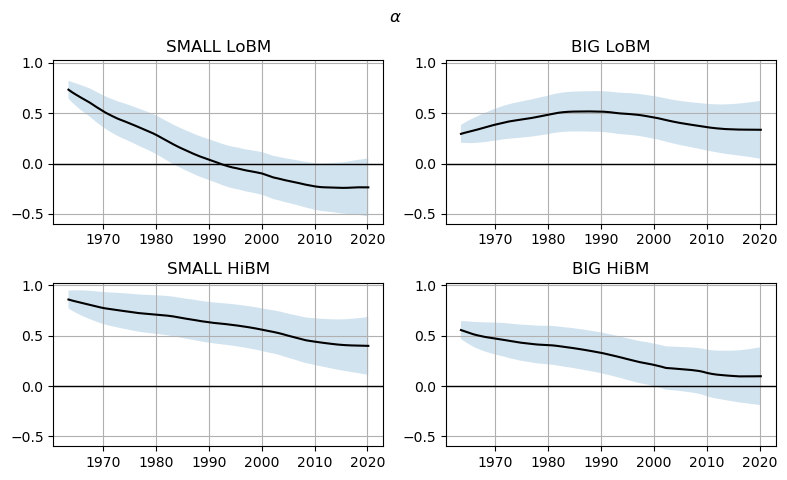

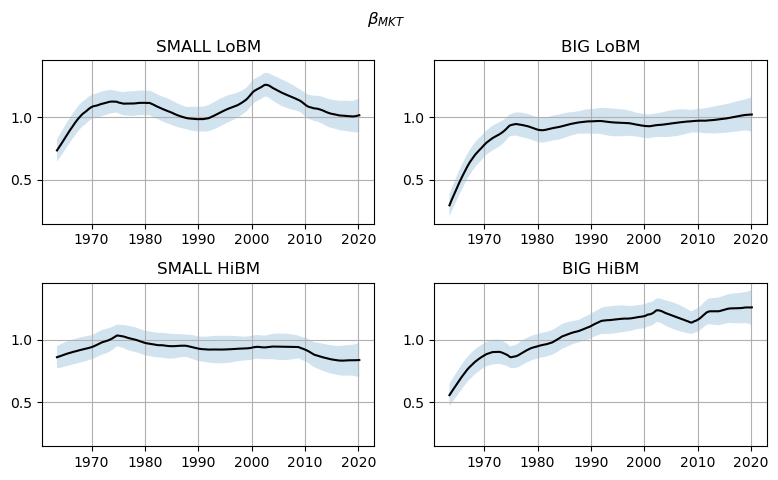

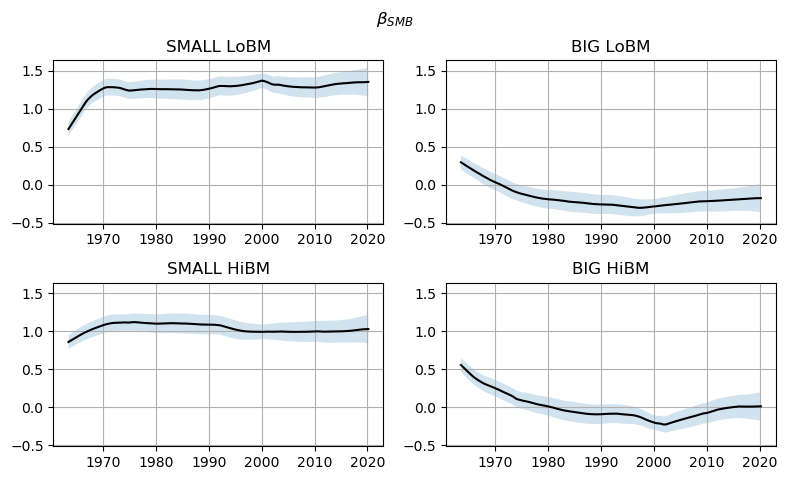

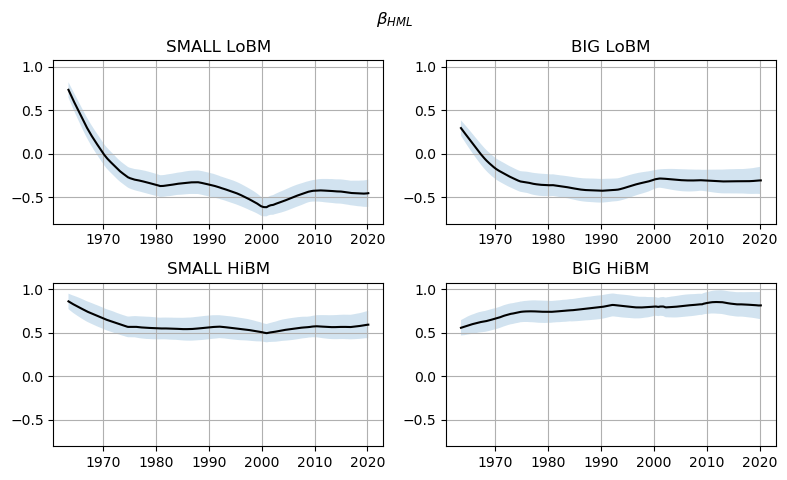

In [296]:
# Plot only the four corner portfolios
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_FF3
corners = ['SMALL LoBM','BIG LoBM','SMALL HiBM','BIG HiBM']

vars = ['alpha','beta_MKT','beta_SMB','beta_HML']
labels = [r'$\alpha$',r'$\beta_{MKT}$',r'$\beta_{SMB}$',r'$\beta_{HML}$']

for l in range(0,4):
    f,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,5),sharey=True)
    i = 0
    
    var = vars[l]
    lab = labels[l]
    
    for ex_ret in corners:
        a = ax[i//2,i%2]
        if var == 'alpha':
            a.axhline(color='k',LineWidth=1)
        a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
               df_toplot[ex_ret][var], c = 'black')
        a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                       df_toplot[ex_ret][var]-2*df_toplot[ex_ret]['SE '+var],
                       df_toplot[ex_ret][var]+2*df_toplot[ex_ret]['SE '+var], alpha=0.2)#, facecolor='b')
        a.set_title(ex_ret)
        a.grid(True)
        a.yaxis.set_tick_params(labelbottom=True)
        a.xaxis.set_major_locator(years)
        a.xaxis.set_major_formatter(years_fmt)
        #a.xaxis.set_tick_params(rotation=45)
        a.xaxis.set_tick_params(labelbottom=True)
        i+=1
    #plt.tight_layout()
    plt.suptitle(lab)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('output/figures/Q2b_FF3_'+var+'.pdf')
    plt.show()

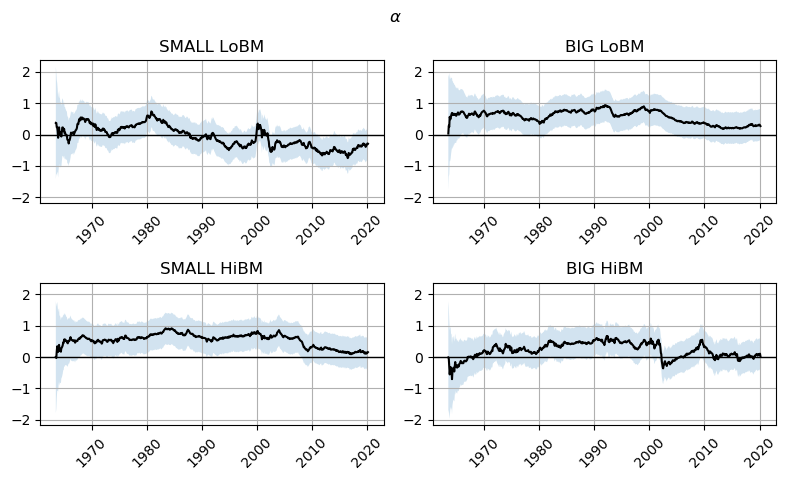

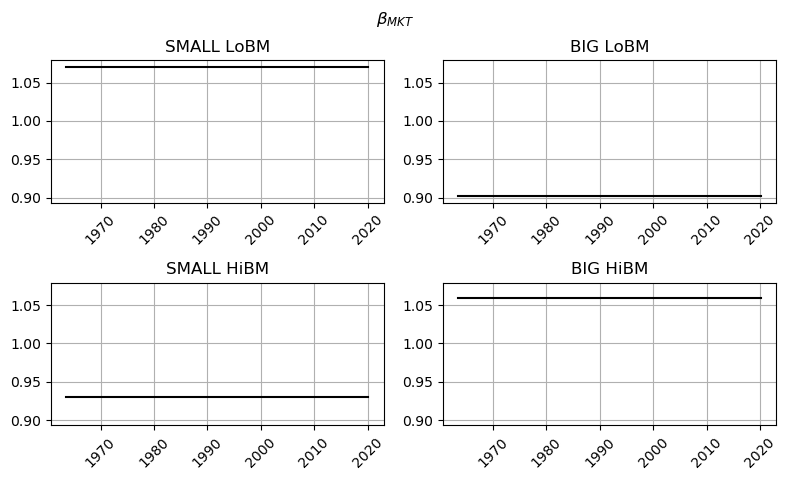

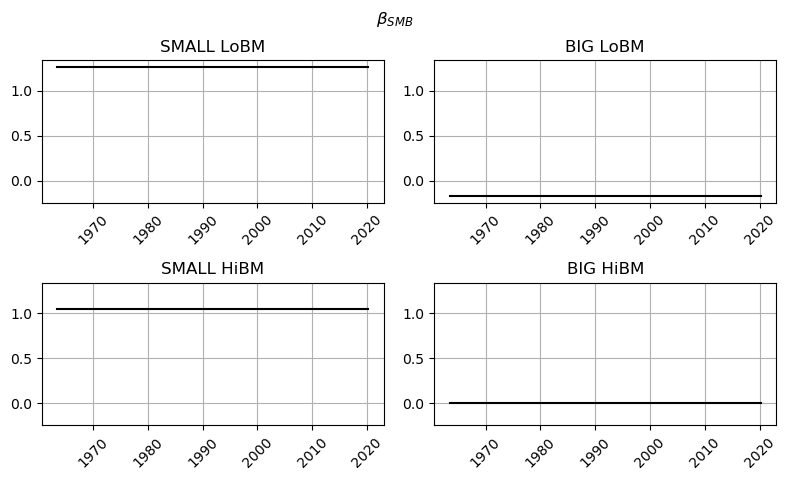

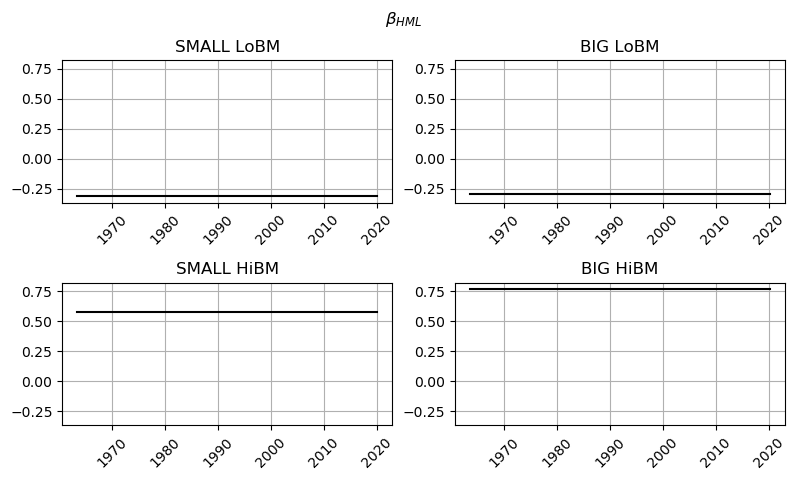

In [298]:
# Plot only the four corner portfolios
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_FF3_cst_beta
corners = ['SMALL LoBM','BIG LoBM','SMALL HiBM','BIG HiBM']

vars = ['alpha','beta_MKT','beta_SMB','beta_HML']
labels = [r'$\alpha$',r'$\beta_{MKT}$',r'$\beta_{SMB}$',r'$\beta_{HML}$']

for l in range(0,4):
    f,ax = plt.subplots(nrows=2,ncols=2,figsize=(8,5),sharey=True)
    i = 0
    
    var = vars[l]
    lab = labels[l]
    
    for ex_ret in corners:
        a = ax[i//2,i%2]
        if var == 'alpha':
            a.axhline(color='k',LineWidth=1)
        a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
               df_toplot[ex_ret][var], c = 'black')
        a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                       df_toplot[ex_ret][var]-2*df_toplot[ex_ret]['SE '+var],
                       df_toplot[ex_ret][var]+2*df_toplot[ex_ret]['SE '+var], alpha=0.2)#, facecolor='b')
        a.set_title(ex_ret)
        a.grid(True)
        a.yaxis.set_tick_params(labelbottom=True)
        a.xaxis.set_major_locator(years)
        a.xaxis.set_major_formatter(years_fmt)
        a.xaxis.set_tick_params(rotation=45)
        a.xaxis.set_tick_params(labelbottom=True)
        i+=1
    #plt.tight_layout()
    plt.suptitle(lab)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('output/figures/Q2b_FF3_cst_beta_'+var+'.pdf')
    plt.show()

#### (c) Next, estimate the model for monthly Microsoft and IBM returns.

In [299]:
def get_mkt_beta(ticker, st, end, freq = "M", nw=False, lags=None, X = ['Mkt-RF'], 
                 print_results = True, return_results = False):
    
    if (freq == 'D'):
        ff_factors = web.DataReader('F-F_Research_Data_5_Factors_2x3_daily','famafrench', start=dt_start)

        ff5_full         = ff_factors[0] 
        ff5_full['date'] = ff5_full.index

        df         = yf.download(ticker, start = st_date, end = ed_date, progress=False, interval = "1d")
        df['date'] = df.index
        
    if (freq == 'M'):
        ff_factors = web.DataReader('F-F_Research_Data_5_Factors_2x3','famafrench', start=dt_start)
        ff5_full         = ff_factors[0] 
        ff5_full['date'] = ff5_full.index.to_series().astype(str)
        
        df         = yf.download(ticker, start = st_date, end = ed_date, progress=False, interval = "1mo")
        df['date'] = [s[0:7] for s in df.index.to_series().astype(str)]
        
    if (freq == 'Y'):
        ff_factors = web.DataReader('F-F_Research_Data_5_Factors_2x3','famafrench', start=dt_start)

        ff5_full         = ff_factors[1] 
        ff5_full['date'] = ff5_full.index.to_series().astype(str)
        
        df         = yf.download(ticker, start = st_date, end = ed_date, progress=False, interval = "1mo").dropna()
        df['date'] = [s[0:4] for s in df.index.to_series().astype(str)]
        df['m']    = [s[5:7] for s in df.index.to_series().astype(str)]
        df         = df.loc[df['m'] == '12',:]
        
        
    df_ff           = df.merge(ff5_full, left_on='date', right_on='date', how = 'outer').dropna()
    df_ff['ret']    = np.log(df_ff['Adj Close']).diff()*100
    df_ff['ex_ret'] = df_ff['ret'] - df_ff['RF']
    df_ff           = df_ff.dropna()
    df_ff.index     = df_ff.date
    
    ols             = sm.OLS(df_ff['ex_ret'], sm.add_constant(df_ff[X]), missing='drop').fit()
    if print_results:
        if nw:
            if lags is None:
                nlags   = math.floor(4*(df_ff.shape[0]/100)**(2/9))
            print(ols.get_robustcov_results(cov_type='HAC', maxlags=lags).summary()) 
        else:
            print(ols.summary()) 
    if return_results:
        return ols, df_ff


In [300]:
ff1 = ['Mkt-RF']
ff3 = ['Mkt-RF', 'SMB', 'HML']
ff5 = ['Mkt-RF', 'SMB', 'HML', 'CMA', 'RMW']
all = ['ret', 'Mkt-RF', 'SMB', 'HML', 'CMA', 'RMW']

In [301]:
# Define Period
st_date    = '1920-01-01'
ed_date    = '2021-01-01'

In [302]:
# Calculate FF 5-factor risk adjusted beta for MSFT
ticker     = 'MSFT'
res_m_ff5, df_m_ff5 = get_mkt_beta(ticker=ticker, st=st_date, end=ed_date, freq = "M", X = ff5, 
             return_results = True)
beta_m_ff5 = res_m_ff5.params[1]
se_m_ff5   = res_m_ff5.bse[1]

                            OLS Regression Results                            
Dep. Variable:                 ex_ret   R-squared:                       0.413
Model:                            OLS   Adj. R-squared:                  0.406
Method:                 Least Squares   F-statistic:                     56.67
Date:                Sun, 17 May 2020   Prob (F-statistic):           1.56e-44
Time:                        15:52:03   Log-Likelihood:                -1384.3
No. Observations:                 408   AIC:                             2781.
Df Residuals:                     402   BIC:                             2805.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1817      0.378      3.125      0.0

In [303]:
df_pb2c = df_m_ff5[['Mkt-RF','SMB', 'HML', 'RMW', 'CMA', 'RF', 'ret', 'ex_ret']]
df_pb2c.rename(columns={'ret':'r_MSFT','ex_ret':'er_MSFT'},inplace=True)

In [304]:
# calculate FF 5-factor risk adjusted beta for IMB
ticker     = 'IBM'
res_m_ff5, df_m_ff5 = get_mkt_beta(ticker=ticker, st=st_date, end=ed_date, freq = "M", X = ff5, 
             return_results = True)
beta_m_ff5 = res_m_ff5.params[1]
se_m_ff5   = res_m_ff5.bse[1]

                            OLS Regression Results                            
Dep. Variable:                 ex_ret   R-squared:                       0.352
Model:                            OLS   Adj. R-squared:                  0.347
Method:                 Least Squares   F-statistic:                     73.13
Date:                Sun, 17 May 2020   Prob (F-statistic):           3.66e-61
Time:                        15:52:10   Log-Likelihood:                -2125.3
No. Observations:                 680   AIC:                             4263.
Df Residuals:                     674   BIC:                             4290.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0129      0.222     -0.058      0.9

In [310]:
df_pb2c = df_pb2c.merge(df_m_ff5[['ret','ex_ret']],left_index=True,right_index=True)
df_pb2c.rename(columns={'ret':'r_IBM','ex_ret':'er_IBM'},inplace=True)
df_pb2c.index = pd.PeriodIndex(df_pb2c.index,freq='M') # To match the format from the FF dataset below

In [311]:
# Excess returns on Microsoft and IBM
ex_rets   = ['er_MSFT','er_IBM']
df_kf_indiv_FF3     = {}
slope_ave_indiv_FF3 = {}

for ex_ret in ex_rets:
    y = df_pb2c[ex_ret]
    x = df_pb2c[['Mkt-RF','SMB','HML']]
    X = np.expand_dims(sm.add_constant(x).values,axis=1)
    state_means, state_covs = KF(y, X, delta = 1e-4, smooth = True)
    df_kf_indiv_FF3[ex_ret] = pd.DataFrame(state_means, columns = ['alpha','beta_MKT','beta_SMB','beta_HML'])
    df_kf_indiv_FF3[ex_ret]['SE alpha'] = state_covs[:,0,0]**.5
    df_kf_indiv_FF3[ex_ret]['SE beta_MKT'] = state_covs[:,1,1]**.5
    df_kf_indiv_FF3[ex_ret]['SE beta_SMB'] = state_covs[:,2,2]**.5
    df_kf_indiv_FF3[ex_ret]['SE beta_HML'] = state_covs[:,3,3]**.5
    df_kf_indiv_FF3[ex_ret]['Ex Ret'] = y.values
    df_kf_indiv_FF3[ex_ret]['Mkt-RF'] = x.values[:,0]
    df_kf_indiv_FF3[ex_ret]['SMB'] = x.values[:,1]
    df_kf_indiv_FF3[ex_ret]['HML'] = x.values[:,2]
    df_kf_indiv_FF3[ex_ret].index = x.index
    slope_ave_indiv_FF3[ex_ret] = df_kf_indiv_FF3[ex_ret].describe()[['beta_MKT','beta_SMB','beta_HML']].loc['mean']

In [325]:
# Constant beta
ex_rets   = ['er_MSFT','er_IBM']
df_kf_indiv_FF3_cst_beta = {}

for ex_ret in ex_rets:
    y = df_pb2c[ex_ret]
    x = df_pb2c[['Mkt-RF','SMB','HML']]
    X = np.expand_dims(sm.add_constant(x).values,axis=1)
    state_means, state_covs = KF(y, X, state_mean0 = np.append(0,slope_ave_indiv_FF3[ex_ret].values),
                                 state_cov0 = np.array([[1,0,0,0],[0,0,0,0],[0,0,0,0],[0,0,0,0]]))
    df_kf_indiv_FF3_cst_beta[ex_ret] = pd.DataFrame(state_means, columns = ['alpha','beta_MKT','beta_SMB','beta_HML'])
    df_kf_indiv_FF3_cst_beta[ex_ret]['SE alpha'] = state_covs[:,0,0]**.5
    df_kf_indiv_FF3_cst_beta[ex_ret]['SE beta_MKT'] = state_covs[:,1,1]**.5
    df_kf_indiv_FF3_cst_beta[ex_ret]['SE beta_SMB'] = state_covs[:,2,2]**.5
    df_kf_indiv_FF3_cst_beta[ex_ret]['SE beta_HML'] = state_covs[:,3,3]**.5
    df_kf_indiv_FF3_cst_beta[ex_ret]['Ex Ret'] = y.values
    df_kf_indiv_FF3_cst_beta[ex_ret]['Mkt-RF'] = x.values[:,0]
    df_kf_indiv_FF3_cst_beta[ex_ret]['SMB'] = x.values[:,1]
    df_kf_indiv_FF3_cst_beta[ex_ret]['HML'] = x.values[:,2]
    df_kf_indiv_FF3_cst_beta[ex_ret].index = x.index

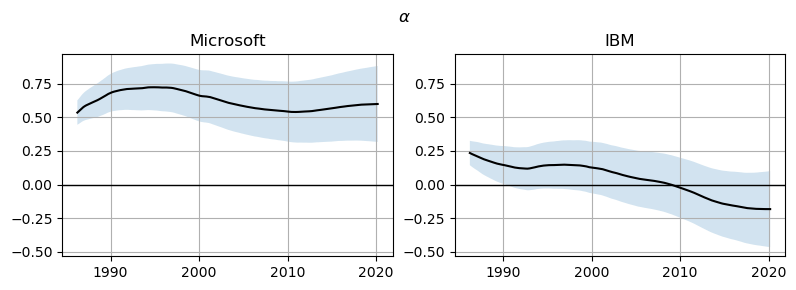

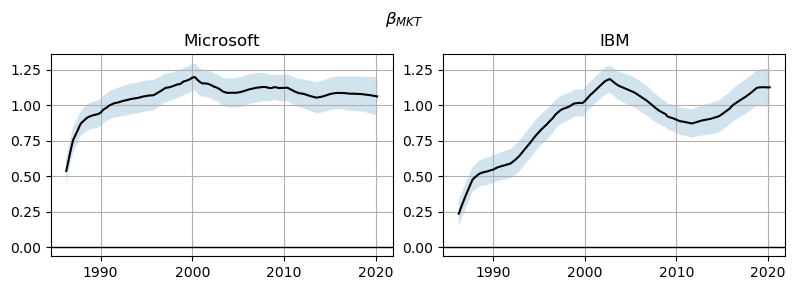

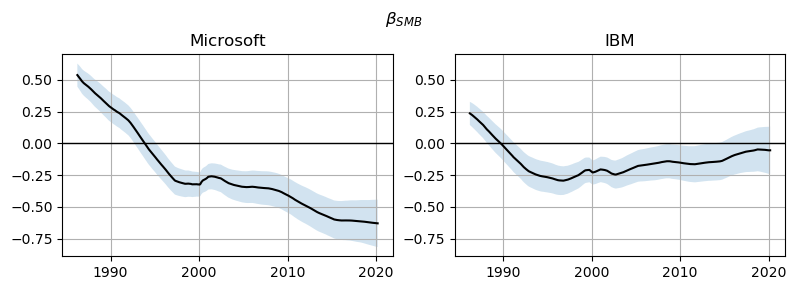

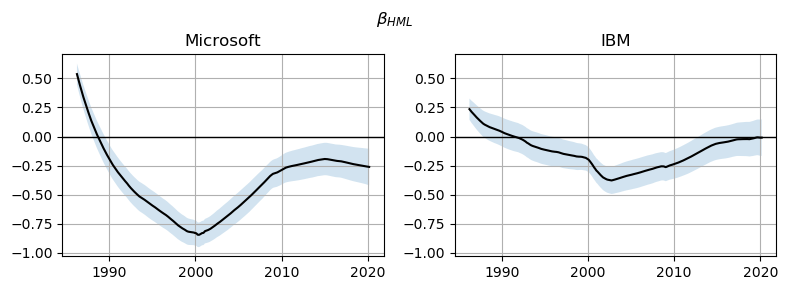

In [330]:
# Individual stocks
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_indiv_FF3

vars = ['alpha','beta_MKT','beta_SMB','beta_HML']
labels = [r'$\alpha$',r'$\beta_{MKT}$',r'$\beta_{SMB}$',r'$\beta_{HML}$']
labels2 = {}
labels2['er_MSFT'] = 'Microsoft'
labels2['er_IBM'] = 'IBM'

for l in range(0,4):

    var = vars[l]
    lab = labels[l]
    
    f,ax = plt.subplots(nrows=1,ncols=2,figsize=(8,3),sharey=True)
    i = 0

    for ex_ret in ex_rets:
        a = ax[i%2]
        a.axhline(color='black',LineWidth=1)
        a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
               df_toplot[ex_ret][var], c = 'black')
        a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                       df_toplot[ex_ret][var]-2*df_toplot[ex_ret]['SE '+var],
                       df_toplot[ex_ret][var]+2*df_toplot[ex_ret]['SE '+var], alpha=0.2)#, facecolor='b')
        a.set_title(labels2[ex_ret])
        a.grid(True)
        a.yaxis.set_tick_params(labelbottom=True)
        a.xaxis.set_major_locator(years)
        a.xaxis.set_major_formatter(years_fmt)
        #a.xaxis.set_tick_params(rotation=45)
        a.xaxis.set_tick_params(labelbottom=True)
        i+=1

    #plt.tight_layout()
    plt.suptitle(lab)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('output/figures/Q2c_indiv_FF3_'+var+'.pdf')
    plt.show()

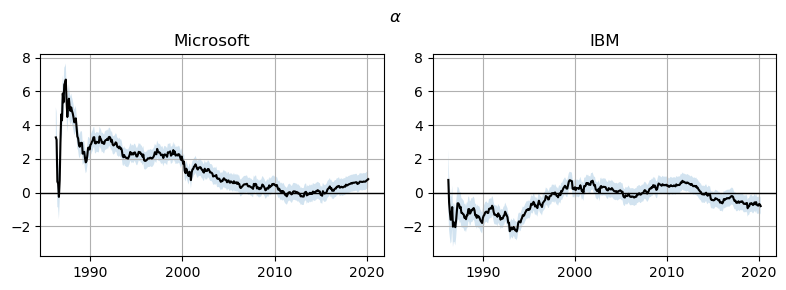

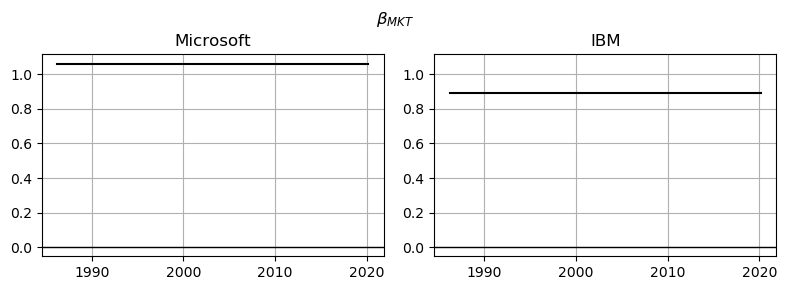

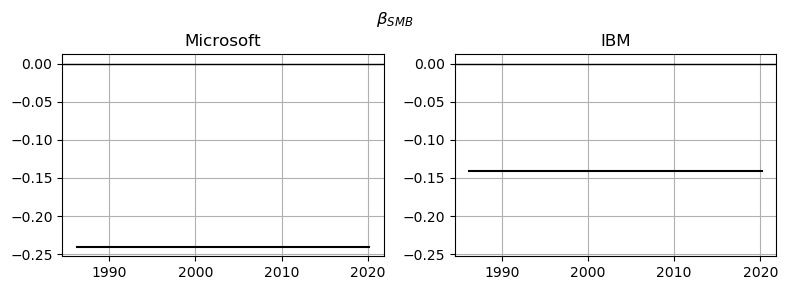

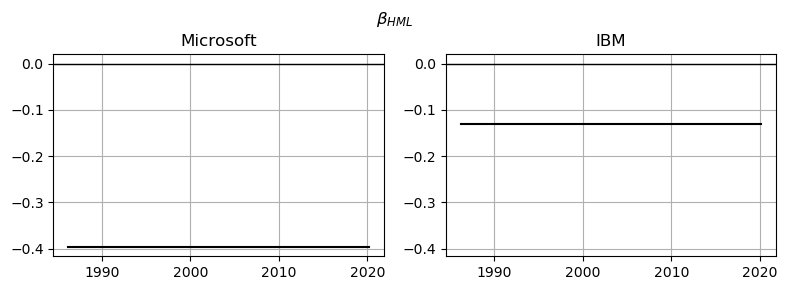

In [332]:
# Individual stocks, constant beta
years     = mdates.YearLocator(10)
months    = mdates.MonthLocator()
years_fmt = mdates.DateFormatter('%Y')

df_toplot = df_kf_indiv_FF3_cst_beta

vars = ['alpha','beta_MKT','beta_SMB','beta_HML']
labels = [r'$\alpha$',r'$\beta_{MKT}$',r'$\beta_{SMB}$',r'$\beta_{HML}$']
labels2 = {}
labels2['er_MSFT'] = 'Microsoft'
labels2['er_IBM'] = 'IBM'

for l in range(0,4):

    var = vars[l]
    lab = labels[l]
    
    f,ax = plt.subplots(nrows=1,ncols=2,figsize=(8,3),sharey=True)
    i = 0

    for ex_ret in ex_rets:
        a = ax[i%2]
        a.axhline(color='black',LineWidth=1)
        a.plot(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
               df_toplot[ex_ret][var], c = 'black')
        a.fill_between(df_toplot[ex_ret].index.to_timestamp().to_pydatetime(),
                       df_toplot[ex_ret][var]-2*df_toplot[ex_ret]['SE '+var],
                       df_toplot[ex_ret][var]+2*df_toplot[ex_ret]['SE '+var], alpha=0.2)#, facecolor='b')
        a.set_title(labels2[ex_ret])
        a.grid(True)
        a.yaxis.set_tick_params(labelbottom=True)
        a.xaxis.set_major_locator(years)
        a.xaxis.set_major_formatter(years_fmt)
        #a.xaxis.set_tick_params(rotation=45)
        a.xaxis.set_tick_params(labelbottom=True)
        i+=1

    #plt.tight_layout()
    plt.suptitle(lab)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('output/figures/Q2c_indiv_FF3_cst_beta_'+var+'.pdf')
    plt.show()

#### (d) Compare the results for individual stocks to the results for portfolios.

Cf. solutions.